# Download the dataset and supporting codes and pre-trained models

https://drive.google.com/file/d/1D3m6I2S8xIvdOHBkvwSSFof5OTJZCDSt/view?usp=drivesdk

https://drive.google.com/file/d/1CDRMyBA3Hk_gmbk1xkAm7aRHXBOQQigu/view?usp=drivesdk

https://drive.google.com/file/d/1so6AQ0_Pg255COjAzEOOVPlDzTJFVQro/view?usp=drivesdk

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
from google.colab import auth
auth.authenticate_user()
from googleapiclient.discovery import build
drive_service = build('drive', 'v3')
import io
import os
from googleapiclient.http import MediaIoBaseDownload
def download_file(fn, file_id):
    request = drive_service.files().get_media(fileId=file_id)
    downloaded = io.BytesIO()
    downloader = MediaIoBaseDownload(downloaded, request)
    done = False
    while done is False:
        # _ is a placeholder for a progress object that we ignore.
        # (Our file is small, so we skip reporting progress.)
        _, done = downloader.next_chunk()
    downloaded.seek(0)
    folder = fn.split('/')
    if len(folder) > 1:
        os.makedirs(folder[0], exist_ok=True)
    with open(fn, 'wb') as f:
        f.write(downloaded.read())
id_to_fn = {
# '1D3rH-gSxIECZnoyc5k77PEucKBVzoiBc': 'edges2shoes.zip',
'1D3m6I2S8xIvdOHBkvwSSFof5OTJZCDSt': 'edges2shoes.zip',
'1CDRMyBA3Hk_gmbk1xkAm7aRHXBOQQigu': 'CycleGAN_support.zip',
# '1so6AQ0_Pg255COjAzEOOVPlDzTJFVQro': 'test_case.zip',
'1l7gHikhCz64hYHL4n_Ps7nufQcddcRyR': 'test_case.zip'

}
# download all files into the vm
for fid, fn in id_to_fn.items():
    print("Downloading %s from %s" % (fn, fid))
    download_file(fn, fid)

In [4]:
! unzip -q edges2shoes.zip
! unzip -q CycleGAN_support.zip
! unzip -q test_case.zip

replace edges2shoes/train/48543_AB.jpg? [y]es, [n]o, [A]ll, [N]one, [r]ename: NONE
replace models.py? [y]es, [n]o, [A]ll, [N]one, [r]ename: NONE
replace test_case/G_AB.pt? [y]es, [n]o, [A]ll, [N]one, [r]ename: NONE


# CycleGAN training (TODO)

In [5]:
import torch
import pdb

D_A = torch.load('test_case/D_A.pt')
D_B = torch.load('test_case/D_B.pt')
G_BA = torch.load('test_case/G_BA.pt')
G_AB = torch.load('test_case/G_AB.pt')
valid = torch.load('test_case/valid.pt')
fake = torch.load('test_case/fake.pt')
fake_A = torch.load('test_case/fake_A.pt')
fake_B = torch.load('test_case/fake_B.pt')
real_A = torch.load('test_case/real_A.pt')
real_B = torch.load('test_case/real_B.pt')
criterion_GAN = torch.load('test_case/criterion_GAN.pt')
criterion_cycle = torch.load('test_case/criterion_cycle.pt')



def loss_discriminator(fakefG, D, real2D, valid, fake, criterion_GAN):
    '''
    loss_discriminator function is applied to compute loss for discriminator D_A and D_B,
    For example, we want to compute loss for D_A. The loss is consisted of two parts: 
    D(real_A) and D(G(real_B)). We want to penalize the distance between D(real_A) part and 1 and 
    distance between D(G(real_B)) part and 0. 
    We will want to first compute discriminator loss given real_A and valid, which is all 1.
    Then we want to forward real_A through G_AB network to get fake image batch 
    and compute discriminator loss given fake batch and fake, which is all 0.
    Finall, add up these two loss as the total discriminator loss.
    '''

    D_A = D(real2D)
    D_GB = D(fakefG)
    loss_real = criterion_GAN(D_A,valid)
    loss_fake = criterion_GAN(D_GB,fake)
    loss_D = loss_real + loss_fake
    

    return loss_D



def loss_generator(G, real2G, D, valid, criterion_GAN):
    '''
    loss_generator function is applied to compute loss for both generator G_AB and G_BA:
    For example, we want to compute the loss for G_AB.
    real2G will be the real image in domain A, then we map real2G into domain B to get fake B,
    then we compute the loss between D_B(fake_B) and valid, which is all 1.
    The fake_B image will also be one of the outputs, since we want to use it in the loss_cycle_consis.
    '''
    
    fake_o_G = G(real2G)
    D_B = D(fake_o_G) 

    loss_G = criterion_GAN(D_B,valid)
    return loss_G, fake_o_G



def loss_cycle_consis(G, fakefG, real, criterion_cycle):
    '''
    loss_cycle_consis function is applied to both cycle consistency loss:
    between recovered A and original A,
    between recovered B and original B.
    For example, we want to compute the cycle consistency loss between recovered A and original A.
    fake2G will be the generated image in domain B, then we map fake2G back into domain A to get recovered A,
    then we compute the loss between recovered A and original A
    '''
    
    recovered_img = G(fakefG)
    loss_cycle = criterion_cycle(recovered_img,real)

    return loss_cycle


# test case

test_loss_GAN_AB = torch.load('test_case/loss_GAN_AB.pt')
test_loss_cycle_A = torch.load('test_case/loss_cycle_A.pt')
test_loss_D_A = torch.load('test_case/loss_D_A.pt')
loss_GAN_AB, fake_B = loss_generator(G_AB, real_A, D_B, valid, criterion_GAN)
loss_cycle_A = loss_cycle_consis(G_BA, fake_B, real_A, criterion_cycle)
loss_D_A = loss_discriminator(fake_A, D_A, real_A, valid, fake, criterion_GAN)


print('test case loss_D_A:', test_loss_D_A.item())
print('computed loss_D_A:', loss_D_A.item())

print('test case test_loss_GAN_AB:', test_loss_GAN_AB.item())
print('computed test_loss_GAN_AB:', loss_GAN_AB.item())

print('test case loss_cycle_A:', test_loss_cycle_A.item())
print('computed loss_cycle_A:', loss_cycle_A.item())

test case loss_D_A: 3.1760239601135254
computed loss_D_A: 3.1760239601135254
test case test_loss_GAN_AB: 3.164881467819214
computed test_loss_GAN_AB: 3.164881467819214
test case loss_cycle_A: 0.6627261638641357
computed loss_cycle_A: 0.6627261638641357


the length of training data: 49825


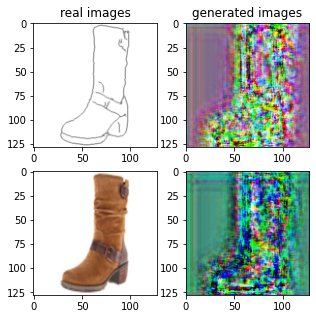

Train Epoch: 1 0% 	Total Loss: 11.031428 	Loss_G_AB: 2.061337	Loss_G_BA: 1.814032	Loss_cycle: 5.614405	Loss_D_A: 1.435559	Loss_D_B: 2.043780
0 9 T:  1.25614333152771
Train Epoch: 1 0% 	Total Loss: 7.320103 	Loss_G_AB: 2.023207	Loss_G_BA: 1.624438	Loss_cycle: 2.222562	Loss_D_A: 1.403940	Loss_D_B: 1.869779
0 19 T:  0.6735749244689941
Train Epoch: 1 0% 	Total Loss: 5.330669 	Loss_G_AB: 1.258434	Loss_G_BA: 1.349317	Loss_cycle: 2.073523	Loss_D_A: 1.052214	Loss_D_B: 0.901055
0 29 T:  0.6596636772155762
Train Epoch: 1 0% 	Total Loss: 3.606742 	Loss_G_AB: 0.795862	Loss_G_BA: 0.788022	Loss_cycle: 1.873635	Loss_D_A: 0.528707	Loss_D_B: 0.412458
0 39 T:  0.6676430702209473
Train Epoch: 1 0% 	Total Loss: 3.154434 	Loss_G_AB: 0.654885	Loss_G_BA: 0.799331	Loss_cycle: 1.591259	Loss_D_A: 0.475102	Loss_D_B: 0.360965
0 49 T:  0.6578404903411865
Train Epoch: 1 0% 	Total Loss: 3.063060 	Loss_G_AB: 0.745789	Loss_G_BA: 0.830132	Loss_cycle: 1.403181	Loss_D_A: 0.397036	Loss_D_B: 0.474882
0 59 T:  0.64587211608

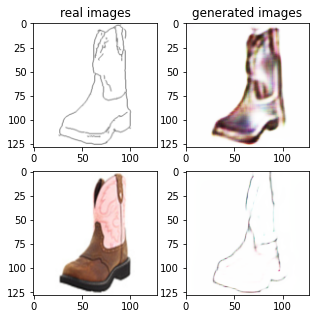

Train Epoch: 1 2% 	Total Loss: 1.610955 	Loss_G_AB: 0.401959	Loss_G_BA: 0.798893	Loss_cycle: 0.671479	Loss_D_A: 0.116543	Loss_D_B: 0.222507
0 1009 T:  1.4931151866912842
Train Epoch: 1 2% 	Total Loss: 1.879887 	Loss_G_AB: 0.311395	Loss_G_BA: 0.843131	Loss_cycle: 0.953065	Loss_D_A: 0.081663	Loss_D_B: 0.267895
0 1019 T:  0.6709849834442139
Train Epoch: 1 2% 	Total Loss: 1.538787 	Loss_G_AB: 0.326815	Loss_G_BA: 0.832064	Loss_cycle: 0.661478	Loss_D_A: 0.054950	Loss_D_B: 0.242920
0 1029 T:  0.677401065826416
Train Epoch: 1 2% 	Total Loss: 1.671493 	Loss_G_AB: 0.388325	Loss_G_BA: 0.889582	Loss_cycle: 0.759658	Loss_D_A: 0.044558	Loss_D_B: 0.228323
0 1039 T:  0.6746249198913574
Train Epoch: 1 2% 	Total Loss: 1.762033 	Loss_G_AB: 0.386400	Loss_G_BA: 0.756953	Loss_cycle: 0.751766	Loss_D_A: 0.207915	Loss_D_B: 0.230675
0 1049 T:  0.6612076759338379
Train Epoch: 1 2% 	Total Loss: 1.621740 	Loss_G_AB: 0.339796	Loss_G_BA: 0.758892	Loss_cycle: 0.688295	Loss_D_A: 0.111682	Loss_D_B: 0.272419
0 1059 T:  

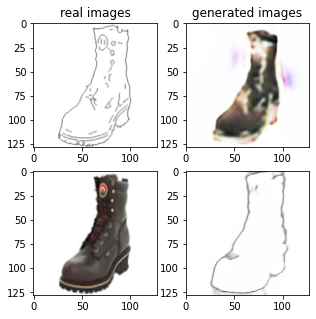

Train Epoch: 1 4% 	Total Loss: 1.686200 	Loss_G_AB: 0.380207	Loss_G_BA: 0.735723	Loss_cycle: 0.714237	Loss_D_A: 0.101018	Loss_D_B: 0.312979
0 2009 T:  1.4625983238220215
Train Epoch: 1 4% 	Total Loss: 1.974246 	Loss_G_AB: 0.418589	Loss_G_BA: 0.761880	Loss_cycle: 0.965540	Loss_D_A: 0.129633	Loss_D_B: 0.288838
0 2019 T:  0.7070338726043701
Train Epoch: 1 4% 	Total Loss: 1.749693 	Loss_G_AB: 0.368587	Loss_G_BA: 0.744148	Loss_cycle: 0.865258	Loss_D_A: 0.086626	Loss_D_B: 0.241440
0 2029 T:  0.668475866317749
Train Epoch: 1 4% 	Total Loss: 1.874850 	Loss_G_AB: 0.462476	Loss_G_BA: 0.776271	Loss_cycle: 0.805536	Loss_D_A: 0.172830	Loss_D_B: 0.277111
0 2039 T:  0.665642499923706
Train Epoch: 1 4% 	Total Loss: 1.520060 	Loss_G_AB: 0.315070	Loss_G_BA: 0.644152	Loss_cycle: 0.595282	Loss_D_A: 0.140071	Loss_D_B: 0.305096
0 2049 T:  0.6628549098968506
Train Epoch: 1 4% 	Total Loss: 1.654053 	Loss_G_AB: 0.382637	Loss_G_BA: 0.702381	Loss_cycle: 0.771320	Loss_D_A: 0.097793	Loss_D_B: 0.242432
0 2059 T:  0

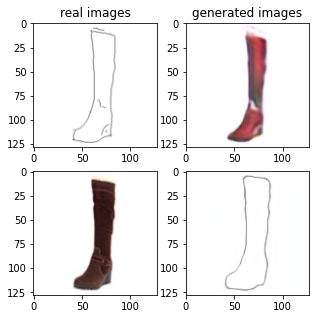

Train Epoch: 1 6% 	Total Loss: 1.444170 	Loss_G_AB: 0.313766	Loss_G_BA: 0.592358	Loss_cycle: 0.582606	Loss_D_A: 0.160398	Loss_D_B: 0.248104
0 3009 T:  1.7297844886779785
Train Epoch: 1 6% 	Total Loss: 2.057736 	Loss_G_AB: 0.349094	Loss_G_BA: 0.894841	Loss_cycle: 1.069571	Loss_D_A: 0.087937	Loss_D_B: 0.278260
0 3019 T:  0.6603603363037109
Train Epoch: 1 6% 	Total Loss: 2.333210 	Loss_G_AB: 0.319871	Loss_G_BA: 0.885614	Loss_cycle: 1.421191	Loss_D_A: 0.074798	Loss_D_B: 0.234479
0 3029 T:  0.6765539646148682
Train Epoch: 1 6% 	Total Loss: 1.766785 	Loss_G_AB: 0.317008	Loss_G_BA: 0.929701	Loss_cycle: 0.845998	Loss_D_A: 0.038796	Loss_D_B: 0.258636
0 3039 T:  0.6732168197631836
Train Epoch: 1 6% 	Total Loss: 1.705628 	Loss_G_AB: 0.365320	Loss_G_BA: 0.945639	Loss_cycle: 0.794596	Loss_D_A: 0.028477	Loss_D_B: 0.227076
0 3049 T:  0.6694846153259277
Train Epoch: 1 6% 	Total Loss: 1.664025 	Loss_G_AB: 0.283195	Loss_G_BA: 0.842446	Loss_cycle: 0.752386	Loss_D_A: 0.070475	Loss_D_B: 0.278344
0 3059 T: 

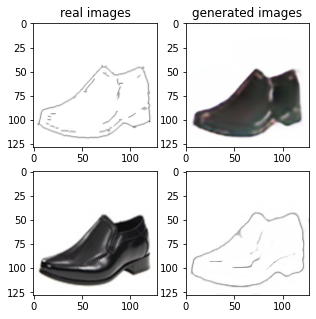

Train Epoch: 1 8% 	Total Loss: 1.621462 	Loss_G_AB: 0.373088	Loss_G_BA: 0.923054	Loss_cycle: 0.620858	Loss_D_A: 0.070357	Loss_D_B: 0.282176
0 4009 T:  1.376939058303833
Train Epoch: 1 8% 	Total Loss: 1.486258 	Loss_G_AB: 0.339301	Loss_G_BA: 0.869719	Loss_cycle: 0.569696	Loss_D_A: 0.047509	Loss_D_B: 0.264544
0 4019 T:  0.6611652374267578
Train Epoch: 1 8% 	Total Loss: 1.738558 	Loss_G_AB: 0.344117	Loss_G_BA: 0.955363	Loss_cycle: 0.797326	Loss_D_A: 0.034375	Loss_D_B: 0.257116
0 4029 T:  0.6856391429901123
Train Epoch: 1 8% 	Total Loss: 1.675591 	Loss_G_AB: 0.351021	Loss_G_BA: 0.901858	Loss_cycle: 0.729101	Loss_D_A: 0.055803	Loss_D_B: 0.264248
0 4039 T:  0.6820065975189209
Train Epoch: 1 8% 	Total Loss: 2.092700 	Loss_G_AB: 0.609034	Loss_G_BA: 0.978268	Loss_cycle: 0.801567	Loss_D_A: 0.030123	Loss_D_B: 0.467358
0 4049 T:  0.6771652698516846
Train Epoch: 1 8% 	Total Loss: 1.707967 	Loss_G_AB: 0.329163	Loss_G_BA: 0.939653	Loss_cycle: 0.769426	Loss_D_A: 0.023834	Loss_D_B: 0.280298
0 4059 T:  

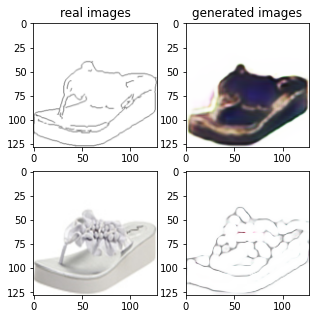

Train Epoch: 1 10% 	Total Loss: 1.729923 	Loss_G_AB: 0.418668	Loss_G_BA: 0.950995	Loss_cycle: 0.718062	Loss_D_A: 0.022021	Loss_D_B: 0.305008
0 5009 T:  1.4367213249206543
Train Epoch: 1 10% 	Total Loss: 1.633248 	Loss_G_AB: 0.396511	Loss_G_BA: 1.043587	Loss_cycle: 0.659397	Loss_D_A: 0.032452	Loss_D_B: 0.221351
0 5019 T:  0.6821446418762207
Train Epoch: 1 10% 	Total Loss: 1.934345 	Loss_G_AB: 0.417555	Loss_G_BA: 0.918773	Loss_cycle: 0.945296	Loss_D_A: 0.028306	Loss_D_B: 0.292579
0 5029 T:  0.6950066089630127
Train Epoch: 1 10% 	Total Loss: 1.525965 	Loss_G_AB: 0.314859	Loss_G_BA: 0.758841	Loss_cycle: 0.643281	Loss_D_A: 0.086160	Loss_D_B: 0.259674
0 5039 T:  0.6646559238433838
Train Epoch: 1 10% 	Total Loss: 1.713026 	Loss_G_AB: 0.290620	Loss_G_BA: 0.886141	Loss_cycle: 0.765925	Loss_D_A: 0.068876	Loss_D_B: 0.289846
0 5049 T:  0.6621439456939697
Train Epoch: 1 10% 	Total Loss: 1.488475 	Loss_G_AB: 0.310530	Loss_G_BA: 0.949775	Loss_cycle: 0.573180	Loss_D_A: 0.031510	Loss_D_B: 0.253633
0 50

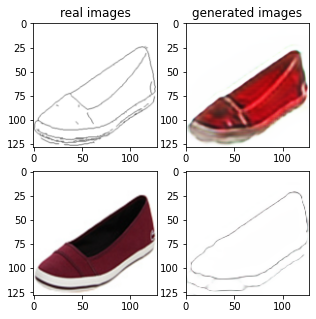

Train Epoch: 1 12% 	Total Loss: 1.463378 	Loss_G_AB: 0.298111	Loss_G_BA: 0.785597	Loss_cycle: 0.615097	Loss_D_A: 0.080620	Loss_D_B: 0.225807
0 6009 T:  1.4758360385894775
Train Epoch: 1 12% 	Total Loss: 1.665939 	Loss_G_AB: 0.342463	Loss_G_BA: 0.852611	Loss_cycle: 0.772660	Loss_D_A: 0.059252	Loss_D_B: 0.236490
0 6019 T:  0.6891281604766846
Train Epoch: 1 12% 	Total Loss: 1.575515 	Loss_G_AB: 0.298221	Loss_G_BA: 1.031914	Loss_cycle: 0.623225	Loss_D_A: 0.043129	Loss_D_B: 0.244093
0 6029 T:  0.691612720489502
Train Epoch: 1 12% 	Total Loss: 1.650852 	Loss_G_AB: 0.361997	Loss_G_BA: 0.911398	Loss_cycle: 0.700405	Loss_D_A: 0.051843	Loss_D_B: 0.261906
0 6039 T:  0.7177848815917969
Train Epoch: 1 12% 	Total Loss: 1.644212 	Loss_G_AB: 0.318175	Loss_G_BA: 0.850199	Loss_cycle: 0.763982	Loss_D_A: 0.046995	Loss_D_B: 0.249048
0 6049 T:  0.7938473224639893
Train Epoch: 1 12% 	Total Loss: 1.611940 	Loss_G_AB: 0.326701	Loss_G_BA: 0.986020	Loss_cycle: 0.687464	Loss_D_A: 0.034899	Loss_D_B: 0.233217
0 605

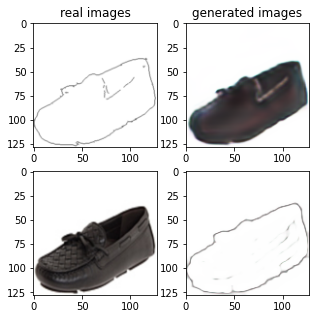

Train Epoch: 1 14% 	Total Loss: 1.535479 	Loss_G_AB: 0.265002	Loss_G_BA: 0.602256	Loss_cycle: 0.724272	Loss_D_A: 0.102264	Loss_D_B: 0.275314
0 7009 T:  1.4358315467834473
Train Epoch: 1 14% 	Total Loss: 1.385355 	Loss_G_AB: 0.308213	Loss_G_BA: 0.627398	Loss_cycle: 0.545603	Loss_D_A: 0.123883	Loss_D_B: 0.248064
0 7019 T:  0.683276891708374
Train Epoch: 1 14% 	Total Loss: 1.693437 	Loss_G_AB: 0.294609	Loss_G_BA: 1.016856	Loss_cycle: 0.753674	Loss_D_A: 0.034396	Loss_D_B: 0.249634
0 7029 T:  0.6923162937164307
Train Epoch: 1 14% 	Total Loss: 1.459328 	Loss_G_AB: 0.310912	Loss_G_BA: 0.890281	Loss_cycle: 0.496666	Loss_D_A: 0.063546	Loss_D_B: 0.298520
0 7039 T:  0.6905546188354492
Train Epoch: 1 14% 	Total Loss: 1.707507 	Loss_G_AB: 0.337002	Loss_G_BA: 0.798122	Loss_cycle: 0.759093	Loss_D_A: 0.123341	Loss_D_B: 0.257511
0 7049 T:  0.6891143321990967
Train Epoch: 1 14% 	Total Loss: 1.487379 	Loss_G_AB: 0.250011	Loss_G_BA: 0.653451	Loss_cycle: 0.608748	Loss_D_A: 0.139058	Loss_D_B: 0.287841
0 705

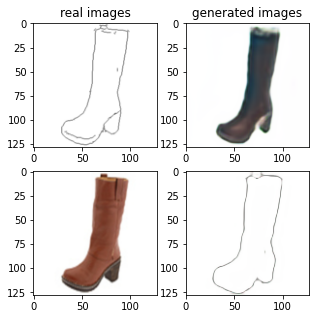

Train Epoch: 1 16% 	Total Loss: 1.633725 	Loss_G_AB: 0.312137	Loss_G_BA: 0.946396	Loss_cycle: 0.733072	Loss_D_A: 0.032038	Loss_D_B: 0.239349
0 8009 T:  1.5214617252349854
Train Epoch: 1 16% 	Total Loss: 1.411230 	Loss_G_AB: 0.348719	Loss_G_BA: 0.660795	Loss_cycle: 0.519780	Loss_D_A: 0.129160	Loss_D_B: 0.257533
0 8019 T:  0.6846132278442383
Train Epoch: 1 16% 	Total Loss: 1.721476 	Loss_G_AB: 0.340077	Loss_G_BA: 0.867442	Loss_cycle: 0.752847	Loss_D_A: 0.074548	Loss_D_B: 0.290321
0 8029 T:  0.6955921649932861
Train Epoch: 1 16% 	Total Loss: 1.383675 	Loss_G_AB: 0.316843	Loss_G_BA: 0.760530	Loss_cycle: 0.513116	Loss_D_A: 0.086889	Loss_D_B: 0.244983
0 8039 T:  0.6764392852783203
Train Epoch: 1 16% 	Total Loss: 1.665891 	Loss_G_AB: 0.299740	Loss_G_BA: 0.945804	Loss_cycle: 0.730118	Loss_D_A: 0.059645	Loss_D_B: 0.253355
0 8049 T:  0.6848821640014648
Train Epoch: 1 16% 	Total Loss: 1.389387 	Loss_G_AB: 0.393877	Loss_G_BA: 0.819957	Loss_cycle: 0.411299	Loss_D_A: 0.074340	Loss_D_B: 0.296831
0 80

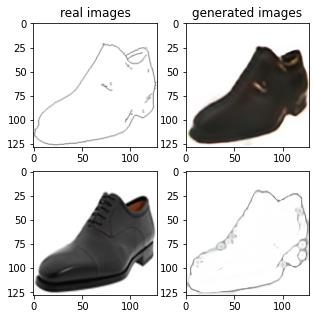

Train Epoch: 1 18% 	Total Loss: 1.535192 	Loss_G_AB: 0.407081	Loss_G_BA: 0.915787	Loss_cycle: 0.567503	Loss_D_A: 0.049431	Loss_D_B: 0.256824
0 9009 T:  1.385084629058838
Train Epoch: 1 18% 	Total Loss: 1.678246 	Loss_G_AB: 0.333875	Loss_G_BA: 0.910434	Loss_cycle: 0.776914	Loss_D_A: 0.031491	Loss_D_B: 0.247686
0 9019 T:  0.699634313583374
Train Epoch: 1 18% 	Total Loss: 1.872411 	Loss_G_AB: 0.334417	Loss_G_BA: 0.995263	Loss_cycle: 0.887856	Loss_D_A: 0.037044	Loss_D_B: 0.282671
0 9029 T:  0.7109770774841309
Train Epoch: 1 18% 	Total Loss: 1.466992 	Loss_G_AB: 0.318488	Loss_G_BA: 0.974506	Loss_cycle: 0.570086	Loss_D_A: 0.021359	Loss_D_B: 0.229050
0 9039 T:  0.6762547492980957
Train Epoch: 1 18% 	Total Loss: 1.496663 	Loss_G_AB: 0.289393	Loss_G_BA: 0.932912	Loss_cycle: 0.615218	Loss_D_A: 0.028006	Loss_D_B: 0.242286
0 9049 T:  0.6786422729492188
Train Epoch: 1 18% 	Total Loss: 1.712773 	Loss_G_AB: 0.283247	Loss_G_BA: 0.968392	Loss_cycle: 0.815240	Loss_D_A: 0.011978	Loss_D_B: 0.259736
0 9059

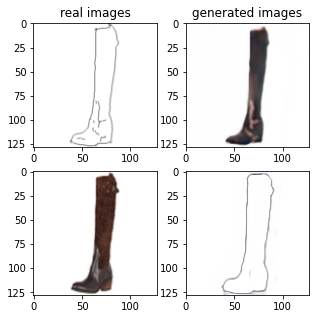

Train Epoch: 1 20% 	Total Loss: 1.550208 	Loss_G_AB: 0.332280	Loss_G_BA: 1.028615	Loss_cycle: 0.572651	Loss_D_A: 0.018764	Loss_D_B: 0.278345
0 10009 T:  1.4734015464782715
Train Epoch: 1 20% 	Total Loss: 1.420629 	Loss_G_AB: 0.280509	Loss_G_BA: 0.930848	Loss_cycle: 0.543550	Loss_D_A: 0.017460	Loss_D_B: 0.253939
0 10019 T:  0.7267866134643555
Train Epoch: 1 20% 	Total Loss: 1.563114 	Loss_G_AB: 0.318504	Loss_G_BA: 0.980360	Loss_cycle: 0.647350	Loss_D_A: 0.024298	Loss_D_B: 0.242034
0 10029 T:  0.6953434944152832
Train Epoch: 1 20% 	Total Loss: 1.526417 	Loss_G_AB: 0.329123	Loss_G_BA: 0.943032	Loss_cycle: 0.563276	Loss_D_A: 0.049649	Loss_D_B: 0.277414
0 10039 T:  0.6783642768859863
Train Epoch: 1 20% 	Total Loss: 1.387768 	Loss_G_AB: 0.309400	Loss_G_BA: 0.857464	Loss_cycle: 0.505622	Loss_D_A: 0.024874	Loss_D_B: 0.273839
0 10049 T:  0.6933777332305908
Train Epoch: 1 20% 	Total Loss: 1.499783 	Loss_G_AB: 0.309251	Loss_G_BA: 0.959142	Loss_cycle: 0.550548	Loss_D_A: 0.062346	Loss_D_B: 0.252693

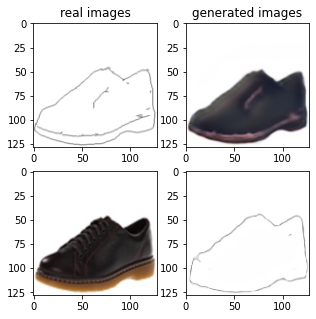

Train Epoch: 1 22% 	Total Loss: 1.452913 	Loss_G_AB: 0.347881	Loss_G_BA: 0.633235	Loss_cycle: 0.578195	Loss_D_A: 0.105760	Loss_D_B: 0.278400
0 11009 T:  1.4186592102050781
Train Epoch: 1 22% 	Total Loss: 1.534151 	Loss_G_AB: 0.349198	Loss_G_BA: 0.963690	Loss_cycle: 0.596739	Loss_D_A: 0.019256	Loss_D_B: 0.261712
0 11019 T:  0.6854069232940674
Train Epoch: 1 22% 	Total Loss: 1.396525 	Loss_G_AB: 0.324554	Loss_G_BA: 0.763503	Loss_cycle: 0.537541	Loss_D_A: 0.079910	Loss_D_B: 0.235046
0 11029 T:  0.6917624473571777
Train Epoch: 1 22% 	Total Loss: 1.729847 	Loss_G_AB: 0.342503	Loss_G_BA: 0.580315	Loss_cycle: 0.797793	Loss_D_A: 0.164366	Loss_D_B: 0.306279
0 11039 T:  0.685467004776001
Train Epoch: 1 22% 	Total Loss: 1.469396 	Loss_G_AB: 0.260653	Loss_G_BA: 0.691842	Loss_cycle: 0.630605	Loss_D_A: 0.092267	Loss_D_B: 0.270276
0 11049 T:  0.6975376605987549
Train Epoch: 1 22% 	Total Loss: 1.348006 	Loss_G_AB: 0.294057	Loss_G_BA: 0.726217	Loss_cycle: 0.512888	Loss_D_A: 0.077450	Loss_D_B: 0.247531


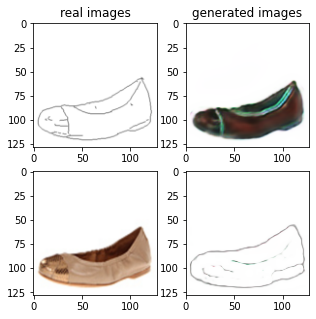

Train Epoch: 1 24% 	Total Loss: 1.549262 	Loss_G_AB: 0.368462	Loss_G_BA: 0.919406	Loss_cycle: 0.604918	Loss_D_A: 0.045245	Loss_D_B: 0.255165
0 12009 T:  1.4072401523590088
Train Epoch: 1 24% 	Total Loss: 1.406363 	Loss_G_AB: 0.295255	Loss_G_BA: 0.966270	Loss_cycle: 0.514188	Loss_D_A: 0.020771	Loss_D_B: 0.240641
0 12019 T:  0.6796588897705078
Train Epoch: 1 24% 	Total Loss: 1.499862 	Loss_G_AB: 0.278203	Loss_G_BA: 0.990180	Loss_cycle: 0.587839	Loss_D_A: 0.013683	Loss_D_B: 0.264149
0 12029 T:  0.684572696685791
Train Epoch: 1 24% 	Total Loss: 1.369681 	Loss_G_AB: 0.309947	Loss_G_BA: 0.948009	Loss_cycle: 0.477862	Loss_D_A: 0.045269	Loss_D_B: 0.217571
0 12039 T:  0.6819560527801514
Train Epoch: 1 24% 	Total Loss: 1.465271 	Loss_G_AB: 0.311251	Loss_G_BA: 0.914629	Loss_cycle: 0.550042	Loss_D_A: 0.035916	Loss_D_B: 0.266374
0 12049 T:  0.6968638896942139
Train Epoch: 1 24% 	Total Loss: 1.350813 	Loss_G_AB: 0.242973	Loss_G_BA: 0.851561	Loss_cycle: 0.505262	Loss_D_A: 0.031667	Loss_D_B: 0.266617


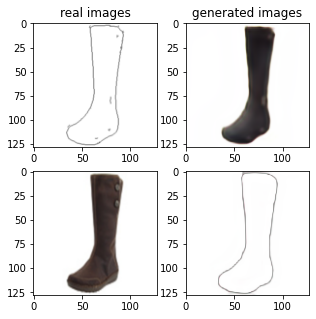

Train Epoch: 1 26% 	Total Loss: 1.357483 	Loss_G_AB: 0.298047	Loss_G_BA: 0.700925	Loss_cycle: 0.496567	Loss_D_A: 0.105194	Loss_D_B: 0.256236
0 13009 T:  2.218291759490967
Train Epoch: 1 26% 	Total Loss: 1.631861 	Loss_G_AB: 0.347983	Loss_G_BA: 0.934745	Loss_cycle: 0.671584	Loss_D_A: 0.050252	Loss_D_B: 0.268661
0 13019 T:  0.6889846324920654
Train Epoch: 1 26% 	Total Loss: 1.462253 	Loss_G_AB: 0.295930	Loss_G_BA: 0.921412	Loss_cycle: 0.555381	Loss_D_A: 0.046726	Loss_D_B: 0.251476
0 13029 T:  0.6968038082122803
Train Epoch: 1 26% 	Total Loss: 1.497532 	Loss_G_AB: 0.356083	Loss_G_BA: 0.933937	Loss_cycle: 0.586154	Loss_D_A: 0.029018	Loss_D_B: 0.237350
0 13039 T:  0.6857931613922119
Train Epoch: 1 26% 	Total Loss: 1.341264 	Loss_G_AB: 0.298533	Loss_G_BA: 0.835792	Loss_cycle: 0.452678	Loss_D_A: 0.056721	Loss_D_B: 0.264703
0 13049 T:  0.6827654838562012
Train Epoch: 1 26% 	Total Loss: 1.682908 	Loss_G_AB: 0.331400	Loss_G_BA: 0.877318	Loss_cycle: 0.703576	Loss_D_A: 0.104858	Loss_D_B: 0.270115


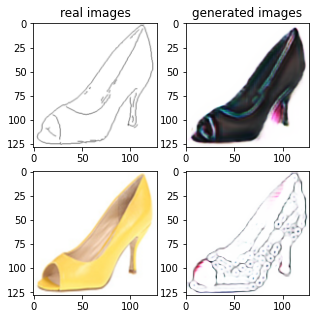

Train Epoch: 1 28% 	Total Loss: 1.634941 	Loss_G_AB: 0.358143	Loss_G_BA: 1.005990	Loss_cycle: 0.714664	Loss_D_A: 0.019188	Loss_D_B: 0.219023
0 14009 T:  1.4974331855773926
Train Epoch: 1 28% 	Total Loss: 1.584297 	Loss_G_AB: 0.288914	Loss_G_BA: 0.972370	Loss_cycle: 0.665222	Loss_D_A: 0.026487	Loss_D_B: 0.261946
0 14019 T:  0.7088332176208496
Train Epoch: 1 28% 	Total Loss: 1.455873 	Loss_G_AB: 0.336693	Loss_G_BA: 0.928796	Loss_cycle: 0.545123	Loss_D_A: 0.020366	Loss_D_B: 0.257640
0 14029 T:  0.7055866718292236
Train Epoch: 1 28% 	Total Loss: 1.477610 	Loss_G_AB: 0.269457	Loss_G_BA: 1.008144	Loss_cycle: 0.529497	Loss_D_A: 0.039126	Loss_D_B: 0.270187
0 14039 T:  0.6787436008453369
Train Epoch: 1 28% 	Total Loss: 1.404928 	Loss_G_AB: 0.327599	Loss_G_BA: 0.726502	Loss_cycle: 0.576852	Loss_D_A: 0.064071	Loss_D_B: 0.236955
0 14049 T:  0.6837203502655029
Train Epoch: 1 28% 	Total Loss: 1.539605 	Loss_G_AB: 0.275456	Loss_G_BA: 0.939990	Loss_cycle: 0.599380	Loss_D_A: 0.060277	Loss_D_B: 0.272226

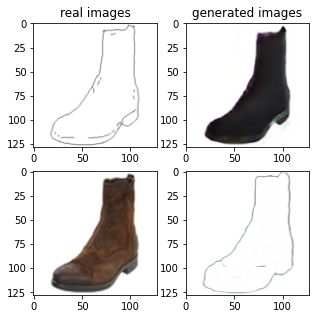

Train Epoch: 1 30% 	Total Loss: 1.428550 	Loss_G_AB: 0.300001	Loss_G_BA: 0.873790	Loss_cycle: 0.528304	Loss_D_A: 0.046365	Loss_D_B: 0.266986
0 15009 T:  1.3942387104034424
Train Epoch: 1 30% 	Total Loss: 1.425810 	Loss_G_AB: 0.292591	Loss_G_BA: 0.904067	Loss_cycle: 0.532257	Loss_D_A: 0.045325	Loss_D_B: 0.249899
0 15019 T:  0.7110209465026855
Train Epoch: 1 30% 	Total Loss: 1.457140 	Loss_G_AB: 0.322464	Loss_G_BA: 0.953474	Loss_cycle: 0.565753	Loss_D_A: 0.017830	Loss_D_B: 0.235587
0 15029 T:  0.7051875591278076
Train Epoch: 1 30% 	Total Loss: 1.563392 	Loss_G_AB: 0.320435	Loss_G_BA: 0.975039	Loss_cycle: 0.655372	Loss_D_A: 0.016640	Loss_D_B: 0.243643
0 15039 T:  0.6957330703735352
Train Epoch: 1 30% 	Total Loss: 1.542312 	Loss_G_AB: 0.289949	Loss_G_BA: 0.791379	Loss_cycle: 0.631053	Loss_D_A: 0.092019	Loss_D_B: 0.278576
0 15049 T:  0.6906251907348633
Train Epoch: 1 30% 	Total Loss: 1.463059 	Loss_G_AB: 0.413948	Loss_G_BA: 0.900996	Loss_cycle: 0.476844	Loss_D_A: 0.099011	Loss_D_B: 0.229732

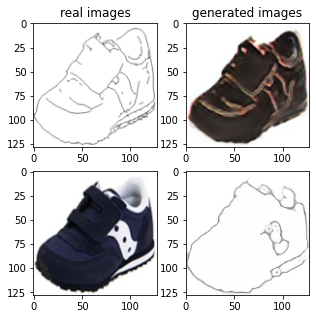

Train Epoch: 1 32% 	Total Loss: 1.493841 	Loss_G_AB: 0.318652	Loss_G_BA: 0.931068	Loss_cycle: 0.583913	Loss_D_A: 0.019044	Loss_D_B: 0.266024
0 16009 T:  1.4072368144989014
Train Epoch: 1 32% 	Total Loss: 1.574681 	Loss_G_AB: 0.271601	Loss_G_BA: 1.060479	Loss_cycle: 0.617930	Loss_D_A: 0.022836	Loss_D_B: 0.267874
0 16019 T:  0.68605637550354
Train Epoch: 1 32% 	Total Loss: 1.503876 	Loss_G_AB: 0.296861	Loss_G_BA: 0.914549	Loss_cycle: 0.632743	Loss_D_A: 0.021824	Loss_D_B: 0.243604
0 16029 T:  0.6804239749908447
Train Epoch: 1 32% 	Total Loss: 1.465436 	Loss_G_AB: 0.334598	Loss_G_BA: 0.949231	Loss_cycle: 0.560710	Loss_D_A: 0.023589	Loss_D_B: 0.239222
0 16039 T:  0.6773767471313477
Train Epoch: 1 32% 	Total Loss: 1.449550 	Loss_G_AB: 0.276728	Loss_G_BA: 1.026303	Loss_cycle: 0.538950	Loss_D_A: 0.008249	Loss_D_B: 0.250836
0 16049 T:  0.7171618938446045
Train Epoch: 1 32% 	Total Loss: 1.489892 	Loss_G_AB: 0.272300	Loss_G_BA: 1.009195	Loss_cycle: 0.567409	Loss_D_A: 0.012306	Loss_D_B: 0.269430
0

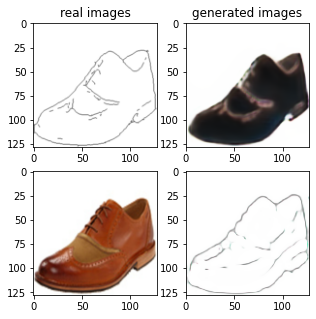

Train Epoch: 1 34% 	Total Loss: 1.682701 	Loss_G_AB: 0.329851	Loss_G_BA: 0.943052	Loss_cycle: 0.743477	Loss_D_A: 0.049907	Loss_D_B: 0.252865
0 17009 T:  1.3771398067474365
Train Epoch: 1 34% 	Total Loss: 1.642314 	Loss_G_AB: 0.320911	Loss_G_BA: 0.839202	Loss_cycle: 0.765581	Loss_D_A: 0.050298	Loss_D_B: 0.246380
0 17019 T:  0.6829397678375244
Train Epoch: 1 34% 	Total Loss: 1.529787 	Loss_G_AB: 0.318063	Loss_G_BA: 0.919482	Loss_cycle: 0.622471	Loss_D_A: 0.040889	Loss_D_B: 0.247654
0 17029 T:  0.6929957866668701
Train Epoch: 1 34% 	Total Loss: 1.592276 	Loss_G_AB: 0.308449	Loss_G_BA: 0.921513	Loss_cycle: 0.688066	Loss_D_A: 0.026468	Loss_D_B: 0.262760
0 17039 T:  0.6755776405334473
Train Epoch: 1 34% 	Total Loss: 1.657459 	Loss_G_AB: 0.291536	Loss_G_BA: 0.882703	Loss_cycle: 0.748930	Loss_D_A: 0.051629	Loss_D_B: 0.269781
0 17049 T:  0.6792745590209961
Train Epoch: 1 34% 	Total Loss: 1.716202 	Loss_G_AB: 0.302132	Loss_G_BA: 0.977671	Loss_cycle: 0.821171	Loss_D_A: 0.017852	Loss_D_B: 0.237278

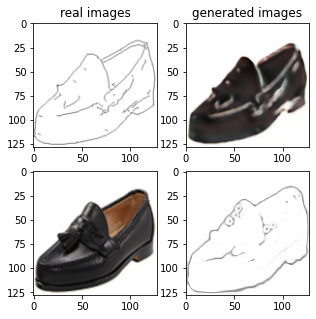

Train Epoch: 1 36% 	Total Loss: 1.500359 	Loss_G_AB: 0.319604	Loss_G_BA: 0.955341	Loss_cycle: 0.582528	Loss_D_A: 0.013118	Loss_D_B: 0.267241
0 18009 T:  1.4193272590637207
Train Epoch: 1 36% 	Total Loss: 1.496328 	Loss_G_AB: 0.345774	Loss_G_BA: 1.031841	Loss_cycle: 0.562090	Loss_D_A: 0.008806	Loss_D_B: 0.236623
0 18019 T:  0.6732285022735596
Train Epoch: 1 36% 	Total Loss: 1.458973 	Loss_G_AB: 0.316379	Loss_G_BA: 0.987724	Loss_cycle: 0.566008	Loss_D_A: 0.005849	Loss_D_B: 0.235065
0 18029 T:  0.6785180568695068
Train Epoch: 1 36% 	Total Loss: 1.531258 	Loss_G_AB: 0.382879	Loss_G_BA: 0.993291	Loss_cycle: 0.609142	Loss_D_A: 0.006509	Loss_D_B: 0.227522
0 18039 T:  0.6772007942199707
Train Epoch: 1 36% 	Total Loss: 1.539911 	Loss_G_AB: 0.322581	Loss_G_BA: 0.947584	Loss_cycle: 0.657642	Loss_D_A: 0.005588	Loss_D_B: 0.241599
0 18049 T:  0.6878385543823242
Train Epoch: 1 36% 	Total Loss: 1.473504 	Loss_G_AB: 0.358121	Loss_G_BA: 1.041718	Loss_cycle: 0.539697	Loss_D_A: 0.006341	Loss_D_B: 0.227546

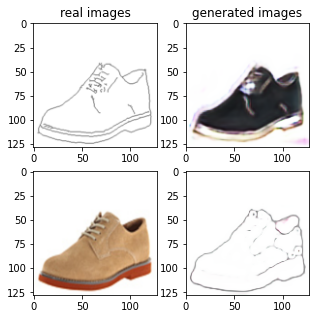

Train Epoch: 1 38% 	Total Loss: 1.412568 	Loss_G_AB: 0.311679	Loss_G_BA: 0.896057	Loss_cycle: 0.564616	Loss_D_A: 0.019156	Loss_D_B: 0.224927
0 19009 T:  1.40549635887146
Train Epoch: 1 38% 	Total Loss: 1.681371 	Loss_G_AB: 0.256449	Loss_G_BA: 1.034818	Loss_cycle: 0.731028	Loss_D_A: 0.017317	Loss_D_B: 0.287393
0 19019 T:  0.7737889289855957
Train Epoch: 1 38% 	Total Loss: 1.319467 	Loss_G_AB: 0.290873	Loss_G_BA: 0.966346	Loss_cycle: 0.399264	Loss_D_A: 0.014230	Loss_D_B: 0.277363
0 19029 T:  0.6768107414245605
Train Epoch: 1 38% 	Total Loss: 1.429892 	Loss_G_AB: 0.292751	Loss_G_BA: 0.969571	Loss_cycle: 0.535390	Loss_D_A: 0.012926	Loss_D_B: 0.250414
0 19039 T:  0.6963369846343994
Train Epoch: 1 38% 	Total Loss: 1.473976 	Loss_G_AB: 0.306036	Loss_G_BA: 0.983796	Loss_cycle: 0.573525	Loss_D_A: 0.013018	Loss_D_B: 0.242517
0 19049 T:  0.6797857284545898
Train Epoch: 1 38% 	Total Loss: 1.407833 	Loss_G_AB: 0.269590	Loss_G_BA: 0.991738	Loss_cycle: 0.501787	Loss_D_A: 0.013987	Loss_D_B: 0.261395
0

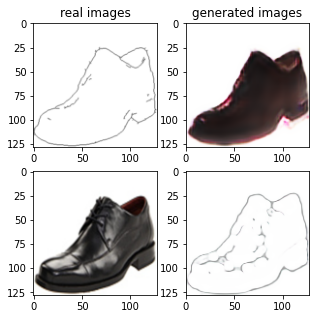

Train Epoch: 1 40% 	Total Loss: 1.557799 	Loss_G_AB: 0.315587	Loss_G_BA: 0.986566	Loss_cycle: 0.633478	Loss_D_A: 0.005094	Loss_D_B: 0.268150
0 20009 T:  1.529179334640503
Train Epoch: 1 40% 	Total Loss: 1.550005 	Loss_G_AB: 0.300099	Loss_G_BA: 1.009188	Loss_cycle: 0.635373	Loss_D_A: 0.004553	Loss_D_B: 0.255435
0 20019 T:  0.6701641082763672
Train Epoch: 1 40% 	Total Loss: 1.379244 	Loss_G_AB: 0.313861	Loss_G_BA: 1.020479	Loss_cycle: 0.455527	Loss_D_A: 0.004733	Loss_D_B: 0.251814
0 20029 T:  0.6575706005096436
Train Epoch: 1 40% 	Total Loss: 1.372765 	Loss_G_AB: 0.296175	Loss_G_BA: 0.978385	Loss_cycle: 0.496571	Loss_D_A: 0.004209	Loss_D_B: 0.234704
0 20039 T:  0.6794145107269287
Train Epoch: 1 40% 	Total Loss: 1.374974 	Loss_G_AB: 0.291682	Loss_G_BA: 0.994144	Loss_cycle: 0.453021	Loss_D_A: 0.005066	Loss_D_B: 0.273973
0 20049 T:  0.6743910312652588
Train Epoch: 1 40% 	Total Loss: 1.437830 	Loss_G_AB: 0.293552	Loss_G_BA: 0.998912	Loss_cycle: 0.530882	Loss_D_A: 0.011916	Loss_D_B: 0.248800


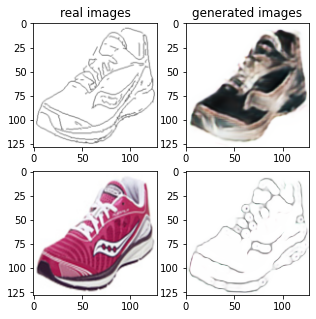

Train Epoch: 1 42% 	Total Loss: 1.555494 	Loss_G_AB: 0.307897	Loss_G_BA: 0.927895	Loss_cycle: 0.667170	Loss_D_A: 0.022839	Loss_D_B: 0.247590
0 21009 T:  1.404951810836792
Train Epoch: 1 42% 	Total Loss: 1.434118 	Loss_G_AB: 0.316835	Loss_G_BA: 1.010161	Loss_cycle: 0.510795	Loss_D_A: 0.015454	Loss_D_B: 0.244371
0 21019 T:  0.663020133972168
Train Epoch: 1 42% 	Total Loss: 1.435408 	Loss_G_AB: 0.330177	Loss_G_BA: 0.997719	Loss_cycle: 0.485626	Loss_D_A: 0.017427	Loss_D_B: 0.268406
0 21029 T:  0.6626734733581543
Train Epoch: 1 42% 	Total Loss: 1.513599 	Loss_G_AB: 0.268766	Loss_G_BA: 0.961496	Loss_cycle: 0.619575	Loss_D_A: 0.011176	Loss_D_B: 0.267716
0 21039 T:  0.6662397384643555
Train Epoch: 1 42% 	Total Loss: 1.537104 	Loss_G_AB: 0.297718	Loss_G_BA: 1.016978	Loss_cycle: 0.581693	Loss_D_A: 0.027103	Loss_D_B: 0.270960
0 21049 T:  0.6531169414520264
Train Epoch: 1 42% 	Total Loss: 1.465058 	Loss_G_AB: 0.261298	Loss_G_BA: 0.827067	Loss_cycle: 0.570498	Loss_D_A: 0.068327	Loss_D_B: 0.282050
0

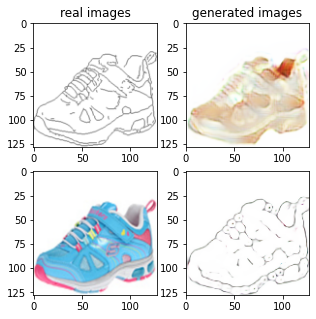

Train Epoch: 1 44% 	Total Loss: 1.485957 	Loss_G_AB: 0.285605	Loss_G_BA: 0.765562	Loss_cycle: 0.665919	Loss_D_A: 0.050808	Loss_D_B: 0.243648
0 22009 T:  1.4005539417266846
Train Epoch: 1 44% 	Total Loss: 1.472260 	Loss_G_AB: 0.276726	Loss_G_BA: 0.786706	Loss_cycle: 0.580467	Loss_D_A: 0.093611	Loss_D_B: 0.266466
0 22019 T:  0.6676361560821533
Train Epoch: 1 44% 	Total Loss: 1.405291 	Loss_G_AB: 0.294451	Loss_G_BA: 0.618994	Loss_cycle: 0.491438	Loss_D_A: 0.182677	Loss_D_B: 0.274454
0 22029 T:  0.6727395057678223
Train Epoch: 1 44% 	Total Loss: 1.441910 	Loss_G_AB: 0.304015	Loss_G_BA: 0.778863	Loss_cycle: 0.563571	Loss_D_A: 0.093260	Loss_D_B: 0.243640
0 22039 T:  0.6574463844299316
Train Epoch: 1 44% 	Total Loss: 1.499233 	Loss_G_AB: 0.306364	Loss_G_BA: 0.897782	Loss_cycle: 0.602314	Loss_D_A: 0.048215	Loss_D_B: 0.246631
0 22049 T:  0.6826040744781494
Train Epoch: 1 44% 	Total Loss: 1.579891 	Loss_G_AB: 0.305710	Loss_G_BA: 0.984586	Loss_cycle: 0.696156	Loss_D_A: 0.009485	Loss_D_B: 0.229103

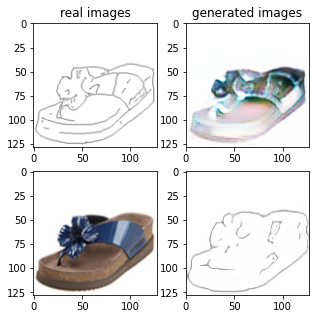

Train Epoch: 1 46% 	Total Loss: 1.425179 	Loss_G_AB: 0.304815	Loss_G_BA: 0.850420	Loss_cycle: 0.504773	Loss_D_A: 0.097653	Loss_D_B: 0.245136
0 23009 T:  1.3934338092803955
Train Epoch: 1 46% 	Total Loss: 1.407570 	Loss_G_AB: 0.313738	Loss_G_BA: 0.847330	Loss_cycle: 0.510195	Loss_D_A: 0.058764	Loss_D_B: 0.258076
0 23019 T:  0.6608381271362305
Train Epoch: 1 46% 	Total Loss: 1.404621 	Loss_G_AB: 0.271751	Loss_G_BA: 0.944796	Loss_cycle: 0.455208	Loss_D_A: 0.049676	Loss_D_B: 0.291463
0 23029 T:  0.6739792823791504
Train Epoch: 1 46% 	Total Loss: 1.339531 	Loss_G_AB: 0.336815	Loss_G_BA: 0.915305	Loss_cycle: 0.454107	Loss_D_A: 0.037407	Loss_D_B: 0.221957
0 23039 T:  0.669745922088623
Train Epoch: 1 46% 	Total Loss: 1.539915 	Loss_G_AB: 0.268798	Loss_G_BA: 0.947741	Loss_cycle: 0.647071	Loss_D_A: 0.016236	Loss_D_B: 0.268339
0 23049 T:  0.6755826473236084
Train Epoch: 1 46% 	Total Loss: 1.360659 	Loss_G_AB: 0.315897	Loss_G_BA: 0.833616	Loss_cycle: 0.437919	Loss_D_A: 0.114025	Loss_D_B: 0.233958


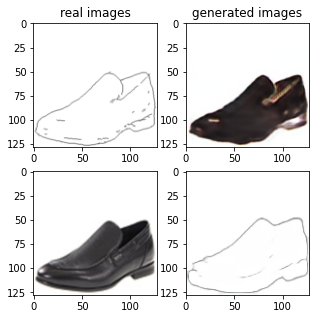

Train Epoch: 1 48% 	Total Loss: 1.353293 	Loss_G_AB: 0.292709	Loss_G_BA: 0.969536	Loss_cycle: 0.452070	Loss_D_A: 0.026478	Loss_D_B: 0.243623
0 24009 T:  1.3995082378387451
Train Epoch: 1 48% 	Total Loss: 1.408465 	Loss_G_AB: 0.264517	Loss_G_BA: 0.984435	Loss_cycle: 0.511543	Loss_D_A: 0.017662	Loss_D_B: 0.254784
0 24019 T:  0.6617846488952637
Train Epoch: 1 48% 	Total Loss: 1.440647 	Loss_G_AB: 0.274735	Loss_G_BA: 1.007339	Loss_cycle: 0.533020	Loss_D_A: 0.007202	Loss_D_B: 0.259388
0 24029 T:  0.6604354381561279
Train Epoch: 1 48% 	Total Loss: 1.434900 	Loss_G_AB: 0.293136	Loss_G_BA: 0.991986	Loss_cycle: 0.512658	Loss_D_A: 0.010712	Loss_D_B: 0.268969
0 24039 T:  0.6782131195068359
Train Epoch: 1 48% 	Total Loss: 1.422286 	Loss_G_AB: 0.277164	Loss_G_BA: 0.968797	Loss_cycle: 0.545314	Loss_D_A: 0.009469	Loss_D_B: 0.244523
0 24049 T:  0.6660568714141846
Train Epoch: 1 48% 	Total Loss: 1.621567 	Loss_G_AB: 0.297178	Loss_G_BA: 0.980092	Loss_cycle: 0.728098	Loss_D_A: 0.014748	Loss_D_B: 0.240086

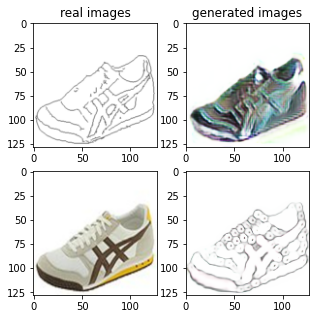

Train Epoch: 1 50% 	Total Loss: 1.387792 	Loss_G_AB: 0.272971	Loss_G_BA: 0.984461	Loss_cycle: 0.484574	Loss_D_A: 0.015455	Loss_D_B: 0.259047
0 25009 T:  1.3886997699737549
Train Epoch: 1 50% 	Total Loss: 1.491070 	Loss_G_AB: 0.296989	Loss_G_BA: 0.988018	Loss_cycle: 0.579940	Loss_D_A: 0.018405	Loss_D_B: 0.250222
0 25019 T:  0.6682629585266113
Train Epoch: 1 50% 	Total Loss: 1.388599 	Loss_G_AB: 0.289153	Loss_G_BA: 0.976416	Loss_cycle: 0.506898	Loss_D_A: 0.006090	Loss_D_B: 0.242827
0 25029 T:  0.666557788848877
Train Epoch: 1 50% 	Total Loss: 1.351448 	Loss_G_AB: 0.275013	Loss_G_BA: 0.955680	Loss_cycle: 0.464361	Loss_D_A: 0.021344	Loss_D_B: 0.250396
0 25039 T:  0.6716926097869873
Train Epoch: 1 50% 	Total Loss: 1.524414 	Loss_G_AB: 0.336229	Loss_G_BA: 0.942198	Loss_cycle: 0.627457	Loss_D_A: 0.034361	Loss_D_B: 0.223383
0 25049 T:  0.6568422317504883
Train Epoch: 1 50% 	Total Loss: 1.371003 	Loss_G_AB: 0.281040	Loss_G_BA: 0.910094	Loss_cycle: 0.461548	Loss_D_A: 0.038309	Loss_D_B: 0.275579


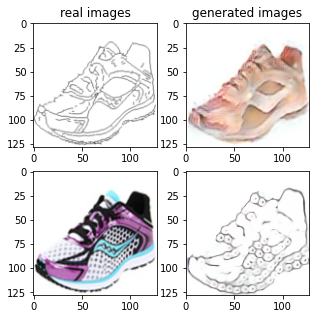

Train Epoch: 1 52% 	Total Loss: 1.402951 	Loss_G_AB: 0.316711	Loss_G_BA: 0.997942	Loss_cycle: 0.486606	Loss_D_A: 0.006808	Loss_D_B: 0.252211
0 26009 T:  1.4851114749908447
Train Epoch: 1 52% 	Total Loss: 1.370932 	Loss_G_AB: 0.276303	Loss_G_BA: 1.007973	Loss_cycle: 0.461195	Loss_D_A: 0.005074	Loss_D_B: 0.262525
0 26019 T:  0.6669063568115234
Train Epoch: 1 52% 	Total Loss: 1.160596 	Loss_G_AB: 0.288398	Loss_G_BA: 0.980015	Loss_cycle: 0.271876	Loss_D_A: 0.005041	Loss_D_B: 0.249473
0 26029 T:  0.666923999786377
Train Epoch: 1 52% 	Total Loss: 1.325657 	Loss_G_AB: 0.303927	Loss_G_BA: 1.004143	Loss_cycle: 0.440946	Loss_D_A: 0.008736	Loss_D_B: 0.221940
0 26039 T:  0.6836824417114258
Train Epoch: 1 52% 	Total Loss: 1.507555 	Loss_G_AB: 0.326277	Loss_G_BA: 1.001655	Loss_cycle: 0.538280	Loss_D_A: 0.005401	Loss_D_B: 0.299908
0 26049 T:  0.6638495922088623
Train Epoch: 1 52% 	Total Loss: 1.407365 	Loss_G_AB: 0.333000	Loss_G_BA: 0.981266	Loss_cycle: 0.512237	Loss_D_A: 0.008953	Loss_D_B: 0.229042


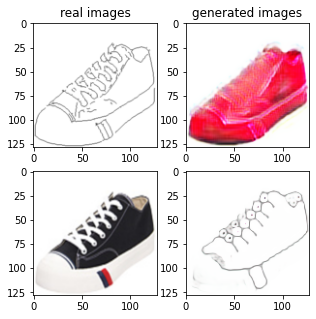

Train Epoch: 1 54% 	Total Loss: 1.460441 	Loss_G_AB: 0.337231	Loss_G_BA: 1.021304	Loss_cycle: 0.535390	Loss_D_A: 0.009308	Loss_D_B: 0.236475
0 27009 T:  1.3977580070495605
Train Epoch: 1 54% 	Total Loss: 1.494636 	Loss_G_AB: 0.289756	Loss_G_BA: 0.957513	Loss_cycle: 0.593376	Loss_D_A: 0.020080	Loss_D_B: 0.257545
0 27019 T:  0.7039902210235596
Train Epoch: 1 54% 	Total Loss: 1.335660 	Loss_G_AB: 0.292651	Loss_G_BA: 1.026407	Loss_cycle: 0.433985	Loss_D_A: 0.004383	Loss_D_B: 0.237762
0 27029 T:  0.6654379367828369
Train Epoch: 1 54% 	Total Loss: 1.275807 	Loss_G_AB: 0.302703	Loss_G_BA: 0.993237	Loss_cycle: 0.394450	Loss_D_A: 0.003608	Loss_D_B: 0.229779
0 27039 T:  0.6621732711791992
Train Epoch: 1 54% 	Total Loss: 1.335138 	Loss_G_AB: 0.333756	Loss_G_BA: 0.875661	Loss_cycle: 0.403544	Loss_D_A: 0.088987	Loss_D_B: 0.237899
0 27049 T:  0.6722307205200195
Train Epoch: 1 54% 	Total Loss: 1.493137 	Loss_G_AB: 0.280956	Loss_G_BA: 0.733804	Loss_cycle: 0.583669	Loss_D_A: 0.155917	Loss_D_B: 0.246171

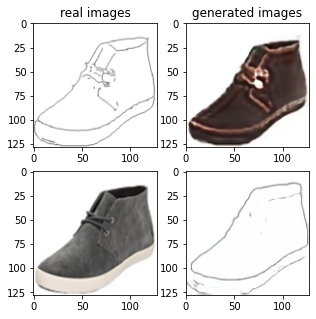

Train Epoch: 1 56% 	Total Loss: 1.369000 	Loss_G_AB: 0.301586	Loss_G_BA: 1.010535	Loss_cycle: 0.477015	Loss_D_A: 0.004158	Loss_D_B: 0.231767
0 28009 T:  1.4818599224090576
Train Epoch: 1 56% 	Total Loss: 1.350479 	Loss_G_AB: 0.306200	Loss_G_BA: 0.978304	Loss_cycle: 0.469216	Loss_D_A: 0.005026	Loss_D_B: 0.233985
0 28019 T:  0.6837222576141357
Train Epoch: 1 56% 	Total Loss: 1.446152 	Loss_G_AB: 0.344570	Loss_G_BA: 0.975496	Loss_cycle: 0.559711	Loss_D_A: 0.006876	Loss_D_B: 0.219531
0 28029 T:  0.6833770275115967
Train Epoch: 1 56% 	Total Loss: 1.349480 	Loss_G_AB: 0.270944	Loss_G_BA: 0.981770	Loss_cycle: 0.444750	Loss_D_A: 0.011494	Loss_D_B: 0.266879
0 28039 T:  0.6926498413085938
Train Epoch: 1 56% 	Total Loss: 1.458579 	Loss_G_AB: 0.288787	Loss_G_BA: 0.996449	Loss_cycle: 0.574857	Loss_D_A: 0.003402	Loss_D_B: 0.237703
0 28049 T:  0.6818559169769287
Train Epoch: 1 56% 	Total Loss: 1.293389 	Loss_G_AB: 0.257890	Loss_G_BA: 1.006774	Loss_cycle: 0.406747	Loss_D_A: 0.005759	Loss_D_B: 0.248551

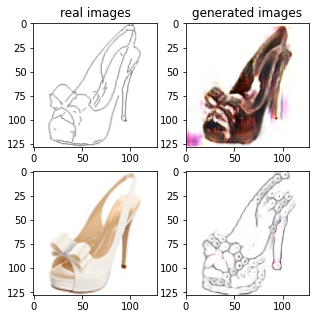

Train Epoch: 1 58% 	Total Loss: 1.809703 	Loss_G_AB: 0.334322	Loss_G_BA: 0.999849	Loss_cycle: 0.871077	Loss_D_A: 0.004193	Loss_D_B: 0.267347
0 29009 T:  1.3882851600646973
Train Epoch: 1 58% 	Total Loss: 1.602671 	Loss_G_AB: 0.280525	Loss_G_BA: 0.976717	Loss_cycle: 0.691617	Loss_D_A: 0.003068	Loss_D_B: 0.279366
0 29019 T:  0.6722939014434814
Train Epoch: 1 58% 	Total Loss: 1.404447 	Loss_G_AB: 0.298702	Loss_G_BA: 0.975637	Loss_cycle: 0.511781	Loss_D_A: 0.004863	Loss_D_B: 0.250633
0 29029 T:  0.6635851860046387
Train Epoch: 1 58% 	Total Loss: 1.262592 	Loss_G_AB: 0.279200	Loss_G_BA: 0.899083	Loss_cycle: 0.402385	Loss_D_A: 0.022649	Loss_D_B: 0.248416
0 29039 T:  0.6841390132904053
Train Epoch: 1 58% 	Total Loss: 1.574952 	Loss_G_AB: 0.288510	Loss_G_BA: 1.065952	Loss_cycle: 0.619940	Loss_D_A: 0.034784	Loss_D_B: 0.242998
0 29049 T:  0.6566019058227539
Train Epoch: 1 58% 	Total Loss: 1.433346 	Loss_G_AB: 0.298999	Loss_G_BA: 0.954999	Loss_cycle: 0.544295	Loss_D_A: 0.010886	Loss_D_B: 0.251167

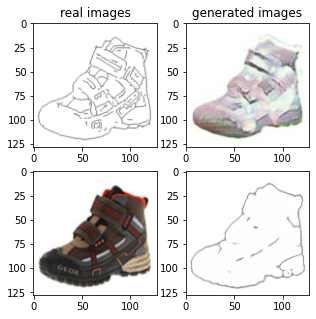

Train Epoch: 1 60% 	Total Loss: 1.372768 	Loss_G_AB: 0.277379	Loss_G_BA: 0.829797	Loss_cycle: 0.476564	Loss_D_A: 0.079137	Loss_D_B: 0.263479
0 30009 T:  1.4057159423828125
Train Epoch: 1 60% 	Total Loss: 1.316965 	Loss_G_AB: 0.305556	Loss_G_BA: 0.870836	Loss_cycle: 0.443697	Loss_D_A: 0.042064	Loss_D_B: 0.243008
0 30019 T:  0.6744461059570312
Train Epoch: 1 60% 	Total Loss: 1.430828 	Loss_G_AB: 0.288020	Loss_G_BA: 1.018364	Loss_cycle: 0.497288	Loss_D_A: 0.021598	Loss_D_B: 0.258750
0 30029 T:  0.6936004161834717
Train Epoch: 1 60% 	Total Loss: 1.465927 	Loss_G_AB: 0.321620	Loss_G_BA: 1.006743	Loss_cycle: 0.563886	Loss_D_A: 0.011169	Loss_D_B: 0.226690
0 30039 T:  0.6640400886535645
Train Epoch: 1 60% 	Total Loss: 1.437860 	Loss_G_AB: 0.322323	Loss_G_BA: 0.955840	Loss_cycle: 0.528058	Loss_D_A: 0.010873	Loss_D_B: 0.259848
0 30049 T:  0.6625854969024658
Train Epoch: 1 60% 	Total Loss: 1.304450 	Loss_G_AB: 0.297401	Loss_G_BA: 1.015360	Loss_cycle: 0.388233	Loss_D_A: 0.010174	Loss_D_B: 0.249661

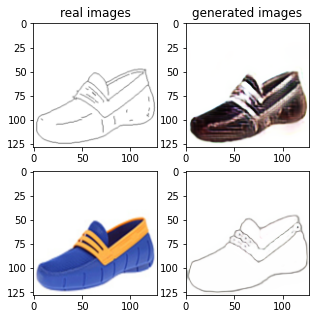

Train Epoch: 1 62% 	Total Loss: 1.302564 	Loss_G_AB: 0.316623	Loss_G_BA: 0.864275	Loss_cycle: 0.445087	Loss_D_A: 0.019617	Loss_D_B: 0.247411
0 31009 T:  1.3908884525299072
Train Epoch: 1 62% 	Total Loss: 1.344685 	Loss_G_AB: 0.286997	Loss_G_BA: 0.975049	Loss_cycle: 0.441408	Loss_D_A: 0.016182	Loss_D_B: 0.256072
0 31019 T:  0.665290355682373
Train Epoch: 1 62% 	Total Loss: 1.332161 	Loss_G_AB: 0.270965	Loss_G_BA: 0.988408	Loss_cycle: 0.433614	Loss_D_A: 0.010216	Loss_D_B: 0.258644
0 31029 T:  0.6736049652099609
Train Epoch: 1 62% 	Total Loss: 1.364933 	Loss_G_AB: 0.280686	Loss_G_BA: 1.013929	Loss_cycle: 0.467236	Loss_D_A: 0.005790	Loss_D_B: 0.244599
0 31039 T:  0.6755204200744629
Train Epoch: 1 62% 	Total Loss: 1.345944 	Loss_G_AB: 0.275925	Loss_G_BA: 0.981215	Loss_cycle: 0.451568	Loss_D_A: 0.006921	Loss_D_B: 0.258885
0 31049 T:  0.6587839126586914
Train Epoch: 1 62% 	Total Loss: 1.325128 	Loss_G_AB: 0.279800	Loss_G_BA: 1.008625	Loss_cycle: 0.420563	Loss_D_A: 0.004604	Loss_D_B: 0.255749


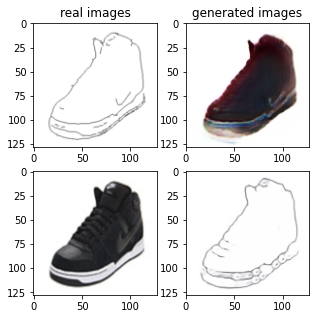

Train Epoch: 1 64% 	Total Loss: 1.413957 	Loss_G_AB: 0.286135	Loss_G_BA: 0.995413	Loss_cycle: 0.493264	Loss_D_A: 0.007076	Loss_D_B: 0.272843
0 32009 T:  1.4800424575805664
Train Epoch: 1 64% 	Total Loss: 1.376116 	Loss_G_AB: 0.299743	Loss_G_BA: 0.948545	Loss_cycle: 0.490477	Loss_D_A: 0.011417	Loss_D_B: 0.250077
0 32019 T:  0.678961992263794
Train Epoch: 1 64% 	Total Loss: 1.394319 	Loss_G_AB: 0.289230	Loss_G_BA: 1.016508	Loss_cycle: 0.493662	Loss_D_A: 0.003883	Loss_D_B: 0.243905
0 32029 T:  0.6634840965270996
Train Epoch: 1 64% 	Total Loss: 1.355847 	Loss_G_AB: 0.320329	Loss_G_BA: 0.969103	Loss_cycle: 0.493328	Loss_D_A: 0.004468	Loss_D_B: 0.213336
0 32039 T:  0.6630477905273438
Train Epoch: 1 64% 	Total Loss: 1.396130 	Loss_G_AB: 0.282836	Loss_G_BA: 1.000592	Loss_cycle: 0.491091	Loss_D_A: 0.007324	Loss_D_B: 0.256001
0 32049 T:  0.6917948722839355
Train Epoch: 1 64% 	Total Loss: 1.491870 	Loss_G_AB: 0.260411	Loss_G_BA: 0.973306	Loss_cycle: 0.621004	Loss_D_A: 0.009498	Loss_D_B: 0.244510


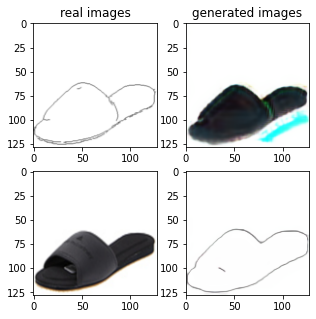

Train Epoch: 1 66% 	Total Loss: 1.404439 	Loss_G_AB: 0.273815	Loss_G_BA: 0.822699	Loss_cycle: 0.504122	Loss_D_A: 0.079852	Loss_D_B: 0.272209
0 33009 T:  1.4002163410186768
Train Epoch: 1 66% 	Total Loss: 1.388169 	Loss_G_AB: 0.304792	Loss_G_BA: 0.702445	Loss_cycle: 0.430751	Loss_D_A: 0.204677	Loss_D_B: 0.249123
0 33019 T:  0.6643738746643066
Train Epoch: 1 66% 	Total Loss: 1.299085 	Loss_G_AB: 0.293130	Loss_G_BA: 0.725512	Loss_cycle: 0.398243	Loss_D_A: 0.146463	Loss_D_B: 0.245058
0 33029 T:  0.688438892364502
Train Epoch: 1 66% 	Total Loss: 1.460589 	Loss_G_AB: 0.271142	Loss_G_BA: 0.785984	Loss_cycle: 0.536087	Loss_D_A: 0.121360	Loss_D_B: 0.274579
0 33039 T:  0.6618368625640869
Train Epoch: 1 66% 	Total Loss: 1.436839 	Loss_G_AB: 0.280158	Loss_G_BA: 0.793075	Loss_cycle: 0.494218	Loss_D_A: 0.144838	Loss_D_B: 0.261166
0 33049 T:  0.6581592559814453
Train Epoch: 1 66% 	Total Loss: 1.352365 	Loss_G_AB: 0.285035	Loss_G_BA: 0.965296	Loss_cycle: 0.421753	Loss_D_A: 0.044477	Loss_D_B: 0.260970


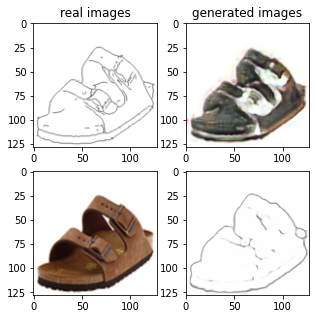

Train Epoch: 1 68% 	Total Loss: 1.321236 	Loss_G_AB: 0.258707	Loss_G_BA: 0.996808	Loss_cycle: 0.427375	Loss_D_A: 0.002321	Loss_D_B: 0.263782
0 34009 T:  1.405869722366333
Train Epoch: 1 68% 	Total Loss: 1.347641 	Loss_G_AB: 0.286544	Loss_G_BA: 0.996334	Loss_cycle: 0.452167	Loss_D_A: 0.002005	Loss_D_B: 0.252029
0 34019 T:  0.6702282428741455
Train Epoch: 1 68% 	Total Loss: 1.335362 	Loss_G_AB: 0.291712	Loss_G_BA: 1.010065	Loss_cycle: 0.391274	Loss_D_A: 0.001608	Loss_D_B: 0.291591
0 34029 T:  0.66489577293396
Train Epoch: 1 68% 	Total Loss: 1.229331 	Loss_G_AB: 0.478435	Loss_G_BA: 1.003301	Loss_cycle: 0.336124	Loss_D_A: 0.002075	Loss_D_B: 0.150264
0 34039 T:  0.6545555591583252
Train Epoch: 1 68% 	Total Loss: 1.352993 	Loss_G_AB: 0.335148	Loss_G_BA: 0.993594	Loss_cycle: 0.415565	Loss_D_A: 0.003088	Loss_D_B: 0.269970
0 34049 T:  0.6776783466339111
Train Epoch: 1 68% 	Total Loss: 1.700844 	Loss_G_AB: 0.517921	Loss_G_BA: 1.007220	Loss_cycle: 0.426244	Loss_D_A: 0.001651	Loss_D_B: 0.510378
0 

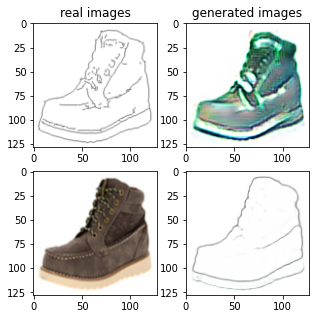

Train Epoch: 1 70% 	Total Loss: 1.267520 	Loss_G_AB: 0.304204	Loss_G_BA: 0.992768	Loss_cycle: 0.381426	Loss_D_A: 0.002937	Loss_D_B: 0.234671
0 35009 T:  1.4244115352630615
Train Epoch: 1 70% 	Total Loss: 1.342105 	Loss_G_AB: 0.347319	Loss_G_BA: 0.992882	Loss_cycle: 0.423368	Loss_D_A: 0.002643	Loss_D_B: 0.245993
0 35019 T:  0.7744731903076172
Train Epoch: 1 70% 	Total Loss: 1.414087 	Loss_G_AB: 0.276443	Loss_G_BA: 1.000906	Loss_cycle: 0.472746	Loss_D_A: 0.003585	Loss_D_B: 0.299082
0 35029 T:  0.669414758682251
Train Epoch: 1 70% 	Total Loss: 1.417775 	Loss_G_AB: 0.377034	Loss_G_BA: 1.029041	Loss_cycle: 0.471846	Loss_D_A: 0.003728	Loss_D_B: 0.239164
0 35039 T:  0.6709425449371338
Train Epoch: 1 70% 	Total Loss: 1.481699 	Loss_G_AB: 0.290113	Loss_G_BA: 1.009532	Loss_cycle: 0.568254	Loss_D_A: 0.004097	Loss_D_B: 0.259525
0 35049 T:  0.6947715282440186
Train Epoch: 1 70% 	Total Loss: 1.402980 	Loss_G_AB: 0.258742	Loss_G_BA: 0.968664	Loss_cycle: 0.505582	Loss_D_A: 0.003310	Loss_D_B: 0.280385


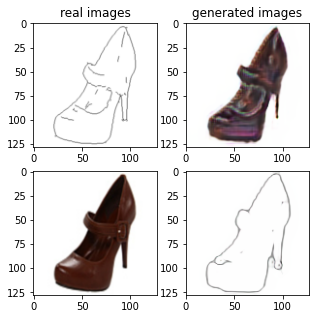

Train Epoch: 1 72% 	Total Loss: 1.367760 	Loss_G_AB: 0.305227	Loss_G_BA: 1.014901	Loss_cycle: 0.458844	Loss_D_A: 0.002991	Loss_D_B: 0.245860
0 36009 T:  1.3614492416381836
Train Epoch: 1 72% 	Total Loss: 1.320955 	Loss_G_AB: 0.291864	Loss_G_BA: 0.997563	Loss_cycle: 0.428086	Loss_D_A: 0.002691	Loss_D_B: 0.245465
0 36019 T:  0.6945726871490479
Train Epoch: 1 72% 	Total Loss: 1.434302 	Loss_G_AB: 0.320326	Loss_G_BA: 0.986685	Loss_cycle: 0.549106	Loss_D_A: 0.003096	Loss_D_B: 0.228594
0 36029 T:  0.6802504062652588
Train Epoch: 1 72% 	Total Loss: 1.463669 	Loss_G_AB: 0.299936	Loss_G_BA: 0.987959	Loss_cycle: 0.556655	Loss_D_A: 0.007848	Loss_D_B: 0.255218
0 36039 T:  0.6581318378448486
Train Epoch: 1 72% 	Total Loss: 1.341466 	Loss_G_AB: 0.303993	Loss_G_BA: 0.947537	Loss_cycle: 0.432716	Loss_D_A: 0.029622	Loss_D_B: 0.253363
0 36049 T:  0.6560752391815186
Train Epoch: 1 72% 	Total Loss: 1.221856 	Loss_G_AB: 0.308944	Loss_G_BA: 0.942850	Loss_cycle: 0.352845	Loss_D_A: 0.009020	Loss_D_B: 0.234094

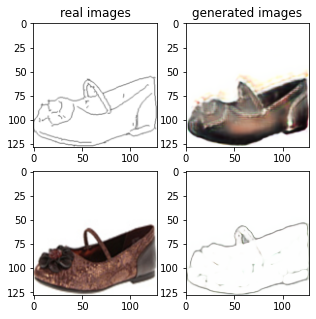

Train Epoch: 1 74% 	Total Loss: 1.330267 	Loss_G_AB: 0.280521	Loss_G_BA: 1.004440	Loss_cycle: 0.431532	Loss_D_A: 0.001659	Loss_D_B: 0.254595
0 37009 T:  1.3725335597991943
Train Epoch: 1 74% 	Total Loss: 1.301278 	Loss_G_AB: 0.284222	Loss_G_BA: 0.993005	Loss_cycle: 0.416680	Loss_D_A: 0.001551	Loss_D_B: 0.244434
0 37019 T:  0.6752088069915771
Train Epoch: 1 74% 	Total Loss: 1.383433 	Loss_G_AB: 0.321778	Loss_G_BA: 0.998968	Loss_cycle: 0.500272	Loss_D_A: 0.001546	Loss_D_B: 0.221243
0 37029 T:  0.6554996967315674
Train Epoch: 1 74% 	Total Loss: 1.453033 	Loss_G_AB: 0.306429	Loss_G_BA: 0.998857	Loss_cycle: 0.549071	Loss_D_A: 0.002173	Loss_D_B: 0.249146
0 37039 T:  0.6701440811157227
Train Epoch: 1 74% 	Total Loss: 1.370628 	Loss_G_AB: 0.314453	Loss_G_BA: 0.995513	Loss_cycle: 0.456053	Loss_D_A: 0.003037	Loss_D_B: 0.256556
0 37049 T:  0.648918628692627
Train Epoch: 1 74% 	Total Loss: 1.318387 	Loss_G_AB: 0.301481	Loss_G_BA: 0.997293	Loss_cycle: 0.431653	Loss_D_A: 0.002723	Loss_D_B: 0.234624


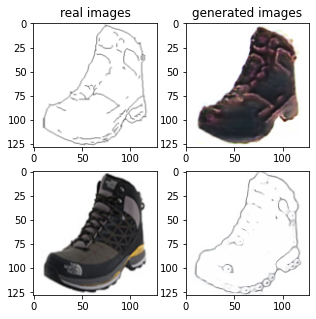

Train Epoch: 1 76% 	Total Loss: 1.347168 	Loss_G_AB: 0.279409	Loss_G_BA: 1.026378	Loss_cycle: 0.439093	Loss_D_A: 0.002662	Loss_D_B: 0.252520
0 38009 T:  1.486332893371582
Train Epoch: 1 76% 	Total Loss: 1.395992 	Loss_G_AB: 0.307300	Loss_G_BA: 0.965065	Loss_cycle: 0.515830	Loss_D_A: 0.003063	Loss_D_B: 0.240916
0 38019 T:  0.6683917045593262
Train Epoch: 1 76% 	Total Loss: 1.324933 	Loss_G_AB: 0.305868	Loss_G_BA: 0.992380	Loss_cycle: 0.419225	Loss_D_A: 0.008446	Loss_D_B: 0.248138
0 38029 T:  0.6960570812225342
Train Epoch: 1 76% 	Total Loss: 1.335339 	Loss_G_AB: 0.287990	Loss_G_BA: 0.998059	Loss_cycle: 0.444695	Loss_D_A: 0.007937	Loss_D_B: 0.239683
0 38039 T:  0.6920826435089111
Train Epoch: 1 76% 	Total Loss: 1.388651 	Loss_G_AB: 0.288542	Loss_G_BA: 0.957909	Loss_cycle: 0.516577	Loss_D_A: 0.007784	Loss_D_B: 0.241065
0 38049 T:  0.662949800491333
Train Epoch: 1 76% 	Total Loss: 1.288298 	Loss_G_AB: 0.291384	Loss_G_BA: 0.949166	Loss_cycle: 0.423844	Loss_D_A: 0.016179	Loss_D_B: 0.228000
0

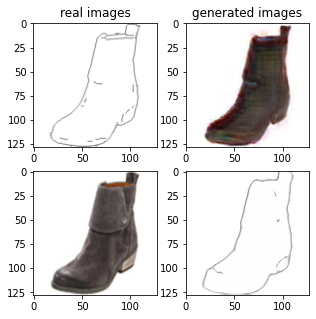

Train Epoch: 1 78% 	Total Loss: 1.321354 	Loss_G_AB: 0.287487	Loss_G_BA: 1.015375	Loss_cycle: 0.401892	Loss_D_A: 0.006395	Loss_D_B: 0.261635
0 39009 T:  1.4104528427124023
Train Epoch: 1 78% 	Total Loss: 1.346738 	Loss_G_AB: 0.312748	Loss_G_BA: 1.000669	Loss_cycle: 0.436006	Loss_D_A: 0.003154	Loss_D_B: 0.250870
0 39019 T:  0.6674854755401611
Train Epoch: 1 78% 	Total Loss: 1.478444 	Loss_G_AB: 0.264799	Loss_G_BA: 0.987631	Loss_cycle: 0.565880	Loss_D_A: 0.003318	Loss_D_B: 0.283031
0 39029 T:  0.7098710536956787
Train Epoch: 1 78% 	Total Loss: 1.241123 	Loss_G_AB: 0.304126	Loss_G_BA: 0.996600	Loss_cycle: 0.362217	Loss_D_A: 0.007016	Loss_D_B: 0.221528
0 39039 T:  0.6615860462188721
Train Epoch: 1 78% 	Total Loss: 1.471471 	Loss_G_AB: 0.319359	Loss_G_BA: 0.979973	Loss_cycle: 0.607708	Loss_D_A: 0.007164	Loss_D_B: 0.206932
0 39049 T:  0.656559944152832
Train Epoch: 1 78% 	Total Loss: 1.387277 	Loss_G_AB: 0.332751	Loss_G_BA: 1.008019	Loss_cycle: 0.460208	Loss_D_A: 0.003096	Loss_D_B: 0.253588


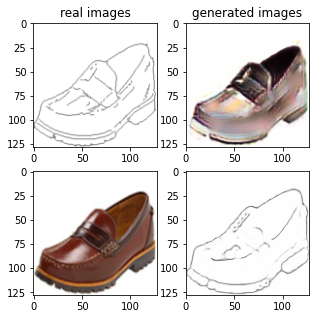

Train Epoch: 1 80% 	Total Loss: 1.270527 	Loss_G_AB: 0.273855	Loss_G_BA: 0.374743	Loss_cycle: 0.414293	Loss_D_A: 0.268112	Loss_D_B: 0.263822
0 40009 T:  1.409749984741211
Train Epoch: 1 80% 	Total Loss: 1.200736 	Loss_G_AB: 0.282062	Loss_G_BA: 0.322536	Loss_cycle: 0.427638	Loss_D_A: 0.226440	Loss_D_B: 0.244359
0 40019 T:  0.6635596752166748
Train Epoch: 1 80% 	Total Loss: 1.250567 	Loss_G_AB: 0.299910	Loss_G_BA: 0.350021	Loss_cycle: 0.497640	Loss_D_A: 0.212357	Loss_D_B: 0.215604
0 40029 T:  0.6802008152008057
Train Epoch: 1 80% 	Total Loss: 1.178108 	Loss_G_AB: 0.308367	Loss_G_BA: 0.411477	Loss_cycle: 0.394778	Loss_D_A: 0.186218	Loss_D_B: 0.237190
0 40039 T:  0.6898455619812012
Train Epoch: 1 80% 	Total Loss: 1.273286 	Loss_G_AB: 0.259038	Loss_G_BA: 0.370352	Loss_cycle: 0.486240	Loss_D_A: 0.221069	Loss_D_B: 0.251282
0 40049 T:  0.657395601272583
Train Epoch: 1 80% 	Total Loss: 1.151533 	Loss_G_AB: 0.330901	Loss_G_BA: 0.351754	Loss_cycle: 0.352189	Loss_D_A: 0.201575	Loss_D_B: 0.256441
0

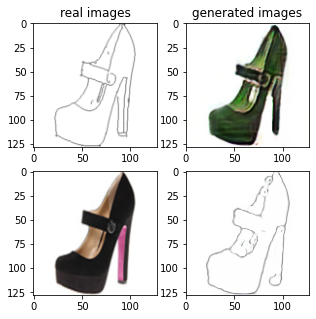

Train Epoch: 1 82% 	Total Loss: 1.479334 	Loss_G_AB: 0.311924	Loss_G_BA: 0.757258	Loss_cycle: 0.606675	Loss_D_A: 0.090031	Loss_D_B: 0.248036
0 41009 T:  1.375434160232544
Train Epoch: 1 82% 	Total Loss: 1.421298 	Loss_G_AB: 0.392304	Loss_G_BA: 0.726169	Loss_cycle: 0.501395	Loss_D_A: 0.143106	Loss_D_B: 0.217561
0 41019 T:  0.6772294044494629
Train Epoch: 1 82% 	Total Loss: 1.504499 	Loss_G_AB: 0.258066	Loss_G_BA: 0.671652	Loss_cycle: 0.599186	Loss_D_A: 0.132749	Loss_D_B: 0.307704
0 41029 T:  0.6673903465270996
Train Epoch: 1 82% 	Total Loss: 1.421922 	Loss_G_AB: 0.331454	Loss_G_BA: 0.712980	Loss_cycle: 0.582311	Loss_D_A: 0.097603	Loss_D_B: 0.219791
0 41039 T:  0.6912214756011963
Train Epoch: 1 82% 	Total Loss: 1.453925 	Loss_G_AB: 0.332808	Loss_G_BA: 0.818860	Loss_cycle: 0.571513	Loss_D_A: 0.065037	Loss_D_B: 0.241540
0 41049 T:  0.6680939197540283
Train Epoch: 1 82% 	Total Loss: 1.368783 	Loss_G_AB: 0.235665	Loss_G_BA: 0.708790	Loss_cycle: 0.525780	Loss_D_A: 0.092896	Loss_D_B: 0.277880


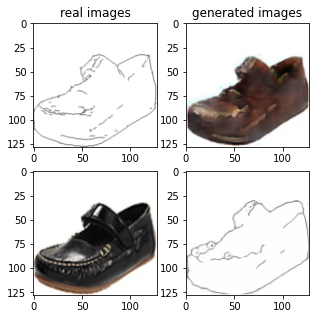

Train Epoch: 1 84% 	Total Loss: 1.400098 	Loss_G_AB: 0.319730	Loss_G_BA: 0.988358	Loss_cycle: 0.492115	Loss_D_A: 0.025609	Loss_D_B: 0.228329
0 42009 T:  1.38411545753479
Train Epoch: 1 84% 	Total Loss: 1.438902 	Loss_G_AB: 0.319480	Loss_G_BA: 0.996427	Loss_cycle: 0.514511	Loss_D_A: 0.016988	Loss_D_B: 0.249450
0 42019 T:  0.6635563373565674
Train Epoch: 1 84% 	Total Loss: 1.334574 	Loss_G_AB: 0.299705	Loss_G_BA: 0.959063	Loss_cycle: 0.458074	Loss_D_A: 0.013977	Loss_D_B: 0.233139
0 42029 T:  0.6735494136810303
Train Epoch: 1 84% 	Total Loss: 1.386542 	Loss_G_AB: 0.262680	Loss_G_BA: 0.946506	Loss_cycle: 0.502048	Loss_D_A: 0.012133	Loss_D_B: 0.267768
0 42039 T:  0.6775200366973877
Train Epoch: 1 84% 	Total Loss: 1.437150 	Loss_G_AB: 0.315615	Loss_G_BA: 1.062149	Loss_cycle: 0.476107	Loss_D_A: 0.014301	Loss_D_B: 0.257860
0 42049 T:  0.661766529083252
Train Epoch: 1 84% 	Total Loss: 1.400183 	Loss_G_AB: 0.259607	Loss_G_BA: 1.017015	Loss_cycle: 0.471170	Loss_D_A: 0.026870	Loss_D_B: 0.263832
0 

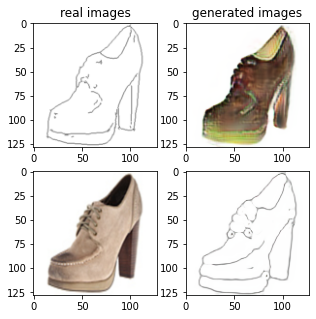

Train Epoch: 1 86% 	Total Loss: 1.342184 	Loss_G_AB: 0.300916	Loss_G_BA: 0.848340	Loss_cycle: 0.457685	Loss_D_A: 0.040375	Loss_D_B: 0.269497
0 43009 T:  1.384305715560913
Train Epoch: 1 86% 	Total Loss: 1.339669 	Loss_G_AB: 0.292948	Loss_G_BA: 0.857465	Loss_cycle: 0.473129	Loss_D_A: 0.047496	Loss_D_B: 0.243837
0 43019 T:  0.6893885135650635
Train Epoch: 1 86% 	Total Loss: 1.485714 	Loss_G_AB: 0.318511	Loss_G_BA: 0.927108	Loss_cycle: 0.597704	Loss_D_A: 0.019891	Loss_D_B: 0.245310
0 43029 T:  0.666013240814209
Train Epoch: 1 86% 	Total Loss: 1.434081 	Loss_G_AB: 0.298374	Loss_G_BA: 0.991489	Loss_cycle: 0.504952	Loss_D_A: 0.054287	Loss_D_B: 0.229910
0 43039 T:  0.6611976623535156
Train Epoch: 1 86% 	Total Loss: 1.289050 	Loss_G_AB: 0.316733	Loss_G_BA: 0.792462	Loss_cycle: 0.432826	Loss_D_A: 0.079328	Loss_D_B: 0.222300
0 43049 T:  0.6662619113922119
Train Epoch: 1 86% 	Total Loss: 1.351365 	Loss_G_AB: 0.292152	Loss_G_BA: 0.723395	Loss_cycle: 0.520216	Loss_D_A: 0.093433	Loss_D_B: 0.229943
0

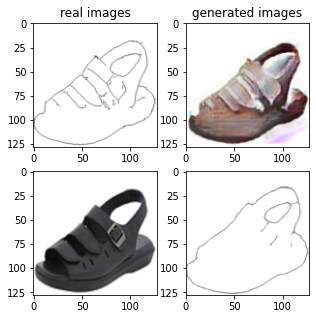

Train Epoch: 1 88% 	Total Loss: 1.370369 	Loss_G_AB: 0.263779	Loss_G_BA: 0.915254	Loss_cycle: 0.476240	Loss_D_A: 0.046951	Loss_D_B: 0.257662
0 44009 T:  1.5113239288330078
Train Epoch: 1 88% 	Total Loss: 1.319176 	Loss_G_AB: 0.285960	Loss_G_BA: 0.894794	Loss_cycle: 0.421072	Loss_D_A: 0.045920	Loss_D_B: 0.261808
0 44019 T:  0.6754367351531982
Train Epoch: 1 88% 	Total Loss: 1.434302 	Loss_G_AB: 0.284556	Loss_G_BA: 1.012706	Loss_cycle: 0.527393	Loss_D_A: 0.009709	Loss_D_B: 0.248569
0 44029 T:  0.6773409843444824
Train Epoch: 1 88% 	Total Loss: 1.335848 	Loss_G_AB: 0.289685	Loss_G_BA: 0.926441	Loss_cycle: 0.453650	Loss_D_A: 0.035528	Loss_D_B: 0.238607
0 44039 T:  0.6781926155090332
Train Epoch: 1 88% 	Total Loss: 1.381041 	Loss_G_AB: 0.265621	Loss_G_BA: 0.930829	Loss_cycle: 0.489424	Loss_D_A: 0.029357	Loss_D_B: 0.264034
0 44049 T:  0.6559152603149414
Train Epoch: 1 88% 	Total Loss: 1.472991 	Loss_G_AB: 0.278165	Loss_G_BA: 0.822723	Loss_cycle: 0.619919	Loss_D_A: 0.060327	Loss_D_B: 0.242301

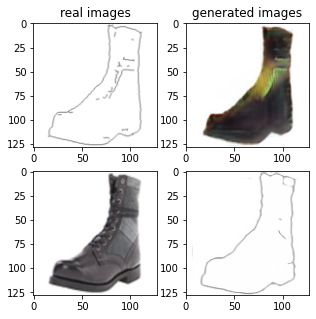

Train Epoch: 1 90% 	Total Loss: 1.363825 	Loss_G_AB: 0.297759	Loss_G_BA: 1.009486	Loss_cycle: 0.448147	Loss_D_A: 0.014416	Loss_D_B: 0.247639
0 45009 T:  1.4025509357452393
Train Epoch: 1 90% 	Total Loss: 1.345803 	Loss_G_AB: 0.287462	Loss_G_BA: 0.904124	Loss_cycle: 0.485934	Loss_D_A: 0.026639	Loss_D_B: 0.237437
0 45019 T:  0.6806511878967285
Train Epoch: 1 90% 	Total Loss: 1.264093 	Loss_G_AB: 0.278271	Loss_G_BA: 0.871278	Loss_cycle: 0.412209	Loss_D_A: 0.038365	Loss_D_B: 0.238744
0 45029 T:  0.6758229732513428
Train Epoch: 1 90% 	Total Loss: 1.481776 	Loss_G_AB: 0.297327	Loss_G_BA: 1.018214	Loss_cycle: 0.553252	Loss_D_A: 0.033162	Loss_D_B: 0.237591
0 45039 T:  0.6694948673248291
Train Epoch: 1 90% 	Total Loss: 1.372161 	Loss_G_AB: 0.314270	Loss_G_BA: 0.998952	Loss_cycle: 0.472264	Loss_D_A: 0.012045	Loss_D_B: 0.231241
0 45049 T:  0.661888837814331
Train Epoch: 1 90% 	Total Loss: 1.501041 	Loss_G_AB: 0.295038	Loss_G_BA: 0.988866	Loss_cycle: 0.602220	Loss_D_A: 0.021549	Loss_D_B: 0.235319


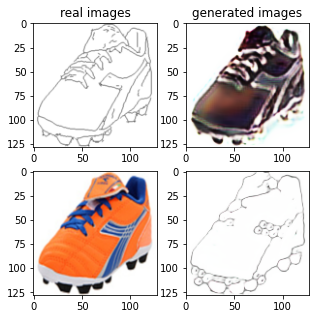

Train Epoch: 1 92% 	Total Loss: 1.518858 	Loss_G_AB: 0.327359	Loss_G_BA: 0.987003	Loss_cycle: 0.604978	Loss_D_A: 0.022368	Loss_D_B: 0.234332
0 46009 T:  1.4116177558898926
Train Epoch: 1 92% 	Total Loss: 1.262098 	Loss_G_AB: 0.276369	Loss_G_BA: 0.954213	Loss_cycle: 0.390680	Loss_D_A: 0.016822	Loss_D_B: 0.239305
0 46019 T:  0.6618115901947021
Train Epoch: 1 92% 	Total Loss: 1.257395 	Loss_G_AB: 0.321412	Loss_G_BA: 0.939192	Loss_cycle: 0.398530	Loss_D_A: 0.012144	Loss_D_B: 0.216418
0 46029 T:  0.6662561893463135
Train Epoch: 1 92% 	Total Loss: 1.316420 	Loss_G_AB: 0.276791	Loss_G_BA: 1.059447	Loss_cycle: 0.371807	Loss_D_A: 0.008324	Loss_D_B: 0.268170
0 46039 T:  0.6691579818725586
Train Epoch: 1 92% 	Total Loss: 1.373527 	Loss_G_AB: 0.291838	Loss_G_BA: 1.001010	Loss_cycle: 0.472827	Loss_D_A: 0.004749	Loss_D_B: 0.249526
0 46049 T:  0.6748161315917969
Train Epoch: 1 92% 	Total Loss: 1.355493 	Loss_G_AB: 0.291890	Loss_G_BA: 0.951801	Loss_cycle: 0.483299	Loss_D_A: 0.009220	Loss_D_B: 0.241129

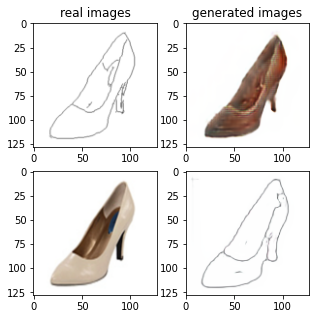

Train Epoch: 1 94% 	Total Loss: 1.377285 	Loss_G_AB: 0.267430	Loss_G_BA: 0.996570	Loss_cycle: 0.438664	Loss_D_A: 0.010328	Loss_D_B: 0.296294
0 47009 T:  1.3947865962982178
Train Epoch: 1 94% 	Total Loss: 1.384912 	Loss_G_AB: 0.272560	Loss_G_BA: 0.936571	Loss_cycle: 0.506646	Loss_D_A: 0.016279	Loss_D_B: 0.257422
0 47019 T:  0.6599941253662109
Train Epoch: 1 94% 	Total Loss: 1.290712 	Loss_G_AB: 0.314292	Loss_G_BA: 0.726308	Loss_cycle: 0.406436	Loss_D_A: 0.142387	Loss_D_B: 0.221589
0 47029 T:  0.666271448135376
Train Epoch: 1 94% 	Total Loss: 1.259698 	Loss_G_AB: 0.302747	Loss_G_BA: 0.522321	Loss_cycle: 0.440825	Loss_D_A: 0.161813	Loss_D_B: 0.244526
0 47039 T:  0.668377161026001
Train Epoch: 1 94% 	Total Loss: 1.178965 	Loss_G_AB: 0.305896	Loss_G_BA: 0.746664	Loss_cycle: 0.327944	Loss_D_A: 0.085760	Loss_D_B: 0.238982
0 47049 T:  0.6640985012054443
Train Epoch: 1 94% 	Total Loss: 1.401896 	Loss_G_AB: 0.294597	Loss_G_BA: 1.033399	Loss_cycle: 0.470609	Loss_D_A: 0.026982	Loss_D_B: 0.240307
0

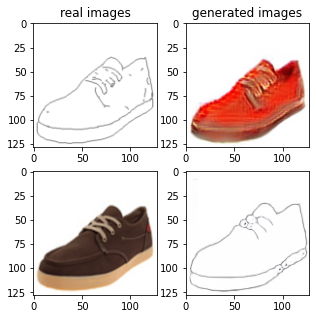

Train Epoch: 1 96% 	Total Loss: 1.511664 	Loss_G_AB: 0.348731	Loss_G_BA: 1.027155	Loss_cycle: 0.542393	Loss_D_A: 0.018710	Loss_D_B: 0.262618
0 48009 T:  1.4203736782073975
Train Epoch: 1 96% 	Total Loss: 1.341725 	Loss_G_AB: 0.292212	Loss_G_BA: 0.991919	Loss_cycle: 0.443384	Loss_D_A: 0.006104	Loss_D_B: 0.250172
0 48019 T:  0.6813457012176514
Train Epoch: 1 96% 	Total Loss: 1.426749 	Loss_G_AB: 0.334463	Loss_G_BA: 0.970590	Loss_cycle: 0.519565	Loss_D_A: 0.011197	Loss_D_B: 0.243460
0 48029 T:  0.670428991317749
Train Epoch: 1 96% 	Total Loss: 1.489065 	Loss_G_AB: 0.300888	Loss_G_BA: 0.994845	Loss_cycle: 0.597856	Loss_D_A: 0.009626	Loss_D_B: 0.233716
0 48039 T:  0.6735165119171143
Train Epoch: 1 96% 	Total Loss: 1.413609 	Loss_G_AB: 0.317472	Loss_G_BA: 0.968039	Loss_cycle: 0.518633	Loss_D_A: 0.018228	Loss_D_B: 0.233992
0 48049 T:  0.6872820854187012
Train Epoch: 1 96% 	Total Loss: 1.187369 	Loss_G_AB: 0.276780	Loss_G_BA: 0.990915	Loss_cycle: 0.299568	Loss_D_A: 0.008993	Loss_D_B: 0.244959


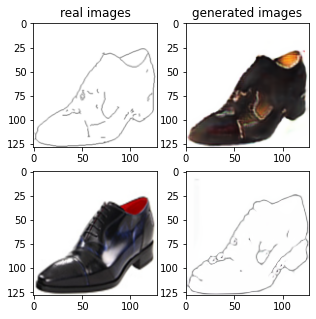

Train Epoch: 1 98% 	Total Loss: 1.335668 	Loss_G_AB: 0.292153	Loss_G_BA: 0.897546	Loss_cycle: 0.422988	Loss_D_A: 0.048472	Loss_D_B: 0.269358
0 49009 T:  1.4399619102478027
Train Epoch: 1 98% 	Total Loss: 1.358572 	Loss_G_AB: 0.304012	Loss_G_BA: 0.976431	Loss_cycle: 0.468033	Loss_D_A: 0.010429	Loss_D_B: 0.239888
0 49019 T:  0.6672646999359131
Train Epoch: 1 98% 	Total Loss: 1.434004 	Loss_G_AB: 0.279072	Loss_G_BA: 1.041200	Loss_cycle: 0.511078	Loss_D_A: 0.012778	Loss_D_B: 0.250013
0 49029 T:  0.6691117286682129
Train Epoch: 1 98% 	Total Loss: 1.477894 	Loss_G_AB: 0.274922	Loss_G_BA: 0.904045	Loss_cycle: 0.634446	Loss_D_A: 0.016313	Loss_D_B: 0.237652
0 49039 T:  0.6639199256896973
Train Epoch: 1 98% 	Total Loss: 1.305079 	Loss_G_AB: 0.292992	Loss_G_BA: 0.848748	Loss_cycle: 0.427265	Loss_D_A: 0.054751	Loss_D_B: 0.252193
0 49049 T:  0.6782808303833008
Train Epoch: 1 98% 	Total Loss: 1.353936 	Loss_G_AB: 0.274906	Loss_G_BA: 0.790050	Loss_cycle: 0.463674	Loss_D_A: 0.102265	Loss_D_B: 0.255520

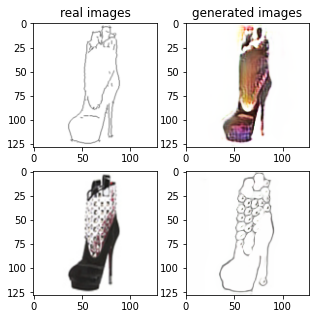

Train Epoch: 2 0% 	Total Loss: 1.211486 	Loss_G_AB: 0.275531	Loss_G_BA: 0.988806	Loss_cycle: 0.336300	Loss_D_A: 0.002522	Loss_D_B: 0.240496
1 50009 T:  1.4726746082305908
Train Epoch: 2 0% 	Total Loss: 1.215272 	Loss_G_AB: 0.300464	Loss_G_BA: 0.992706	Loss_cycle: 0.299691	Loss_D_A: 0.020523	Loss_D_B: 0.248473
1 50019 T:  0.6614503860473633
Train Epoch: 2 0% 	Total Loss: 1.345454 	Loss_G_AB: 0.325433	Loss_G_BA: 1.002198	Loss_cycle: 0.449412	Loss_D_A: 0.005294	Loss_D_B: 0.226932
1 50029 T:  0.6606287956237793
Train Epoch: 2 0% 	Total Loss: 1.317502 	Loss_G_AB: 0.306369	Loss_G_BA: 0.982885	Loss_cycle: 0.417568	Loss_D_A: 0.003066	Loss_D_B: 0.252241
1 50039 T:  0.6619656085968018
Train Epoch: 2 0% 	Total Loss: 1.324036 	Loss_G_AB: 0.296908	Loss_G_BA: 0.996597	Loss_cycle: 0.444444	Loss_D_A: 0.003580	Loss_D_B: 0.229259
1 50049 T:  0.6833343505859375
Train Epoch: 2 0% 	Total Loss: 1.403915 	Loss_G_AB: 0.350833	Loss_G_BA: 1.001876	Loss_cycle: 0.494985	Loss_D_A: 0.005040	Loss_D_B: 0.227536
1 500

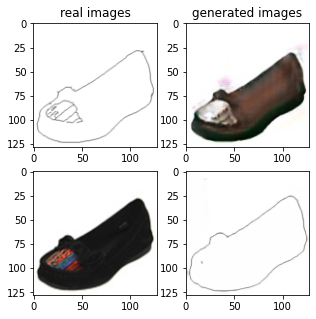

Train Epoch: 2 2% 	Total Loss: 1.224426 	Loss_G_AB: 0.256949	Loss_G_BA: 0.953539	Loss_cycle: 0.334335	Loss_D_A: 0.026072	Loss_D_B: 0.258776
1 51009 T:  1.4964804649353027
Train Epoch: 2 2% 	Total Loss: 1.399491 	Loss_G_AB: 0.335045	Loss_G_BA: 1.002964	Loss_cycle: 0.446390	Loss_D_A: 0.032259	Loss_D_B: 0.251838
1 51019 T:  0.7915928363800049
Train Epoch: 2 2% 	Total Loss: 1.374039 	Loss_G_AB: 0.293727	Loss_G_BA: 0.950180	Loss_cycle: 0.501896	Loss_D_A: 0.012942	Loss_D_B: 0.237248
1 51029 T:  0.686234712600708
Train Epoch: 2 2% 	Total Loss: 1.392886 	Loss_G_AB: 0.320323	Loss_G_BA: 0.987238	Loss_cycle: 0.475434	Loss_D_A: 0.027420	Loss_D_B: 0.236252
1 51039 T:  0.6731405258178711
Train Epoch: 2 2% 	Total Loss: 1.437274 	Loss_G_AB: 0.329372	Loss_G_BA: 1.002583	Loss_cycle: 0.491431	Loss_D_A: 0.019593	Loss_D_B: 0.260273
1 51049 T:  0.6606442928314209
Train Epoch: 2 2% 	Total Loss: 1.364796 	Loss_G_AB: 0.306904	Loss_G_BA: 0.972731	Loss_cycle: 0.485045	Loss_D_A: 0.010599	Loss_D_B: 0.229335
1 5105

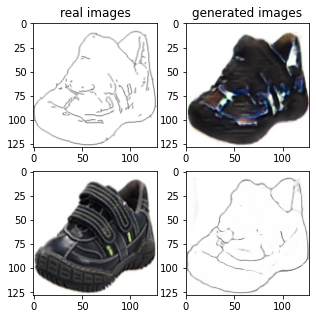

Train Epoch: 2 4% 	Total Loss: 1.273408 	Loss_G_AB: 0.291927	Loss_G_BA: 0.972904	Loss_cycle: 0.394605	Loss_D_A: 0.002322	Loss_D_B: 0.244065
1 52009 T:  1.4290103912353516
Train Epoch: 2 4% 	Total Loss: 1.360073 	Loss_G_AB: 0.338056	Loss_G_BA: 1.001454	Loss_cycle: 0.459005	Loss_D_A: 0.002511	Loss_D_B: 0.228803
1 52019 T:  0.6799817085266113
Train Epoch: 2 4% 	Total Loss: 1.269941 	Loss_G_AB: 0.269033	Loss_G_BA: 0.986990	Loss_cycle: 0.372485	Loss_D_A: 0.002694	Loss_D_B: 0.266749
1 52029 T:  0.6657290458679199
Train Epoch: 2 4% 	Total Loss: 1.307623 	Loss_G_AB: 0.281937	Loss_G_BA: 1.008532	Loss_cycle: 0.404538	Loss_D_A: 0.003716	Loss_D_B: 0.254135
1 52039 T:  0.6644608974456787
Train Epoch: 2 4% 	Total Loss: 1.200170 	Loss_G_AB: 0.323497	Loss_G_BA: 0.952167	Loss_cycle: 0.333732	Loss_D_A: 0.006513	Loss_D_B: 0.222093
1 52049 T:  0.6617722511291504
Train Epoch: 2 4% 	Total Loss: 1.261802 	Loss_G_AB: 0.325743	Loss_G_BA: 1.000427	Loss_cycle: 0.333148	Loss_D_A: 0.027757	Loss_D_B: 0.237811
1 520

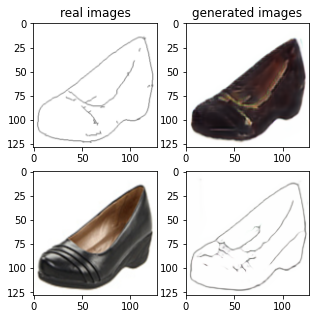

Train Epoch: 2 6% 	Total Loss: 1.253566 	Loss_G_AB: 0.300981	Loss_G_BA: 0.991631	Loss_cycle: 0.353680	Loss_D_A: 0.002624	Loss_D_B: 0.250955
1 53009 T:  1.3931245803833008
Train Epoch: 2 6% 	Total Loss: 1.446677 	Loss_G_AB: 0.306597	Loss_G_BA: 0.998623	Loss_cycle: 0.489395	Loss_D_A: 0.002623	Loss_D_B: 0.302050
1 53019 T:  0.654090166091919
Train Epoch: 2 6% 	Total Loss: 1.279796 	Loss_G_AB: 0.285206	Loss_G_BA: 0.989715	Loss_cycle: 0.380212	Loss_D_A: 0.001914	Loss_D_B: 0.260210
1 53029 T:  0.6690466403961182
Train Epoch: 2 6% 	Total Loss: 1.354094 	Loss_G_AB: 0.353571	Loss_G_BA: 0.994608	Loss_cycle: 0.438488	Loss_D_A: 0.002537	Loss_D_B: 0.238980
1 53039 T:  0.6684036254882812
Train Epoch: 2 6% 	Total Loss: 1.260002 	Loss_G_AB: 0.281616	Loss_G_BA: 0.991201	Loss_cycle: 0.367228	Loss_D_A: 0.003588	Loss_D_B: 0.252778
1 53049 T:  0.6592237949371338
Train Epoch: 2 6% 	Total Loss: 1.448771 	Loss_G_AB: 0.319589	Loss_G_BA: 0.998905	Loss_cycle: 0.569418	Loss_D_A: 0.003204	Loss_D_B: 0.216902
1 5305

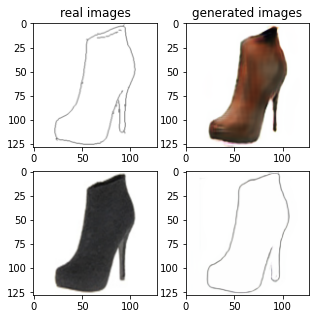

Train Epoch: 2 8% 	Total Loss: 1.280607 	Loss_G_AB: 0.288904	Loss_G_BA: 1.007961	Loss_cycle: 0.372760	Loss_D_A: 0.003367	Loss_D_B: 0.256047
1 54009 T:  1.8038413524627686
Train Epoch: 2 8% 	Total Loss: 1.208935 	Loss_G_AB: 0.375730	Loss_G_BA: 0.987555	Loss_cycle: 0.309743	Loss_D_A: 0.002312	Loss_D_B: 0.215237
1 54019 T:  0.6773045063018799
Train Epoch: 2 8% 	Total Loss: 1.388894 	Loss_G_AB: 0.249801	Loss_G_BA: 0.991810	Loss_cycle: 0.485660	Loss_D_A: 0.002965	Loss_D_B: 0.279463
1 54029 T:  0.6586925983428955
Train Epoch: 2 8% 	Total Loss: 1.460063 	Loss_G_AB: 0.312945	Loss_G_BA: 0.985751	Loss_cycle: 0.513155	Loss_D_A: 0.002967	Loss_D_B: 0.294593
1 54039 T:  0.6620166301727295
Train Epoch: 2 8% 	Total Loss: 1.374156 	Loss_G_AB: 0.293456	Loss_G_BA: 0.983966	Loss_cycle: 0.456968	Loss_D_A: 0.011841	Loss_D_B: 0.266635
1 54049 T:  0.6924586296081543
Train Epoch: 2 8% 	Total Loss: 1.393731 	Loss_G_AB: 0.273692	Loss_G_BA: 1.016590	Loss_cycle: 0.485939	Loss_D_A: 0.005903	Loss_D_B: 0.256749
1 540

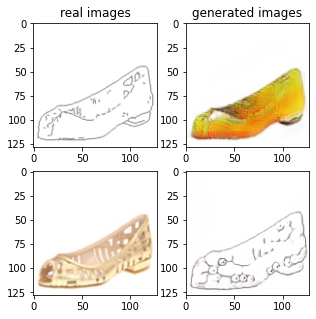

Train Epoch: 2 10% 	Total Loss: 1.354751 	Loss_G_AB: 0.343589	Loss_G_BA: 0.994427	Loss_cycle: 0.410253	Loss_D_A: 0.007669	Loss_D_B: 0.267821
1 55009 T:  1.401184320449829
Train Epoch: 2 10% 	Total Loss: 1.307465 	Loss_G_AB: 0.292236	Loss_G_BA: 0.990366	Loss_cycle: 0.423190	Loss_D_A: 0.006580	Loss_D_B: 0.236395
1 55019 T:  0.6770937442779541
Train Epoch: 2 10% 	Total Loss: 1.300024 	Loss_G_AB: 0.281763	Loss_G_BA: 0.928644	Loss_cycle: 0.437502	Loss_D_A: 0.011424	Loss_D_B: 0.245894
1 55029 T:  0.6654360294342041
Train Epoch: 2 10% 	Total Loss: 1.381818 	Loss_G_AB: 0.312551	Loss_G_BA: 0.980965	Loss_cycle: 0.512448	Loss_D_A: 0.004736	Loss_D_B: 0.217875
1 55039 T:  0.6685910224914551
Train Epoch: 2 10% 	Total Loss: 1.477039 	Loss_G_AB: 0.308362	Loss_G_BA: 1.005869	Loss_cycle: 0.571733	Loss_D_A: 0.008230	Loss_D_B: 0.239961
1 55049 T:  0.6771903038024902
Train Epoch: 2 11% 	Total Loss: 1.278911 	Loss_G_AB: 0.318295	Loss_G_BA: 0.999263	Loss_cycle: 0.380593	Loss_D_A: 0.006975	Loss_D_B: 0.232564


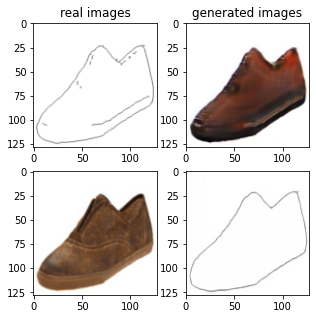

Train Epoch: 2 12% 	Total Loss: 1.219682 	Loss_G_AB: 0.279473	Loss_G_BA: 1.008597	Loss_cycle: 0.338375	Loss_D_A: 0.001994	Loss_D_B: 0.235278
1 56009 T:  1.4656481742858887
Train Epoch: 2 12% 	Total Loss: 1.313331 	Loss_G_AB: 0.284062	Loss_G_BA: 0.997365	Loss_cycle: 0.425119	Loss_D_A: 0.003841	Loss_D_B: 0.243658
1 56019 T:  0.6734986305236816
Train Epoch: 2 12% 	Total Loss: 1.375684 	Loss_G_AB: 0.285830	Loss_G_BA: 1.005379	Loss_cycle: 0.483111	Loss_D_A: 0.002729	Loss_D_B: 0.244240
1 56029 T:  0.670499324798584
Train Epoch: 2 12% 	Total Loss: 1.414196 	Loss_G_AB: 0.307305	Loss_G_BA: 0.992887	Loss_cycle: 0.488023	Loss_D_A: 0.003677	Loss_D_B: 0.272400
1 56039 T:  0.6722667217254639
Train Epoch: 2 12% 	Total Loss: 1.367517 	Loss_G_AB: 0.297172	Loss_G_BA: 1.007804	Loss_cycle: 0.485083	Loss_D_A: 0.002283	Loss_D_B: 0.227663
1 56049 T:  0.6717491149902344
Train Epoch: 2 13% 	Total Loss: 1.250321 	Loss_G_AB: 0.314663	Loss_G_BA: 1.009467	Loss_cycle: 0.356683	Loss_D_A: 0.003676	Loss_D_B: 0.227897


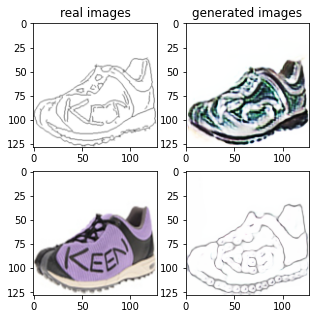

Train Epoch: 2 14% 	Total Loss: 1.352059 	Loss_G_AB: 0.311480	Loss_G_BA: 0.887942	Loss_cycle: 0.486168	Loss_D_A: 0.021789	Loss_D_B: 0.244391
1 57009 T:  1.3829410076141357
Train Epoch: 2 14% 	Total Loss: 1.283684 	Loss_G_AB: 0.328466	Loss_G_BA: 0.952237	Loss_cycle: 0.397315	Loss_D_A: 0.025524	Loss_D_B: 0.220494
1 57019 T:  0.6647825241088867
Train Epoch: 2 14% 	Total Loss: 1.390370 	Loss_G_AB: 0.304410	Loss_G_BA: 1.045916	Loss_cycle: 0.470076	Loss_D_A: 0.016497	Loss_D_B: 0.228634
1 57029 T:  0.6630082130432129
Train Epoch: 2 14% 	Total Loss: 1.333616 	Loss_G_AB: 0.312380	Loss_G_BA: 1.013384	Loss_cycle: 0.410992	Loss_D_A: 0.006073	Loss_D_B: 0.253670
1 57039 T:  0.6940641403198242
Train Epoch: 2 14% 	Total Loss: 1.355199 	Loss_G_AB: 0.292079	Loss_G_BA: 1.023699	Loss_cycle: 0.446672	Loss_D_A: 0.005159	Loss_D_B: 0.245480
1 57049 T:  0.6658411026000977
Train Epoch: 2 15% 	Total Loss: 1.369607 	Loss_G_AB: 0.311512	Loss_G_BA: 0.980133	Loss_cycle: 0.469689	Loss_D_A: 0.007260	Loss_D_B: 0.246836

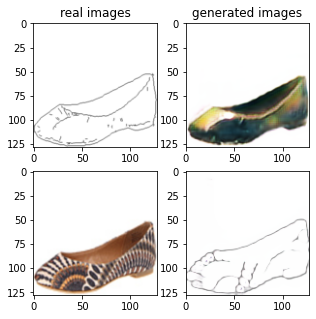

Train Epoch: 2 16% 	Total Loss: 1.373931 	Loss_G_AB: 0.299977	Loss_G_BA: 0.980525	Loss_cycle: 0.469671	Loss_D_A: 0.006835	Loss_D_B: 0.257174
1 58009 T:  1.3901138305664062
Train Epoch: 2 16% 	Total Loss: 1.340859 	Loss_G_AB: 0.325015	Loss_G_BA: 1.001326	Loss_cycle: 0.446029	Loss_D_A: 0.005723	Loss_D_B: 0.225936
1 58019 T:  0.7021045684814453
Train Epoch: 2 16% 	Total Loss: 1.296872 	Loss_G_AB: 0.319481	Loss_G_BA: 1.004259	Loss_cycle: 0.371587	Loss_D_A: 0.003472	Loss_D_B: 0.259943
1 58029 T:  0.6877684593200684
Train Epoch: 2 16% 	Total Loss: 1.253836 	Loss_G_AB: 0.367792	Loss_G_BA: 1.002116	Loss_cycle: 0.362030	Loss_D_A: 0.005688	Loss_D_B: 0.201165
1 58039 T:  0.6820039749145508
Train Epoch: 2 17% 	Total Loss: 1.411422 	Loss_G_AB: 0.300671	Loss_G_BA: 1.001308	Loss_cycle: 0.501289	Loss_D_A: 0.002997	Loss_D_B: 0.256146
1 58049 T:  0.6879980564117432
Train Epoch: 2 17% 	Total Loss: 1.314403 	Loss_G_AB: 0.278986	Loss_G_BA: 0.891317	Loss_cycle: 0.410256	Loss_D_A: 0.047254	Loss_D_B: 0.271741

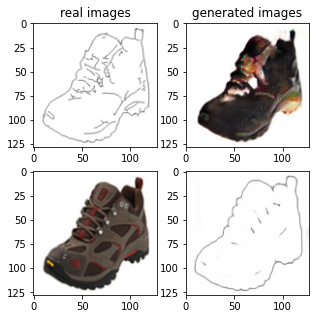

Train Epoch: 2 18% 	Total Loss: 1.323122 	Loss_G_AB: 0.254254	Loss_G_BA: 0.987442	Loss_cycle: 0.423530	Loss_D_A: 0.003713	Loss_D_B: 0.275030
1 59009 T:  1.7470006942749023
Train Epoch: 2 18% 	Total Loss: 1.305011 	Loss_G_AB: 0.301836	Loss_G_BA: 0.976584	Loss_cycle: 0.421126	Loss_D_A: 0.013018	Loss_D_B: 0.231657
1 59019 T:  0.6833775043487549
Train Epoch: 2 18% 	Total Loss: 1.291107 	Loss_G_AB: 0.316757	Loss_G_BA: 0.873517	Loss_cycle: 0.380883	Loss_D_A: 0.094970	Loss_D_B: 0.220117
1 59029 T:  0.7047939300537109
Train Epoch: 2 18% 	Total Loss: 1.419054 	Loss_G_AB: 0.306879	Loss_G_BA: 0.989265	Loss_cycle: 0.468447	Loss_D_A: 0.030455	Loss_D_B: 0.272080
1 59039 T:  0.6984834671020508
Train Epoch: 2 19% 	Total Loss: 1.287300 	Loss_G_AB: 0.342328	Loss_G_BA: 1.000118	Loss_cycle: 0.392071	Loss_D_A: 0.005200	Loss_D_B: 0.218806
1 59049 T:  0.690056324005127
Train Epoch: 2 19% 	Total Loss: 1.467490 	Loss_G_AB: 0.327284	Loss_G_BA: 0.992227	Loss_cycle: 0.550001	Loss_D_A: 0.003538	Loss_D_B: 0.254196


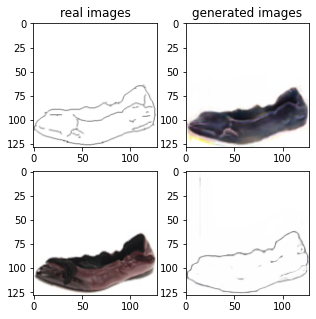

Train Epoch: 2 20% 	Total Loss: 1.278666 	Loss_G_AB: 0.317574	Loss_G_BA: 0.973812	Loss_cycle: 0.374525	Loss_D_A: 0.004721	Loss_D_B: 0.253727
1 60009 T:  1.4691898822784424
Train Epoch: 2 20% 	Total Loss: 1.244880 	Loss_G_AB: 0.343134	Loss_G_BA: 0.996958	Loss_cycle: 0.343592	Loss_D_A: 0.006694	Loss_D_B: 0.224548
1 60019 T:  0.7011420726776123
Train Epoch: 2 20% 	Total Loss: 1.281149 	Loss_G_AB: 0.280373	Loss_G_BA: 0.941467	Loss_cycle: 0.383080	Loss_D_A: 0.012911	Loss_D_B: 0.274238
1 60029 T:  0.7106039524078369
Train Epoch: 2 20% 	Total Loss: 1.249195 	Loss_G_AB: 0.300907	Loss_G_BA: 1.028142	Loss_cycle: 0.343065	Loss_D_A: 0.012156	Loss_D_B: 0.229449
1 60039 T:  0.7055325508117676
Train Epoch: 2 21% 	Total Loss: 1.440741 	Loss_G_AB: 0.316775	Loss_G_BA: 0.999462	Loss_cycle: 0.530198	Loss_D_A: 0.004562	Loss_D_B: 0.247862
1 60049 T:  0.7151217460632324
Train Epoch: 2 21% 	Total Loss: 1.363301 	Loss_G_AB: 0.289849	Loss_G_BA: 0.992924	Loss_cycle: 0.465614	Loss_D_A: 0.002616	Loss_D_B: 0.253685

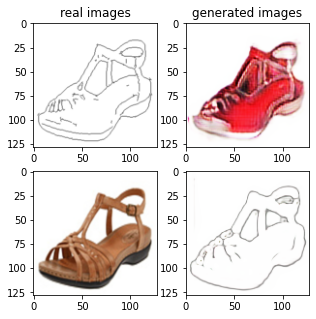

Train Epoch: 2 22% 	Total Loss: 1.306796 	Loss_G_AB: 0.306779	Loss_G_BA: 1.000741	Loss_cycle: 0.408096	Loss_D_A: 0.001909	Loss_D_B: 0.243031
1 61009 T:  1.4155714511871338
Train Epoch: 2 22% 	Total Loss: 1.421861 	Loss_G_AB: 0.304366	Loss_G_BA: 1.004356	Loss_cycle: 0.509450	Loss_D_A: 0.001802	Loss_D_B: 0.256248
1 61019 T:  0.7072057723999023
Train Epoch: 2 22% 	Total Loss: 1.226421 	Loss_G_AB: 0.309415	Loss_G_BA: 0.995975	Loss_cycle: 0.338601	Loss_D_A: 0.002358	Loss_D_B: 0.232767
1 61029 T:  0.6792545318603516
Train Epoch: 2 23% 	Total Loss: 1.289552 	Loss_G_AB: 0.318289	Loss_G_BA: 0.996226	Loss_cycle: 0.392579	Loss_D_A: 0.002461	Loss_D_B: 0.237254
1 61039 T:  0.6874034404754639
Train Epoch: 2 23% 	Total Loss: 1.325127 	Loss_G_AB: 0.260662	Loss_G_BA: 1.008338	Loss_cycle: 0.421256	Loss_D_A: 0.002481	Loss_D_B: 0.266889
1 61049 T:  0.6914584636688232
Train Epoch: 2 23% 	Total Loss: 1.329808 	Loss_G_AB: 0.311420	Loss_G_BA: 0.972793	Loss_cycle: 0.442933	Loss_D_A: 0.005829	Loss_D_B: 0.238939

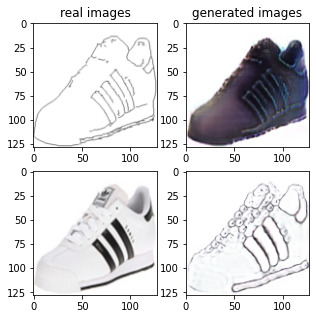

Train Epoch: 2 24% 	Total Loss: 1.409734 	Loss_G_AB: 0.367126	Loss_G_BA: 1.002002	Loss_cycle: 0.522759	Loss_D_A: 0.001781	Loss_D_B: 0.200630
1 62009 T:  1.505072832107544
Train Epoch: 2 24% 	Total Loss: 1.209631 	Loss_G_AB: 0.263947	Loss_G_BA: 0.976381	Loss_cycle: 0.311499	Loss_D_A: 0.006820	Loss_D_B: 0.271147
1 62019 T:  0.6848838329315186
Train Epoch: 2 24% 	Total Loss: 1.371332 	Loss_G_AB: 0.311327	Loss_G_BA: 0.994440	Loss_cycle: 0.493754	Loss_D_A: 0.003914	Loss_D_B: 0.220781
1 62029 T:  0.6948065757751465
Train Epoch: 2 25% 	Total Loss: 1.190840 	Loss_G_AB: 0.285476	Loss_G_BA: 0.985449	Loss_cycle: 0.300466	Loss_D_A: 0.010178	Loss_D_B: 0.244733
1 62039 T:  0.6933331489562988
Train Epoch: 2 25% 	Total Loss: 1.311259 	Loss_G_AB: 0.284370	Loss_G_BA: 1.000949	Loss_cycle: 0.419271	Loss_D_A: 0.008011	Loss_D_B: 0.241317
1 62049 T:  0.6773054599761963
Train Epoch: 2 25% 	Total Loss: 1.255239 	Loss_G_AB: 0.354897	Loss_G_BA: 0.975515	Loss_cycle: 0.372442	Loss_D_A: 0.004499	Loss_D_B: 0.213092


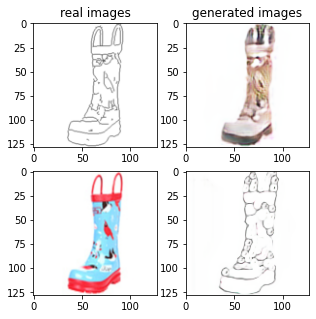

Train Epoch: 2 26% 	Total Loss: 1.386784 	Loss_G_AB: 0.281973	Loss_G_BA: 1.027568	Loss_cycle: 0.420071	Loss_D_A: 0.021595	Loss_D_B: 0.290347
1 63009 T:  1.3969900608062744
Train Epoch: 2 26% 	Total Loss: 1.437252 	Loss_G_AB: 0.300900	Loss_G_BA: 1.035194	Loss_cycle: 0.515778	Loss_D_A: 0.005108	Loss_D_B: 0.248319
1 63019 T:  0.7010550498962402
Train Epoch: 2 27% 	Total Loss: 1.285757 	Loss_G_AB: 0.326192	Loss_G_BA: 0.910633	Loss_cycle: 0.385838	Loss_D_A: 0.023415	Loss_D_B: 0.258092
1 63029 T:  0.6833145618438721
Train Epoch: 2 27% 	Total Loss: 1.416853 	Loss_G_AB: 0.306316	Loss_G_BA: 0.990213	Loss_cycle: 0.514073	Loss_D_A: 0.009398	Loss_D_B: 0.245118
1 63039 T:  0.6790363788604736
Train Epoch: 2 27% 	Total Loss: 1.313346 	Loss_G_AB: 0.280028	Loss_G_BA: 0.989767	Loss_cycle: 0.369754	Loss_D_A: 0.048929	Loss_D_B: 0.259765
1 63049 T:  0.682502269744873
Train Epoch: 2 27% 	Total Loss: 1.331531 	Loss_G_AB: 0.281276	Loss_G_BA: 0.826885	Loss_cycle: 0.446439	Loss_D_A: 0.072832	Loss_D_B: 0.258179


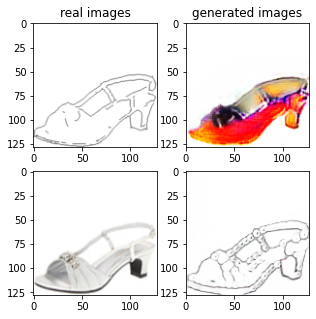

Train Epoch: 2 28% 	Total Loss: 1.329265 	Loss_G_AB: 0.377408	Loss_G_BA: 0.966348	Loss_cycle: 0.445620	Loss_D_A: 0.012850	Loss_D_B: 0.198917
1 64009 T:  2.2868082523345947
Train Epoch: 2 28% 	Total Loss: 1.360800 	Loss_G_AB: 0.310487	Loss_G_BA: 0.920544	Loss_cycle: 0.463205	Loss_D_A: 0.015501	Loss_D_B: 0.266578
1 64019 T:  0.6735455989837646
Train Epoch: 2 29% 	Total Loss: 1.466751 	Loss_G_AB: 0.294988	Loss_G_BA: 1.016529	Loss_cycle: 0.486009	Loss_D_A: 0.018894	Loss_D_B: 0.306089
1 64029 T:  0.6802175045013428
Train Epoch: 2 29% 	Total Loss: 1.396234 	Loss_G_AB: 0.262127	Loss_G_BA: 0.957045	Loss_cycle: 0.489943	Loss_D_A: 0.015521	Loss_D_B: 0.281185
1 64039 T:  0.6794562339782715
Train Epoch: 2 29% 	Total Loss: 1.202770 	Loss_G_AB: 0.288728	Loss_G_BA: 0.950280	Loss_cycle: 0.310046	Loss_D_A: 0.030588	Loss_D_B: 0.242632
1 64049 T:  0.6720120906829834
Train Epoch: 2 29% 	Total Loss: 1.213238 	Loss_G_AB: 0.283931	Loss_G_BA: 0.983118	Loss_cycle: 0.330406	Loss_D_A: 0.004181	Loss_D_B: 0.245127

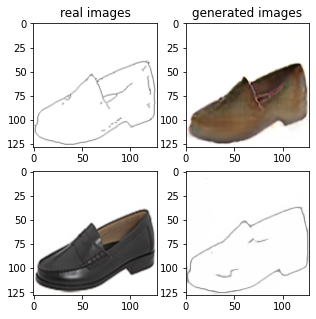

Train Epoch: 2 30% 	Total Loss: 1.335963 	Loss_G_AB: 0.258999	Loss_G_BA: 1.012734	Loss_cycle: 0.402599	Loss_D_A: 0.005081	Loss_D_B: 0.292417
1 65009 T:  1.48331880569458
Train Epoch: 2 30% 	Total Loss: 1.166695 	Loss_G_AB: 0.350813	Loss_G_BA: 0.970054	Loss_cycle: 0.322215	Loss_D_A: 0.005392	Loss_D_B: 0.178654
1 65019 T:  0.7007474899291992
Train Epoch: 2 31% 	Total Loss: 1.328362 	Loss_G_AB: 0.330802	Loss_G_BA: 1.018696	Loss_cycle: 0.403431	Loss_D_A: 0.003471	Loss_D_B: 0.246710
1 65029 T:  0.6950974464416504
Train Epoch: 2 31% 	Total Loss: 1.409392 	Loss_G_AB: 0.300707	Loss_G_BA: 0.996804	Loss_cycle: 0.510839	Loss_D_A: 0.002001	Loss_D_B: 0.247796
1 65039 T:  0.6922273635864258
Train Epoch: 2 31% 	Total Loss: 1.214861 	Loss_G_AB: 0.336675	Loss_G_BA: 1.006436	Loss_cycle: 0.309142	Loss_D_A: 0.002168	Loss_D_B: 0.231995
1 65049 T:  0.6900508403778076
Train Epoch: 2 31% 	Total Loss: 1.276462 	Loss_G_AB: 0.274670	Loss_G_BA: 0.983403	Loss_cycle: 0.380984	Loss_D_A: 0.010207	Loss_D_B: 0.256235
1

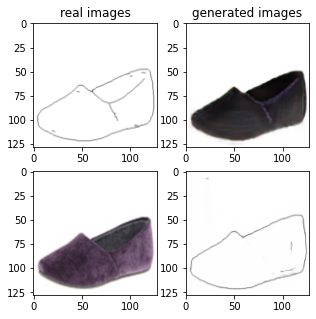

Train Epoch: 2 32% 	Total Loss: 1.289930 	Loss_G_AB: 0.290597	Loss_G_BA: 1.000748	Loss_cycle: 0.398280	Loss_D_A: 0.002284	Loss_D_B: 0.243694
1 66009 T:  1.3983707427978516
Train Epoch: 2 33% 	Total Loss: 1.329063 	Loss_G_AB: 0.283604	Loss_G_BA: 1.006769	Loss_cycle: 0.414341	Loss_D_A: 0.002300	Loss_D_B: 0.267236
1 66019 T:  0.6856791973114014
Train Epoch: 2 33% 	Total Loss: 1.290707 	Loss_G_AB: 0.274725	Loss_G_BA: 1.009052	Loss_cycle: 0.391958	Loss_D_A: 0.002944	Loss_D_B: 0.253917
1 66029 T:  0.6802139282226562
Train Epoch: 2 33% 	Total Loss: 1.339631 	Loss_G_AB: 0.312257	Loss_G_BA: 1.002878	Loss_cycle: 0.449346	Loss_D_A: 0.001569	Loss_D_B: 0.231149
1 66039 T:  0.6665091514587402
Train Epoch: 2 33% 	Total Loss: 1.213750 	Loss_G_AB: 0.316256	Loss_G_BA: 0.997593	Loss_cycle: 0.320873	Loss_D_A: 0.002482	Loss_D_B: 0.233471
1 66049 T:  0.6818716526031494
Train Epoch: 2 33% 	Total Loss: 1.307240 	Loss_G_AB: 0.273740	Loss_G_BA: 0.993370	Loss_cycle: 0.424213	Loss_D_A: 0.002138	Loss_D_B: 0.247334

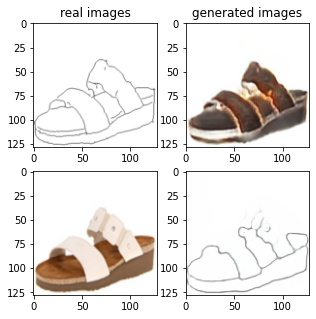

Train Epoch: 2 34% 	Total Loss: 1.289855 	Loss_G_AB: 0.342610	Loss_G_BA: 0.989799	Loss_cycle: 0.392756	Loss_D_A: 0.004675	Loss_D_B: 0.226219
1 67009 T:  1.4031462669372559
Train Epoch: 2 35% 	Total Loss: 1.358274 	Loss_G_AB: 0.301916	Loss_G_BA: 1.002780	Loss_cycle: 0.453591	Loss_D_A: 0.005066	Loss_D_B: 0.247268
1 67019 T:  0.6725566387176514
Train Epoch: 2 35% 	Total Loss: 1.315581 	Loss_G_AB: 0.313598	Loss_G_BA: 1.005695	Loss_cycle: 0.412281	Loss_D_A: 0.005659	Loss_D_B: 0.237994
1 67029 T:  0.6683728694915771
Train Epoch: 2 35% 	Total Loss: 1.375633 	Loss_G_AB: 0.332540	Loss_G_BA: 0.997312	Loss_cycle: 0.491728	Loss_D_A: 0.003225	Loss_D_B: 0.215755
1 67039 T:  0.6601190567016602
Train Epoch: 2 35% 	Total Loss: 1.269496 	Loss_G_AB: 0.309159	Loss_G_BA: 0.994732	Loss_cycle: 0.360032	Loss_D_A: 0.003561	Loss_D_B: 0.253957
1 67049 T:  0.6855955123901367
Train Epoch: 2 35% 	Total Loss: 1.297277 	Loss_G_AB: 0.292990	Loss_G_BA: 0.998049	Loss_cycle: 0.388566	Loss_D_A: 0.003471	Loss_D_B: 0.259721

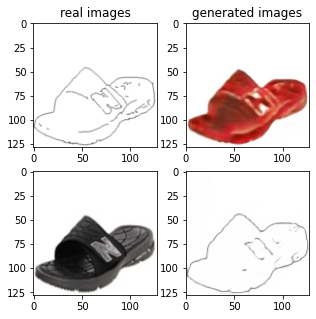

Train Epoch: 2 36% 	Total Loss: 1.324385 	Loss_G_AB: 0.314079	Loss_G_BA: 1.050036	Loss_cycle: 0.389686	Loss_D_A: 0.027916	Loss_D_B: 0.224726
1 68009 T:  1.4659371376037598
Train Epoch: 2 37% 	Total Loss: 1.291045 	Loss_G_AB: 0.342783	Loss_G_BA: 0.958780	Loss_cycle: 0.389563	Loss_D_A: 0.020356	Loss_D_B: 0.230344
1 68019 T:  0.6756370067596436
Train Epoch: 2 37% 	Total Loss: 1.434131 	Loss_G_AB: 0.329764	Loss_G_BA: 1.008527	Loss_cycle: 0.536178	Loss_D_A: 0.003200	Loss_D_B: 0.225607
1 68029 T:  0.6706588268280029
Train Epoch: 2 37% 	Total Loss: 1.354814 	Loss_G_AB: 0.366208	Loss_G_BA: 0.997509	Loss_cycle: 0.468149	Loss_D_A: 0.002608	Loss_D_B: 0.202199
1 68039 T:  0.6923656463623047
Train Epoch: 2 37% 	Total Loss: 1.340141 	Loss_G_AB: 0.289923	Loss_G_BA: 0.997429	Loss_cycle: 0.426536	Loss_D_A: 0.003095	Loss_D_B: 0.266835
1 68049 T:  0.6651420593261719
Train Epoch: 2 37% 	Total Loss: 1.288708 	Loss_G_AB: 0.307396	Loss_G_BA: 0.978779	Loss_cycle: 0.416917	Loss_D_A: 0.002994	Loss_D_B: 0.225710

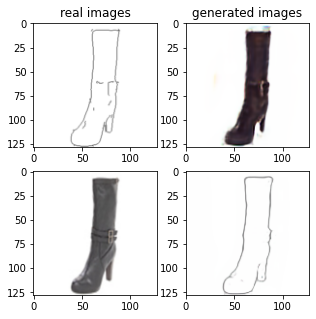

Train Epoch: 2 39% 	Total Loss: 1.308565 	Loss_G_AB: 0.362758	Loss_G_BA: 1.000063	Loss_cycle: 0.388988	Loss_D_A: 0.002365	Loss_D_B: 0.235801
1 69009 T:  1.4540374279022217
Train Epoch: 2 39% 	Total Loss: 1.166579 	Loss_G_AB: 0.303460	Loss_G_BA: 0.996941	Loss_cycle: 0.273407	Loss_D_A: 0.003364	Loss_D_B: 0.239608
1 69019 T:  0.7120883464813232
Train Epoch: 2 39% 	Total Loss: 1.338970 	Loss_G_AB: 0.320347	Loss_G_BA: 1.009883	Loss_cycle: 0.439249	Loss_D_A: 0.002589	Loss_D_B: 0.232017
1 69029 T:  0.6807677745819092
Train Epoch: 2 39% 	Total Loss: 1.266358 	Loss_G_AB: 0.278107	Loss_G_BA: 0.999711	Loss_cycle: 0.379870	Loss_D_A: 0.002056	Loss_D_B: 0.245522
1 69039 T:  0.690671443939209
Train Epoch: 2 39% 	Total Loss: 1.335684 	Loss_G_AB: 0.285204	Loss_G_BA: 0.994161	Loss_cycle: 0.450613	Loss_D_A: 0.002494	Loss_D_B: 0.242894
1 69049 T:  0.6828200817108154
Train Epoch: 2 39% 	Total Loss: 1.273660 	Loss_G_AB: 0.295692	Loss_G_BA: 0.986786	Loss_cycle: 0.392509	Loss_D_A: 0.001780	Loss_D_B: 0.238132


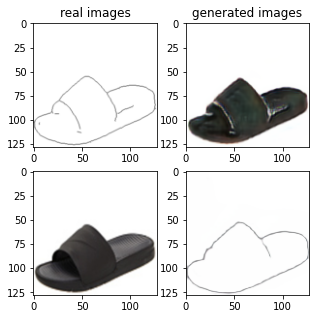

Train Epoch: 2 41% 	Total Loss: 1.204223 	Loss_G_AB: 0.264727	Loss_G_BA: 1.007588	Loss_cycle: 0.305425	Loss_D_A: 0.002160	Loss_D_B: 0.260480
1 70009 T:  1.3907709121704102
Train Epoch: 2 41% 	Total Loss: 1.273687 	Loss_G_AB: 0.319677	Loss_G_BA: 0.990499	Loss_cycle: 0.377119	Loss_D_A: 0.002482	Loss_D_B: 0.238998
1 70019 T:  0.6680285930633545
Train Epoch: 2 41% 	Total Loss: 1.413091 	Loss_G_AB: 0.331324	Loss_G_BA: 1.006329	Loss_cycle: 0.526654	Loss_D_A: 0.002041	Loss_D_B: 0.215569
1 70029 T:  0.6560103893280029
Train Epoch: 2 41% 	Total Loss: 1.237034 	Loss_G_AB: 0.293581	Loss_G_BA: 0.985246	Loss_cycle: 0.368563	Loss_D_A: 0.003559	Loss_D_B: 0.225499
1 70039 T:  0.6652023792266846
Train Epoch: 2 41% 	Total Loss: 1.241941 	Loss_G_AB: 0.484285	Loss_G_BA: 1.001491	Loss_cycle: 0.343287	Loss_D_A: 0.001773	Loss_D_B: 0.153993
1 70049 T:  0.6587979793548584
Train Epoch: 2 41% 	Total Loss: 1.439163 	Loss_G_AB: 0.344347	Loss_G_BA: 0.993302	Loss_cycle: 0.456244	Loss_D_A: 0.002504	Loss_D_B: 0.311590

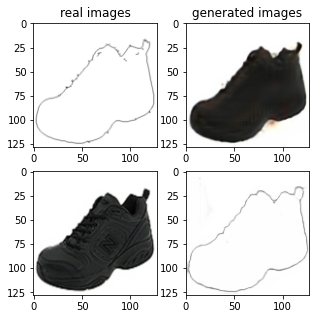

Train Epoch: 2 43% 	Total Loss: 1.311327 	Loss_G_AB: 0.283758	Loss_G_BA: 0.982791	Loss_cycle: 0.411277	Loss_D_A: 0.004614	Loss_D_B: 0.262161
1 71009 T:  1.4292032718658447
Train Epoch: 2 43% 	Total Loss: 1.250788 	Loss_G_AB: 0.321428	Loss_G_BA: 0.995608	Loss_cycle: 0.344035	Loss_D_A: 0.003688	Loss_D_B: 0.244547
1 71019 T:  0.6632447242736816
Train Epoch: 2 43% 	Total Loss: 1.380265 	Loss_G_AB: 0.319047	Loss_G_BA: 0.995411	Loss_cycle: 0.492467	Loss_D_A: 0.003292	Loss_D_B: 0.227278
1 71029 T:  0.6750621795654297
Train Epoch: 2 43% 	Total Loss: 1.208948 	Loss_G_AB: 0.274119	Loss_G_BA: 1.003767	Loss_cycle: 0.310554	Loss_D_A: 0.002505	Loss_D_B: 0.256946
1 71039 T:  0.6621947288513184
Train Epoch: 2 43% 	Total Loss: 1.332846 	Loss_G_AB: 0.293659	Loss_G_BA: 0.986884	Loss_cycle: 0.455109	Loss_D_A: 0.002350	Loss_D_B: 0.235115
1 71049 T:  0.6689839363098145
Train Epoch: 2 43% 	Total Loss: 1.352709 	Loss_G_AB: 0.320343	Loss_G_BA: 1.001659	Loss_cycle: 0.409490	Loss_D_A: 0.002799	Loss_D_B: 0.279419

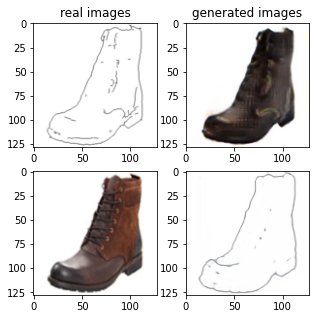

Train Epoch: 2 45% 	Total Loss: 1.280978 	Loss_G_AB: 0.318924	Loss_G_BA: 1.010688	Loss_cycle: 0.369691	Loss_D_A: 0.002154	Loss_D_B: 0.244327
1 72009 T:  1.3885347843170166
Train Epoch: 2 45% 	Total Loss: 1.181436 	Loss_G_AB: 0.264904	Loss_G_BA: 0.993361	Loss_cycle: 0.300437	Loss_D_A: 0.003063	Loss_D_B: 0.248804
1 72019 T:  0.6602301597595215
Train Epoch: 2 45% 	Total Loss: 1.213680 	Loss_G_AB: 0.333519	Loss_G_BA: 1.009670	Loss_cycle: 0.285018	Loss_D_A: 0.001856	Loss_D_B: 0.255212
1 72029 T:  0.6679418087005615
Train Epoch: 2 45% 	Total Loss: 1.266257 	Loss_G_AB: 0.311372	Loss_G_BA: 0.992112	Loss_cycle: 0.380945	Loss_D_A: 0.001479	Loss_D_B: 0.232091
1 72039 T:  0.6559748649597168
Train Epoch: 2 45% 	Total Loss: 1.278860 	Loss_G_AB: 0.287088	Loss_G_BA: 0.999001	Loss_cycle: 0.377422	Loss_D_A: 0.001517	Loss_D_B: 0.256875
1 72049 T:  0.6692607402801514
Train Epoch: 2 45% 	Total Loss: 1.303564 	Loss_G_AB: 0.290030	Loss_G_BA: 0.998768	Loss_cycle: 0.418470	Loss_D_A: 0.001312	Loss_D_B: 0.239383

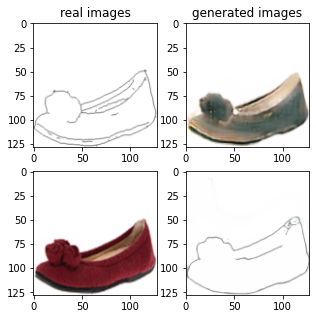

Train Epoch: 2 47% 	Total Loss: 1.384055 	Loss_G_AB: 0.300879	Loss_G_BA: 0.951051	Loss_cycle: 0.497216	Loss_D_A: 0.011793	Loss_D_B: 0.249081
1 73009 T:  1.3654656410217285
Train Epoch: 2 47% 	Total Loss: 1.445431 	Loss_G_AB: 0.356092	Loss_G_BA: 0.967343	Loss_cycle: 0.557029	Loss_D_A: 0.032519	Loss_D_B: 0.194166
1 73019 T:  0.6572380065917969
Train Epoch: 2 47% 	Total Loss: 1.216723 	Loss_G_AB: 0.283819	Loss_G_BA: 0.993139	Loss_cycle: 0.316149	Loss_D_A: 0.007153	Loss_D_B: 0.254941
1 73029 T:  0.6735489368438721
Train Epoch: 2 47% 	Total Loss: 1.296370 	Loss_G_AB: 0.314217	Loss_G_BA: 0.939846	Loss_cycle: 0.414467	Loss_D_A: 0.006922	Loss_D_B: 0.247951
1 73039 T:  0.6479594707489014
Train Epoch: 2 47% 	Total Loss: 1.227422 	Loss_G_AB: 0.313920	Loss_G_BA: 0.913414	Loss_cycle: 0.366788	Loss_D_A: 0.020381	Loss_D_B: 0.226587
1 73049 T:  0.6504979133605957
Train Epoch: 2 47% 	Total Loss: 1.267361 	Loss_G_AB: 0.331790	Loss_G_BA: 0.978117	Loss_cycle: 0.367672	Loss_D_A: 0.019265	Loss_D_B: 0.225470

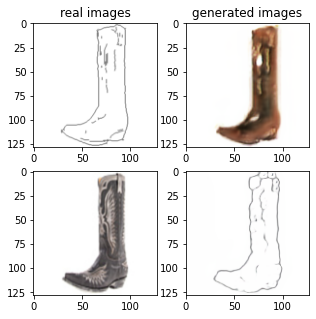

Train Epoch: 2 49% 	Total Loss: 1.288115 	Loss_G_AB: 0.318991	Loss_G_BA: 1.015117	Loss_cycle: 0.391504	Loss_D_A: 0.001596	Loss_D_B: 0.227961
1 74009 T:  1.4332611560821533
Train Epoch: 2 49% 	Total Loss: 1.311062 	Loss_G_AB: 0.284586	Loss_G_BA: 0.989863	Loss_cycle: 0.394883	Loss_D_A: 0.002248	Loss_D_B: 0.276707
1 74019 T:  0.6403124332427979
Train Epoch: 2 49% 	Total Loss: 1.238332 	Loss_G_AB: 0.340630	Loss_G_BA: 0.996779	Loss_cycle: 0.365936	Loss_D_A: 0.001819	Loss_D_B: 0.201873
1 74029 T:  0.6425344944000244
Train Epoch: 2 49% 	Total Loss: 1.340053 	Loss_G_AB: 0.318648	Loss_G_BA: 0.983295	Loss_cycle: 0.468077	Loss_D_A: 0.001634	Loss_D_B: 0.219371
1 74039 T:  0.6399936676025391
Train Epoch: 2 49% 	Total Loss: 1.462582 	Loss_G_AB: 0.400817	Loss_G_BA: 1.007548	Loss_cycle: 0.515719	Loss_D_A: 0.002095	Loss_D_B: 0.240586
1 74049 T:  0.6563599109649658
Train Epoch: 2 49% 	Total Loss: 1.335729 	Loss_G_AB: 0.317197	Loss_G_BA: 1.006552	Loss_cycle: 0.412001	Loss_D_A: 0.001570	Loss_D_B: 0.260283

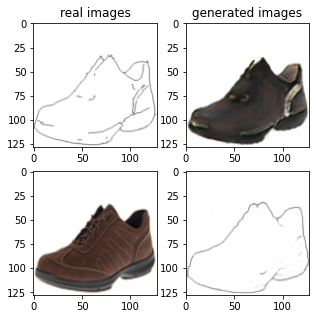

Train Epoch: 2 51% 	Total Loss: 1.236946 	Loss_G_AB: 0.304513	Loss_G_BA: 0.996644	Loss_cycle: 0.335603	Loss_D_A: 0.001425	Loss_D_B: 0.249340
1 75009 T:  1.8137359619140625
Train Epoch: 2 51% 	Total Loss: 1.220888 	Loss_G_AB: 0.295329	Loss_G_BA: 0.998570	Loss_cycle: 0.335572	Loss_D_A: 0.001281	Loss_D_B: 0.237086
1 75019 T:  0.6468255519866943
Train Epoch: 2 51% 	Total Loss: 1.313559 	Loss_G_AB: 0.300868	Loss_G_BA: 0.997841	Loss_cycle: 0.434016	Loss_D_A: 0.001458	Loss_D_B: 0.228731
1 75029 T:  0.6462893486022949
Train Epoch: 2 51% 	Total Loss: 1.311717 	Loss_G_AB: 0.309215	Loss_G_BA: 1.001411	Loss_cycle: 0.417269	Loss_D_A: 0.001999	Loss_D_B: 0.237135
1 75039 T:  0.6500694751739502
Train Epoch: 2 51% 	Total Loss: 1.269616 	Loss_G_AB: 0.321239	Loss_G_BA: 1.004581	Loss_cycle: 0.367518	Loss_D_A: 0.001927	Loss_D_B: 0.237260
1 75049 T:  0.6513233184814453
Train Epoch: 2 51% 	Total Loss: 1.281101 	Loss_G_AB: 0.284775	Loss_G_BA: 1.002251	Loss_cycle: 0.376280	Loss_D_A: 0.001591	Loss_D_B: 0.259717

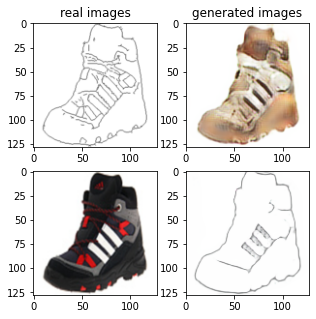

Train Epoch: 2 53% 	Total Loss: 1.239327 	Loss_G_AB: 0.308838	Loss_G_BA: 0.944777	Loss_cycle: 0.363559	Loss_D_A: 0.018310	Loss_D_B: 0.230650
1 76009 T:  1.3714690208435059
Train Epoch: 2 53% 	Total Loss: 1.396524 	Loss_G_AB: 0.273067	Loss_G_BA: 1.049543	Loss_cycle: 0.470679	Loss_D_A: 0.010918	Loss_D_B: 0.253621
1 76019 T:  0.6477041244506836
Train Epoch: 2 53% 	Total Loss: 1.175860 	Loss_G_AB: 0.290176	Loss_G_BA: 0.904233	Loss_cycle: 0.303146	Loss_D_A: 0.039724	Loss_D_B: 0.235786
1 76029 T:  0.6490297317504883
Train Epoch: 2 53% 	Total Loss: 1.430155 	Loss_G_AB: 0.334244	Loss_G_BA: 0.890300	Loss_cycle: 0.481042	Loss_D_A: 0.098439	Loss_D_B: 0.238402
1 76039 T:  0.6527361869812012
Train Epoch: 2 53% 	Total Loss: 1.337164 	Loss_G_AB: 0.313672	Loss_G_BA: 1.016408	Loss_cycle: 0.412491	Loss_D_A: 0.025510	Loss_D_B: 0.234124
1 76049 T:  0.6359415054321289
Train Epoch: 2 53% 	Total Loss: 1.364801 	Loss_G_AB: 0.338940	Loss_G_BA: 0.990997	Loss_cycle: 0.470809	Loss_D_A: 0.003922	Loss_D_B: 0.225101

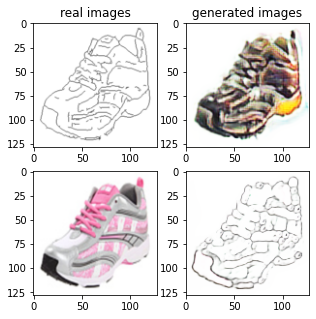

Train Epoch: 2 55% 	Total Loss: 1.385176 	Loss_G_AB: 0.297924	Loss_G_BA: 1.003164	Loss_cycle: 0.490456	Loss_D_A: 0.001965	Loss_D_B: 0.242212
1 77009 T:  1.3861536979675293
Train Epoch: 2 55% 	Total Loss: 1.287254 	Loss_G_AB: 0.292545	Loss_G_BA: 0.988776	Loss_cycle: 0.384602	Loss_D_A: 0.002893	Loss_D_B: 0.259098
1 77019 T:  0.651054859161377
Train Epoch: 2 55% 	Total Loss: 1.357811 	Loss_G_AB: 0.337685	Loss_G_BA: 1.014970	Loss_cycle: 0.474059	Loss_D_A: 0.003483	Loss_D_B: 0.203940
1 77029 T:  0.6484169960021973
Train Epoch: 2 55% 	Total Loss: 1.218006 	Loss_G_AB: 0.313099	Loss_G_BA: 1.003484	Loss_cycle: 0.330173	Loss_D_A: 0.003649	Loss_D_B: 0.225892
1 77039 T:  0.6658711433410645
Train Epoch: 2 55% 	Total Loss: 1.199065 	Loss_G_AB: 0.267668	Loss_G_BA: 0.981082	Loss_cycle: 0.302671	Loss_D_A: 0.002321	Loss_D_B: 0.269697
1 77049 T:  0.6844000816345215
Train Epoch: 2 55% 	Total Loss: 1.285038 	Loss_G_AB: 0.318449	Loss_G_BA: 1.002800	Loss_cycle: 0.387834	Loss_D_A: 0.003908	Loss_D_B: 0.232672


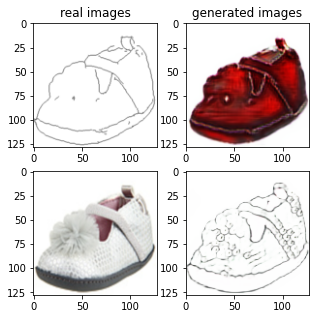

Train Epoch: 2 57% 	Total Loss: 1.223695 	Loss_G_AB: 0.327123	Loss_G_BA: 0.963042	Loss_cycle: 0.326362	Loss_D_A: 0.011755	Loss_D_B: 0.240496
1 78009 T:  1.3653769493103027
Train Epoch: 2 57% 	Total Loss: 1.285003 	Loss_G_AB: 0.282625	Loss_G_BA: 0.946956	Loss_cycle: 0.351731	Loss_D_A: 0.053294	Loss_D_B: 0.265187
1 78019 T:  0.6578822135925293
Train Epoch: 2 57% 	Total Loss: 1.238526 	Loss_G_AB: 0.306841	Loss_G_BA: 0.906334	Loss_cycle: 0.340067	Loss_D_A: 0.048687	Loss_D_B: 0.243185
1 78029 T:  0.6365509033203125
Train Epoch: 2 57% 	Total Loss: 1.294638 	Loss_G_AB: 0.307052	Loss_G_BA: 0.972081	Loss_cycle: 0.408345	Loss_D_A: 0.010557	Loss_D_B: 0.236170
1 78039 T:  0.6467370986938477
Train Epoch: 2 57% 	Total Loss: 1.312225 	Loss_G_AB: 0.283398	Loss_G_BA: 0.904900	Loss_cycle: 0.331561	Loss_D_A: 0.143640	Loss_D_B: 0.242875
1 78049 T:  0.6666936874389648
Train Epoch: 2 57% 	Total Loss: 1.303276 	Loss_G_AB: 0.351372	Loss_G_BA: 0.998000	Loss_cycle: 0.365667	Loss_D_A: 0.035610	Loss_D_B: 0.227314

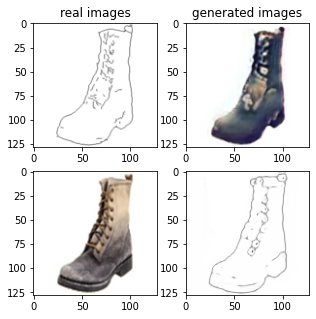

Train Epoch: 2 59% 	Total Loss: 1.242500 	Loss_G_AB: 0.293711	Loss_G_BA: 0.917334	Loss_cycle: 0.380381	Loss_D_A: 0.020163	Loss_D_B: 0.236434
1 79009 T:  1.348407506942749
Train Epoch: 2 59% 	Total Loss: 1.234844 	Loss_G_AB: 0.287040	Loss_G_BA: 0.924020	Loss_cycle: 0.337520	Loss_D_A: 0.053609	Loss_D_B: 0.238184
1 79019 T:  0.6458311080932617
Train Epoch: 2 59% 	Total Loss: 1.235752 	Loss_G_AB: 0.292363	Loss_G_BA: 0.973018	Loss_cycle: 0.336975	Loss_D_A: 0.020157	Loss_D_B: 0.245930
1 79029 T:  0.6630499362945557
Train Epoch: 2 59% 	Total Loss: 1.153358 	Loss_G_AB: 0.288937	Loss_G_BA: 0.862939	Loss_cycle: 0.286609	Loss_D_A: 0.044881	Loss_D_B: 0.245930
1 79039 T:  0.6546955108642578
Train Epoch: 2 59% 	Total Loss: 1.280683 	Loss_G_AB: 0.272204	Loss_G_BA: 0.968659	Loss_cycle: 0.377582	Loss_D_A: 0.032294	Loss_D_B: 0.250376
1 79049 T:  0.6687569618225098
Train Epoch: 2 59% 	Total Loss: 1.200114 	Loss_G_AB: 0.302437	Loss_G_BA: 0.898854	Loss_cycle: 0.317821	Loss_D_A: 0.034148	Loss_D_B: 0.247499


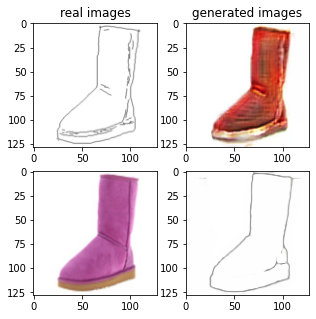

Train Epoch: 2 61% 	Total Loss: 1.313361 	Loss_G_AB: 0.312485	Loss_G_BA: 1.002733	Loss_cycle: 0.402876	Loss_D_A: 0.003275	Loss_D_B: 0.249601
1 80009 T:  2.2788074016571045
Train Epoch: 2 61% 	Total Loss: 1.295745 	Loss_G_AB: 0.247946	Loss_G_BA: 0.995282	Loss_cycle: 0.383971	Loss_D_A: 0.008693	Loss_D_B: 0.281468
1 80019 T:  0.6434340476989746
Train Epoch: 2 61% 	Total Loss: 1.331353 	Loss_G_AB: 0.413812	Loss_G_BA: 0.964221	Loss_cycle: 0.374045	Loss_D_A: 0.009761	Loss_D_B: 0.258530
1 80029 T:  0.655005931854248
Train Epoch: 2 61% 	Total Loss: 1.257559 	Loss_G_AB: 0.284907	Loss_G_BA: 0.953259	Loss_cycle: 0.362598	Loss_D_A: 0.009267	Loss_D_B: 0.266611
1 80039 T:  0.6570630073547363
Train Epoch: 2 61% 	Total Loss: 1.221491 	Loss_G_AB: 0.283390	Loss_G_BA: 1.029506	Loss_cycle: 0.319462	Loss_D_A: 0.012113	Loss_D_B: 0.233468
1 80049 T:  0.6402974128723145
Train Epoch: 2 61% 	Total Loss: 1.310085 	Loss_G_AB: 0.328240	Loss_G_BA: 1.003454	Loss_cycle: 0.410546	Loss_D_A: 0.004524	Loss_D_B: 0.229168


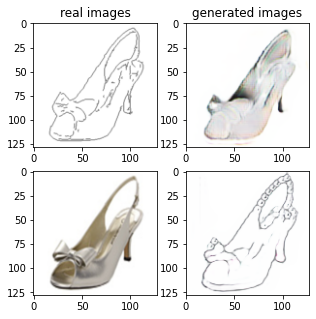

Train Epoch: 2 63% 	Total Loss: 1.298982 	Loss_G_AB: 0.292778	Loss_G_BA: 0.982736	Loss_cycle: 0.418387	Loss_D_A: 0.004308	Loss_D_B: 0.238530
1 81009 T:  1.3630492687225342
Train Epoch: 2 63% 	Total Loss: 1.161842 	Loss_G_AB: 0.287489	Loss_G_BA: 0.958120	Loss_cycle: 0.285408	Loss_D_A: 0.008796	Loss_D_B: 0.244834
1 81019 T:  0.6443493366241455
Train Epoch: 2 63% 	Total Loss: 1.181713 	Loss_G_AB: 0.305987	Loss_G_BA: 0.996870	Loss_cycle: 0.301269	Loss_D_A: 0.007530	Loss_D_B: 0.221485
1 81029 T:  0.649911642074585
Train Epoch: 2 63% 	Total Loss: 1.340453 	Loss_G_AB: 0.247989	Loss_G_BA: 1.021944	Loss_cycle: 0.421362	Loss_D_A: 0.003547	Loss_D_B: 0.280577
1 81039 T:  0.6361124515533447
Train Epoch: 2 63% 	Total Loss: 1.307878 	Loss_G_AB: 0.263770	Loss_G_BA: 0.994812	Loss_cycle: 0.409267	Loss_D_A: 0.002892	Loss_D_B: 0.266428
1 81049 T:  0.6434361934661865
Train Epoch: 2 63% 	Total Loss: 1.240592 	Loss_G_AB: 0.323830	Loss_G_BA: 1.009619	Loss_cycle: 0.304393	Loss_D_A: 0.002236	Loss_D_B: 0.267239


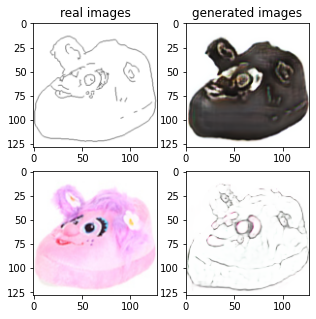

Train Epoch: 2 65% 	Total Loss: 1.314365 	Loss_G_AB: 0.346900	Loss_G_BA: 0.996221	Loss_cycle: 0.413688	Loss_D_A: 0.001908	Loss_D_B: 0.227208
1 82009 T:  1.4064357280731201
Train Epoch: 2 65% 	Total Loss: 1.272438 	Loss_G_AB: 0.326439	Loss_G_BA: 1.007724	Loss_cycle: 0.387152	Loss_D_A: 0.003018	Loss_D_B: 0.215186
1 82019 T:  0.658165693283081
Train Epoch: 2 65% 	Total Loss: 1.226996 	Loss_G_AB: 0.287694	Loss_G_BA: 0.988163	Loss_cycle: 0.331340	Loss_D_A: 0.001769	Loss_D_B: 0.255958
1 82029 T:  0.6748864650726318
Train Epoch: 2 65% 	Total Loss: 1.265556 	Loss_G_AB: 0.318834	Loss_G_BA: 0.993767	Loss_cycle: 0.358022	Loss_D_A: 0.002853	Loss_D_B: 0.248381
1 82039 T:  0.6706798076629639
Train Epoch: 2 65% 	Total Loss: 1.300325 	Loss_G_AB: 0.307665	Loss_G_BA: 1.013580	Loss_cycle: 0.382609	Loss_D_A: 0.002892	Loss_D_B: 0.254202
1 82049 T:  0.7458720207214355
Train Epoch: 2 65% 	Total Loss: 1.254878 	Loss_G_AB: 0.282919	Loss_G_BA: 0.983949	Loss_cycle: 0.349561	Loss_D_A: 0.006031	Loss_D_B: 0.265851


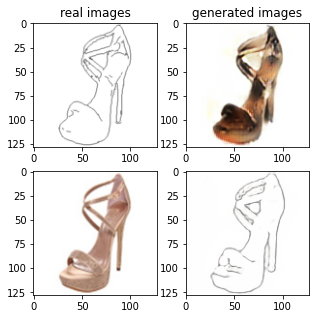

Train Epoch: 2 67% 	Total Loss: 1.224976 	Loss_G_AB: 0.284872	Loss_G_BA: 0.991211	Loss_cycle: 0.340900	Loss_D_A: 0.001890	Loss_D_B: 0.244145
1 83009 T:  1.4218981266021729
Train Epoch: 2 67% 	Total Loss: 1.131008 	Loss_G_AB: 0.292524	Loss_G_BA: 0.970625	Loss_cycle: 0.254589	Loss_D_A: 0.011304	Loss_D_B: 0.233541
1 83019 T:  0.6549863815307617
Train Epoch: 2 67% 	Total Loss: 1.264655 	Loss_G_AB: 0.301889	Loss_G_BA: 0.994838	Loss_cycle: 0.379489	Loss_D_A: 0.004972	Loss_D_B: 0.231830
1 83029 T:  0.6505038738250732
Train Epoch: 2 67% 	Total Loss: 1.447231 	Loss_G_AB: 0.305783	Loss_G_BA: 1.005177	Loss_cycle: 0.516653	Loss_D_A: 0.001965	Loss_D_B: 0.273133
1 83039 T:  0.6718709468841553
Train Epoch: 2 67% 	Total Loss: 1.354275 	Loss_G_AB: 0.372006	Loss_G_BA: 0.999191	Loss_cycle: 0.423751	Loss_D_A: 0.002882	Loss_D_B: 0.242043
1 83049 T:  0.6828925609588623
Train Epoch: 2 67% 	Total Loss: 1.267621 	Loss_G_AB: 0.283701	Loss_G_BA: 0.975010	Loss_cycle: 0.402971	Loss_D_A: 0.002197	Loss_D_B: 0.233098

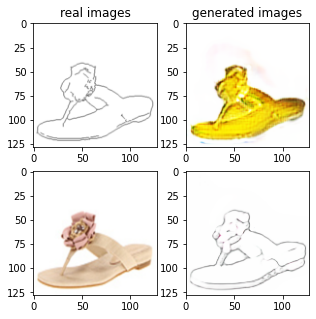

Train Epoch: 2 69% 	Total Loss: 1.308405 	Loss_G_AB: 0.366490	Loss_G_BA: 1.003289	Loss_cycle: 0.391597	Loss_D_A: 0.002276	Loss_D_B: 0.229643
1 84009 T:  1.366762399673462
Train Epoch: 2 69% 	Total Loss: 1.424637 	Loss_G_AB: 0.330253	Loss_G_BA: 0.994663	Loss_cycle: 0.491805	Loss_D_A: 0.001279	Loss_D_B: 0.269095
1 84019 T:  0.6433689594268799
Train Epoch: 2 69% 	Total Loss: 1.159932 	Loss_G_AB: 0.303504	Loss_G_BA: 0.999386	Loss_cycle: 0.276778	Loss_D_A: 0.001504	Loss_D_B: 0.230206
1 84029 T:  0.6313848495483398
Train Epoch: 2 69% 	Total Loss: 1.396207 	Loss_G_AB: 0.352928	Loss_G_BA: 1.008174	Loss_cycle: 0.497593	Loss_D_A: 0.001637	Loss_D_B: 0.216426
1 84039 T:  0.6483991146087646
Train Epoch: 2 69% 	Total Loss: 1.313997 	Loss_G_AB: 0.343709	Loss_G_BA: 0.996877	Loss_cycle: 0.424070	Loss_D_A: 0.001737	Loss_D_B: 0.217898
1 84049 T:  0.6661455631256104
Train Epoch: 2 69% 	Total Loss: 1.355491 	Loss_G_AB: 0.332817	Loss_G_BA: 1.000729	Loss_cycle: 0.474022	Loss_D_A: 0.002782	Loss_D_B: 0.211914


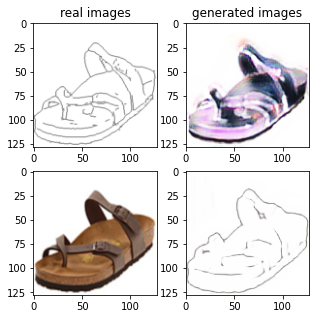

Train Epoch: 2 71% 	Total Loss: 1.184132 	Loss_G_AB: 0.269012	Loss_G_BA: 0.551370	Loss_cycle: 0.344875	Loss_D_A: 0.181119	Loss_D_B: 0.247946
1 85009 T:  1.338536024093628
Train Epoch: 2 71% 	Total Loss: 1.462461 	Loss_G_AB: 0.332715	Loss_G_BA: 0.756180	Loss_cycle: 0.510760	Loss_D_A: 0.163965	Loss_D_B: 0.243288
1 85019 T:  0.6430835723876953
Train Epoch: 2 71% 	Total Loss: 1.336226 	Loss_G_AB: 0.293719	Loss_G_BA: 0.719296	Loss_cycle: 0.341743	Loss_D_A: 0.238395	Loss_D_B: 0.249580
1 85029 T:  0.6360468864440918
Train Epoch: 2 71% 	Total Loss: 1.215706 	Loss_G_AB: 0.345582	Loss_G_BA: 0.646406	Loss_cycle: 0.372962	Loss_D_A: 0.112357	Loss_D_B: 0.234392
1 85039 T:  0.6461141109466553
Train Epoch: 2 71% 	Total Loss: 1.245923 	Loss_G_AB: 0.300003	Loss_G_BA: 0.756918	Loss_cycle: 0.359960	Loss_D_A: 0.117832	Loss_D_B: 0.239670
1 85049 T:  0.6563014984130859
Train Epoch: 2 71% 	Total Loss: 1.165627 	Loss_G_AB: 0.263463	Loss_G_BA: 0.620091	Loss_cycle: 0.290361	Loss_D_A: 0.179981	Loss_D_B: 0.253508


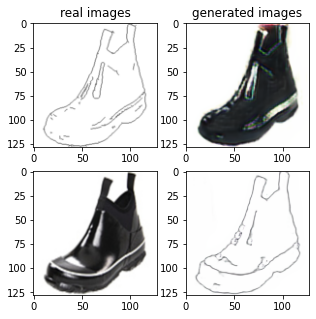

Train Epoch: 2 73% 	Total Loss: 1.251249 	Loss_G_AB: 0.322715	Loss_G_BA: 1.027013	Loss_cycle: 0.351085	Loss_D_A: 0.004405	Loss_D_B: 0.220895
1 86009 T:  1.4637303352355957
Train Epoch: 2 73% 	Total Loss: 1.284724 	Loss_G_AB: 0.349301	Loss_G_BA: 1.003136	Loss_cycle: 0.402857	Loss_D_A: 0.001767	Loss_D_B: 0.203882
1 86019 T:  0.6836297512054443
Train Epoch: 2 73% 	Total Loss: 1.343755 	Loss_G_AB: 0.347095	Loss_G_BA: 1.000621	Loss_cycle: 0.445565	Loss_D_A: 0.001018	Loss_D_B: 0.223314
1 86029 T:  0.6640806198120117
Train Epoch: 2 73% 	Total Loss: 1.269591 	Loss_G_AB: 0.317942	Loss_G_BA: 0.974423	Loss_cycle: 0.384973	Loss_D_A: 0.004999	Loss_D_B: 0.233436
1 86039 T:  0.6477680206298828
Train Epoch: 2 73% 	Total Loss: 1.316443 	Loss_G_AB: 0.251695	Loss_G_BA: 0.905338	Loss_cycle: 0.364418	Loss_D_A: 0.059366	Loss_D_B: 0.314143
1 86049 T:  0.657602071762085
Train Epoch: 2 73% 	Total Loss: 1.166739 	Loss_G_AB: 0.273253	Loss_G_BA: 0.859374	Loss_cycle: 0.296064	Loss_D_A: 0.057868	Loss_D_B: 0.246493


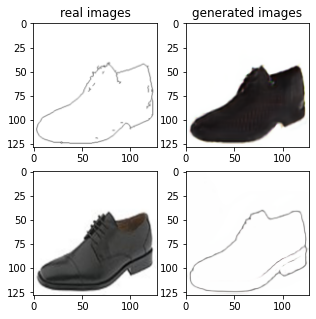

Train Epoch: 2 75% 	Total Loss: 1.173759 	Loss_G_AB: 0.286286	Loss_G_BA: 0.998801	Loss_cycle: 0.300135	Loss_D_A: 0.001818	Loss_D_B: 0.229263
1 87009 T:  1.344071626663208
Train Epoch: 2 75% 	Total Loss: 1.323541 	Loss_G_AB: 0.290884	Loss_G_BA: 0.996222	Loss_cycle: 0.395508	Loss_D_A: 0.002119	Loss_D_B: 0.282361
1 87019 T:  0.6348199844360352
Train Epoch: 2 75% 	Total Loss: 1.278995 	Loss_G_AB: 0.312796	Loss_G_BA: 1.009057	Loss_cycle: 0.388735	Loss_D_A: 0.001878	Loss_D_B: 0.227456
1 87029 T:  0.6458621025085449
Train Epoch: 2 75% 	Total Loss: 1.299836 	Loss_G_AB: 0.414340	Loss_G_BA: 0.984424	Loss_cycle: 0.397428	Loss_D_A: 0.001400	Loss_D_B: 0.201626
1 87039 T:  0.6462225914001465
Train Epoch: 2 75% 	Total Loss: 1.424407 	Loss_G_AB: 0.302442	Loss_G_BA: 1.013265	Loss_cycle: 0.466297	Loss_D_A: 0.003050	Loss_D_B: 0.297207
1 87049 T:  0.6492819786071777
Train Epoch: 2 75% 	Total Loss: 1.363912 	Loss_G_AB: 0.364026	Loss_G_BA: 0.995032	Loss_cycle: 0.440573	Loss_D_A: 0.003791	Loss_D_B: 0.240020


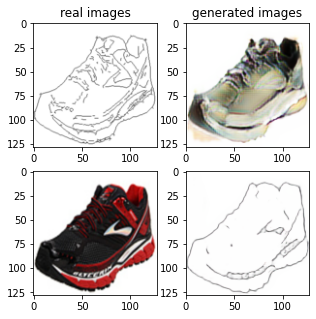

Train Epoch: 2 77% 	Total Loss: 1.300800 	Loss_G_AB: 0.321495	Loss_G_BA: 0.981437	Loss_cycle: 0.399049	Loss_D_A: 0.002313	Loss_D_B: 0.247972
1 88009 T:  1.3739376068115234
Train Epoch: 2 77% 	Total Loss: 1.359571 	Loss_G_AB: 0.356943	Loss_G_BA: 1.017702	Loss_cycle: 0.436139	Loss_D_A: 0.002657	Loss_D_B: 0.233452
1 88019 T:  0.6823570728302002
Train Epoch: 2 77% 	Total Loss: 1.323139 	Loss_G_AB: 0.325065	Loss_G_BA: 1.008431	Loss_cycle: 0.421712	Loss_D_A: 0.001288	Loss_D_B: 0.233391
1 88029 T:  0.6517171859741211
Train Epoch: 2 77% 	Total Loss: 1.282531 	Loss_G_AB: 0.356939	Loss_G_BA: 1.000982	Loss_cycle: 0.369859	Loss_D_A: 0.000982	Loss_D_B: 0.232729
1 88039 T:  0.6566498279571533
Train Epoch: 2 77% 	Total Loss: 1.284028 	Loss_G_AB: 0.334381	Loss_G_BA: 1.000200	Loss_cycle: 0.362808	Loss_D_A: 0.000778	Loss_D_B: 0.253151
1 88049 T:  0.6695983409881592
Train Epoch: 2 77% 	Total Loss: 1.293899 	Loss_G_AB: 0.273681	Loss_G_BA: 1.001378	Loss_cycle: 0.379668	Loss_D_A: 0.001288	Loss_D_B: 0.275413

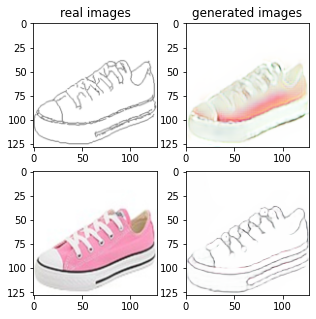

Train Epoch: 2 79% 	Total Loss: 1.241169 	Loss_G_AB: 0.282640	Loss_G_BA: 1.001247	Loss_cycle: 0.334744	Loss_D_A: 0.001845	Loss_D_B: 0.262637
1 89009 T:  1.3934030532836914
Train Epoch: 2 79% 	Total Loss: 1.268617 	Loss_G_AB: 0.299770	Loss_G_BA: 0.987949	Loss_cycle: 0.383848	Loss_D_A: 0.001967	Loss_D_B: 0.238944
1 89019 T:  0.6616849899291992
Train Epoch: 2 79% 	Total Loss: 1.241613 	Loss_G_AB: 0.358699	Loss_G_BA: 1.016313	Loss_cycle: 0.351789	Loss_D_A: 0.002068	Loss_D_B: 0.200250
1 89029 T:  0.6753926277160645
Train Epoch: 2 79% 	Total Loss: 1.281229 	Loss_G_AB: 0.265165	Loss_G_BA: 0.988031	Loss_cycle: 0.376738	Loss_D_A: 0.002105	Loss_D_B: 0.275788
1 89039 T:  0.6848115921020508
Train Epoch: 2 79% 	Total Loss: 1.132699 	Loss_G_AB: 0.289585	Loss_G_BA: 1.003918	Loss_cycle: 0.239969	Loss_D_A: 0.002595	Loss_D_B: 0.243384
1 89049 T:  0.6596415042877197
Train Epoch: 2 79% 	Total Loss: 1.260394 	Loss_G_AB: 0.308450	Loss_G_BA: 0.997098	Loss_cycle: 0.360848	Loss_D_A: 0.002596	Loss_D_B: 0.244176

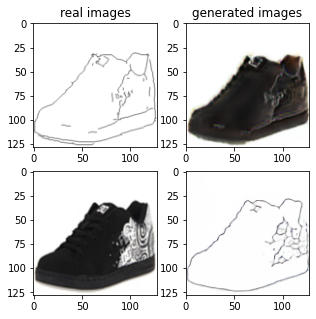

Train Epoch: 2 81% 	Total Loss: 1.268564 	Loss_G_AB: 0.302764	Loss_G_BA: 0.997066	Loss_cycle: 0.352667	Loss_D_A: 0.007174	Loss_D_B: 0.258808
1 90009 T:  1.4093725681304932
Train Epoch: 2 81% 	Total Loss: 1.350637 	Loss_G_AB: 0.298760	Loss_G_BA: 0.979120	Loss_cycle: 0.449154	Loss_D_A: 0.005487	Loss_D_B: 0.257056
1 90019 T:  0.6636853218078613
Train Epoch: 2 81% 	Total Loss: 1.359449 	Loss_G_AB: 0.354506	Loss_G_BA: 1.029396	Loss_cycle: 0.428544	Loss_D_A: 0.006687	Loss_D_B: 0.232266
1 90029 T:  0.6710531711578369
Train Epoch: 2 81% 	Total Loss: 1.161238 	Loss_G_AB: 0.283076	Loss_G_BA: 0.966856	Loss_cycle: 0.284139	Loss_D_A: 0.003550	Loss_D_B: 0.248583
1 90039 T:  0.6664767265319824
Train Epoch: 2 81% 	Total Loss: 1.234311 	Loss_G_AB: 0.257199	Loss_G_BA: 1.002981	Loss_cycle: 0.331708	Loss_D_A: 0.001818	Loss_D_B: 0.270695
1 90049 T:  0.6596848964691162
Train Epoch: 2 81% 	Total Loss: 1.203935 	Loss_G_AB: 0.262586	Loss_G_BA: 1.000393	Loss_cycle: 0.319922	Loss_D_A: 0.002136	Loss_D_B: 0.250387

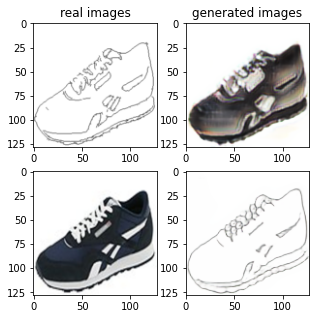

Train Epoch: 2 83% 	Total Loss: 1.220504 	Loss_G_AB: 0.294679	Loss_G_BA: 0.732433	Loss_cycle: 0.323479	Loss_D_A: 0.135356	Loss_D_B: 0.248112
1 91009 T:  1.8277678489685059
Train Epoch: 2 83% 	Total Loss: 1.232369 	Loss_G_AB: 0.311530	Loss_G_BA: 0.767584	Loss_cycle: 0.334972	Loss_D_A: 0.101289	Loss_D_B: 0.256551
1 91019 T:  0.6680150032043457
Train Epoch: 2 83% 	Total Loss: 1.280996 	Loss_G_AB: 0.284008	Loss_G_BA: 1.027608	Loss_cycle: 0.337208	Loss_D_A: 0.027179	Loss_D_B: 0.260801
1 91029 T:  0.6661982536315918
Train Epoch: 2 83% 	Total Loss: 1.193563 	Loss_G_AB: 0.263076	Loss_G_BA: 1.013189	Loss_cycle: 0.280149	Loss_D_A: 0.004046	Loss_D_B: 0.271235
1 91039 T:  0.6549553871154785
Train Epoch: 2 83% 	Total Loss: 1.251188 	Loss_G_AB: 0.326571	Loss_G_BA: 0.985103	Loss_cycle: 0.386997	Loss_D_A: 0.002595	Loss_D_B: 0.205759
1 91049 T:  0.6704747676849365
Train Epoch: 2 83% 	Total Loss: 1.245859 	Loss_G_AB: 0.285719	Loss_G_BA: 0.946894	Loss_cycle: 0.330834	Loss_D_A: 0.005224	Loss_D_B: 0.293493

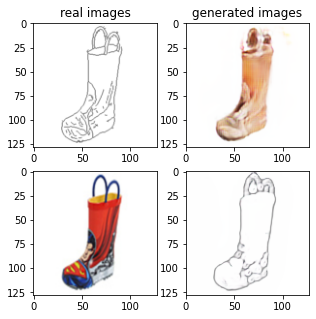

Train Epoch: 2 85% 	Total Loss: 1.362566 	Loss_G_AB: 0.312571	Loss_G_BA: 0.982937	Loss_cycle: 0.419396	Loss_D_A: 0.002059	Loss_D_B: 0.293358
1 92009 T:  1.472883701324463
Train Epoch: 2 85% 	Total Loss: 1.225377 	Loss_G_AB: 0.379138	Loss_G_BA: 0.992690	Loss_cycle: 0.349217	Loss_D_A: 0.001772	Loss_D_B: 0.188474
1 92019 T:  0.660635232925415
Train Epoch: 2 85% 	Total Loss: 1.273127 	Loss_G_AB: 0.286634	Loss_G_BA: 1.001028	Loss_cycle: 0.387450	Loss_D_A: 0.002360	Loss_D_B: 0.239486
1 92029 T:  0.6965596675872803
Train Epoch: 2 85% 	Total Loss: 1.411215 	Loss_G_AB: 0.339262	Loss_G_BA: 1.013280	Loss_cycle: 0.413951	Loss_D_A: 0.001711	Loss_D_B: 0.319282
1 92039 T:  0.6740434169769287
Train Epoch: 2 85% 	Total Loss: 1.170656 	Loss_G_AB: 0.282701	Loss_G_BA: 0.995288	Loss_cycle: 0.305228	Loss_D_A: 0.001490	Loss_D_B: 0.224943
1 92049 T:  0.6666655540466309
Train Epoch: 2 85% 	Total Loss: 1.250265 	Loss_G_AB: 0.289716	Loss_G_BA: 0.996524	Loss_cycle: 0.367425	Loss_D_A: 0.002388	Loss_D_B: 0.237331
1

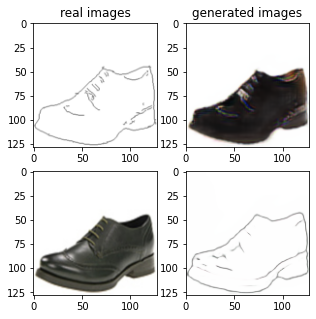

Train Epoch: 2 87% 	Total Loss: 1.193575 	Loss_G_AB: 0.338115	Loss_G_BA: 1.016166	Loss_cycle: 0.292768	Loss_D_A: 0.005063	Loss_D_B: 0.218605
1 93009 T:  1.3878321647644043
Train Epoch: 2 87% 	Total Loss: 1.221593 	Loss_G_AB: 0.285184	Loss_G_BA: 1.011084	Loss_cycle: 0.299359	Loss_D_A: 0.001365	Loss_D_B: 0.272735
1 93019 T:  0.6897387504577637
Train Epoch: 2 87% 	Total Loss: 1.253189 	Loss_G_AB: 0.355608	Loss_G_BA: 0.998653	Loss_cycle: 0.316277	Loss_D_A: 0.001301	Loss_D_B: 0.258481
1 93029 T:  0.6748995780944824
Train Epoch: 2 87% 	Total Loss: 1.284808 	Loss_G_AB: 0.284200	Loss_G_BA: 0.997461	Loss_cycle: 0.371834	Loss_D_A: 0.001216	Loss_D_B: 0.270928
1 93039 T:  0.6708598136901855
Train Epoch: 2 87% 	Total Loss: 1.197951 	Loss_G_AB: 0.276857	Loss_G_BA: 1.001323	Loss_cycle: 0.327331	Loss_D_A: 0.000766	Loss_D_B: 0.230764
1 93049 T:  0.6723854541778564
Train Epoch: 2 87% 	Total Loss: 1.281098 	Loss_G_AB: 0.346426	Loss_G_BA: 1.002769	Loss_cycle: 0.372816	Loss_D_A: 0.001174	Loss_D_B: 0.232510

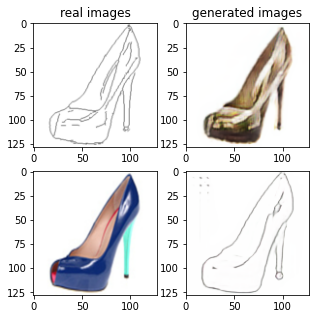

Train Epoch: 2 89% 	Total Loss: 1.319811 	Loss_G_AB: 0.335301	Loss_G_BA: 0.999294	Loss_cycle: 0.413356	Loss_D_A: 0.005482	Loss_D_B: 0.233675
1 94009 T:  1.4344496726989746
Train Epoch: 2 89% 	Total Loss: 1.211758 	Loss_G_AB: 0.256242	Loss_G_BA: 0.993126	Loss_cycle: 0.322595	Loss_D_A: 0.002123	Loss_D_B: 0.262356
1 94019 T:  0.6754012107849121
Train Epoch: 2 89% 	Total Loss: 1.154825 	Loss_G_AB: 0.265083	Loss_G_BA: 0.999214	Loss_cycle: 0.252996	Loss_D_A: 0.001884	Loss_D_B: 0.267797
1 94029 T:  0.6846308708190918
Train Epoch: 2 89% 	Total Loss: 1.279016 	Loss_G_AB: 0.307957	Loss_G_BA: 0.995501	Loss_cycle: 0.376886	Loss_D_A: 0.001896	Loss_D_B: 0.248505
1 94039 T:  0.6873881816864014
Train Epoch: 2 89% 	Total Loss: 1.200031 	Loss_G_AB: 0.304554	Loss_G_BA: 1.002522	Loss_cycle: 0.332022	Loss_D_A: 0.001726	Loss_D_B: 0.212745
1 94049 T:  0.6991214752197266
Train Epoch: 2 89% 	Total Loss: 1.259312 	Loss_G_AB: 0.307125	Loss_G_BA: 1.002645	Loss_cycle: 0.360480	Loss_D_A: 0.002545	Loss_D_B: 0.241402

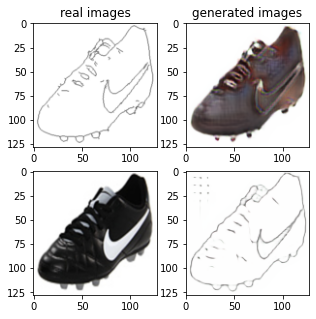

Train Epoch: 2 91% 	Total Loss: 1.200252 	Loss_G_AB: 0.315563	Loss_G_BA: 1.002467	Loss_cycle: 0.328454	Loss_D_A: 0.002443	Loss_D_B: 0.210340
1 95009 T:  1.4071004390716553
Train Epoch: 2 91% 	Total Loss: 1.247400 	Loss_G_AB: 0.321367	Loss_G_BA: 0.883204	Loss_cycle: 0.335711	Loss_D_A: 0.088255	Loss_D_B: 0.221148
1 95019 T:  0.6852576732635498
Train Epoch: 2 91% 	Total Loss: 1.330830 	Loss_G_AB: 0.295308	Loss_G_BA: 0.804589	Loss_cycle: 0.312580	Loss_D_A: 0.249253	Loss_D_B: 0.219048
1 95029 T:  0.6785459518432617
Train Epoch: 2 91% 	Total Loss: 1.291270 	Loss_G_AB: 0.272495	Loss_G_BA: 0.982357	Loss_cycle: 0.358528	Loss_D_A: 0.041452	Loss_D_B: 0.263864
1 95039 T:  0.7061975002288818
Train Epoch: 2 91% 	Total Loss: 1.313554 	Loss_G_AB: 0.279099	Loss_G_BA: 0.736639	Loss_cycle: 0.360515	Loss_D_A: 0.195672	Loss_D_B: 0.249498
1 95049 T:  0.6797363758087158
Train Epoch: 2 91% 	Total Loss: 1.230359 	Loss_G_AB: 0.321596	Loss_G_BA: 0.816731	Loss_cycle: 0.327175	Loss_D_A: 0.104406	Loss_D_B: 0.229615

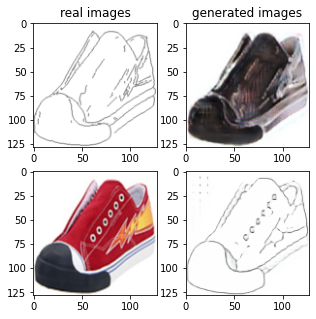

Train Epoch: 2 93% 	Total Loss: 1.242651 	Loss_G_AB: 0.285732	Loss_G_BA: 1.022460	Loss_cycle: 0.350163	Loss_D_A: 0.003170	Loss_D_B: 0.235222
1 96009 T:  2.2378580570220947
Train Epoch: 2 93% 	Total Loss: 1.218058 	Loss_G_AB: 0.283587	Loss_G_BA: 0.843540	Loss_cycle: 0.248364	Loss_D_A: 0.158323	Loss_D_B: 0.247807
1 96019 T:  0.6908128261566162
Train Epoch: 2 93% 	Total Loss: 1.240267 	Loss_G_AB: 0.261096	Loss_G_BA: 0.934366	Loss_cycle: 0.319773	Loss_D_A: 0.061371	Loss_D_B: 0.261392
1 96029 T:  0.6788299083709717
Train Epoch: 2 93% 	Total Loss: 1.313900 	Loss_G_AB: 0.302947	Loss_G_BA: 0.927649	Loss_cycle: 0.394674	Loss_D_A: 0.042387	Loss_D_B: 0.261542
1 96039 T:  0.6645843982696533
Train Epoch: 2 93% 	Total Loss: 1.285915 	Loss_G_AB: 0.316744	Loss_G_BA: 0.810305	Loss_cycle: 0.402208	Loss_D_A: 0.064881	Loss_D_B: 0.255302
1 96049 T:  0.6613931655883789
Train Epoch: 2 93% 	Total Loss: 1.212100 	Loss_G_AB: 0.316329	Loss_G_BA: 0.982046	Loss_cycle: 0.319620	Loss_D_A: 0.016141	Loss_D_B: 0.227151

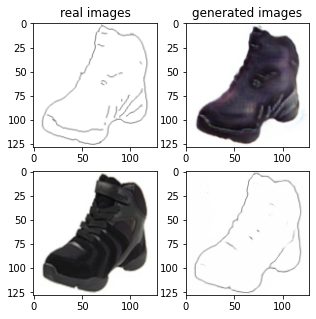

Train Epoch: 2 95% 	Total Loss: 1.227732 	Loss_G_AB: 0.268562	Loss_G_BA: 0.993545	Loss_cycle: 0.350507	Loss_D_A: 0.002017	Loss_D_B: 0.244154
1 97009 T:  1.4615273475646973
Train Epoch: 2 95% 	Total Loss: 1.245851 	Loss_G_AB: 0.279689	Loss_G_BA: 0.997343	Loss_cycle: 0.353743	Loss_D_A: 0.001351	Loss_D_B: 0.252241
1 97019 T:  0.6699445247650146
Train Epoch: 2 95% 	Total Loss: 1.236037 	Loss_G_AB: 0.312351	Loss_G_BA: 1.004041	Loss_cycle: 0.338474	Loss_D_A: 0.001366	Loss_D_B: 0.238001
1 97029 T:  0.6694254875183105
Train Epoch: 2 95% 	Total Loss: 1.243340 	Loss_G_AB: 0.307410	Loss_G_BA: 0.992865	Loss_cycle: 0.339999	Loss_D_A: 0.002652	Loss_D_B: 0.250551
1 97039 T:  0.7015500068664551
Train Epoch: 2 95% 	Total Loss: 1.281417 	Loss_G_AB: 0.327934	Loss_G_BA: 1.002502	Loss_cycle: 0.396458	Loss_D_A: 0.001759	Loss_D_B: 0.217982
1 97049 T:  0.7103860378265381
Train Epoch: 2 95% 	Total Loss: 1.278709 	Loss_G_AB: 0.285806	Loss_G_BA: 0.996332	Loss_cycle: 0.382048	Loss_D_A: 0.002361	Loss_D_B: 0.253232

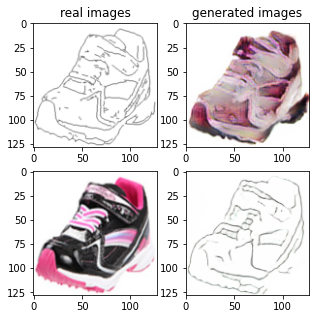

Train Epoch: 2 97% 	Total Loss: 1.437673 	Loss_G_AB: 0.267914	Loss_G_BA: 0.994276	Loss_cycle: 0.528327	Loss_D_A: 0.001815	Loss_D_B: 0.276437
1 98009 T:  1.5102086067199707
Train Epoch: 2 97% 	Total Loss: 1.277198 	Loss_G_AB: 0.277830	Loss_G_BA: 0.976100	Loss_cycle: 0.388580	Loss_D_A: 0.014691	Loss_D_B: 0.246962
1 98019 T:  0.6738584041595459
Train Epoch: 2 97% 	Total Loss: 1.331390 	Loss_G_AB: 0.283150	Loss_G_BA: 0.975989	Loss_cycle: 0.398415	Loss_D_A: 0.005138	Loss_D_B: 0.298267
1 98029 T:  0.6623954772949219
Train Epoch: 2 97% 	Total Loss: 1.259540 	Loss_G_AB: 0.290070	Loss_G_BA: 1.002830	Loss_cycle: 0.368539	Loss_D_A: 0.008480	Loss_D_B: 0.236071
1 98039 T:  0.6805720329284668
Train Epoch: 2 97% 	Total Loss: 1.433303 	Loss_G_AB: 0.331310	Loss_G_BA: 0.994041	Loss_cycle: 0.530163	Loss_D_A: 0.002754	Loss_D_B: 0.237710
1 98049 T:  0.6927282810211182
Train Epoch: 2 97% 	Total Loss: 1.187870 	Loss_G_AB: 0.297327	Loss_G_BA: 0.995277	Loss_cycle: 0.300604	Loss_D_A: 0.003850	Loss_D_B: 0.237114

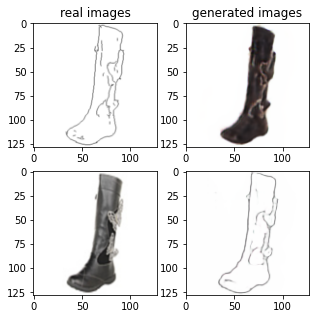

Train Epoch: 2 99% 	Total Loss: 1.240446 	Loss_G_AB: 0.352797	Loss_G_BA: 0.997763	Loss_cycle: 0.321694	Loss_D_A: 0.001070	Loss_D_B: 0.242402
1 99009 T:  1.420269250869751
Train Epoch: 2 99% 	Total Loss: 1.324855 	Loss_G_AB: 0.346987	Loss_G_BA: 0.999116	Loss_cycle: 0.363934	Loss_D_A: 0.001550	Loss_D_B: 0.286320
1 99019 T:  0.6644372940063477
Train Epoch: 2 99% 	Total Loss: 1.135462 	Loss_G_AB: 0.345976	Loss_G_BA: 0.992190	Loss_cycle: 0.263588	Loss_D_A: 0.001839	Loss_D_B: 0.200952
1 99029 T:  0.6808083057403564
Train Epoch: 2 99% 	Total Loss: 1.206787 	Loss_G_AB: 0.303263	Loss_G_BA: 0.983864	Loss_cycle: 0.276927	Loss_D_A: 0.002347	Loss_D_B: 0.283949
1 99039 T:  0.6633996963500977
Train Epoch: 2 99% 	Total Loss: 1.251284 	Loss_G_AB: 0.314655	Loss_G_BA: 1.013708	Loss_cycle: 0.343054	Loss_D_A: 0.003208	Loss_D_B: 0.240841
1 99049 T:  0.662459135055542
Train Epoch: 2 99% 	Total Loss: 1.271259 	Loss_G_AB: 0.291121	Loss_G_BA: 1.000423	Loss_cycle: 0.374792	Loss_D_A: 0.001366	Loss_D_B: 0.249329
1

In [8]:
import warnings
warnings.filterwarnings("ignore")
from torch.autograd import Variable
from torch.utils import data
from torch.utils.data import DataLoader, TensorDataset
from torch import nn, optim
from datasets import *
from models import *
import argparse, os
import itertools
import torch
import time
import pdb
import matplotlib.pyplot as plt


# Training Configurations
# (You may put your needed configuration here. Please feel free to add more or use argparse. )
DRIVE_MOUNT='/content/drive'
CIS680_FOLDER=os.path.join(DRIVE_MOUNT, 'My Drive', 'CIS680_2020')
HOMEWORK_FOLDER=os.path.join(CIS680_FOLDER, 'HW4')
os.makedirs(HOMEWORK_FOLDER, exist_ok=True)

train_img_dir = './edges2shoes/train/'
img_shape = (3, 128, 128)
n_residual_blocks = 6
num_epochs = 2
batch_size = 1
lr_rate = 0.0002      # Adam optimizer learning rate
betas = (0.5, 0.999)  # Adam optimizer beta 1, beta 2
lambda_cyc = 10.0 	  # cycle loss weight
latent_dim = 8        # latent dimension for the encoded images from domain B
report_feq = 10        # Visualize image every 'report_feq' iters
visual_feq = 1000
save_feq = 1000      # Save models every 'save_feq' iters

# Random seeds (optional)
torch.manual_seed(1); np.random.seed(1)

# set device
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

# Normalize image tensor
def norm(image):
    return (image/255.0-0.5)*2.0

# Denormalize image tensor
def denorm(tensor):
    return ((tensor+1.0)/2.0)*255.0

train_dataset = Edge2Shoe(train_img_dir)
train_loader = data.DataLoader(train_dataset, batch_size=batch_size)
print('the length of training data:', len(train_dataset))
# Losses
criterion_GAN = torch.nn.MSELoss()
criterion_cycle = torch.nn.L1Loss()

cuda = torch.cuda.is_available()

input_shape = img_shape

# Initialize generator and discriminator
G_AB = GeneratorResNet(input_shape, n_residual_blocks)
G_BA = GeneratorResNet(input_shape, n_residual_blocks)
D_A = Discriminator(input_shape)
D_B = Discriminator(input_shape)


if cuda:
    G_AB = G_AB.to(device)
    G_BA = G_BA.to(device)
    D_A = D_A.to(device)
    D_B = D_B.to(device)
    criterion_GAN.to(device)
    criterion_cycle.to(device)

# Initialize weights
G_AB.apply(weights_init_normal)
G_BA.apply(weights_init_normal)
D_A.apply(weights_init_normal)
D_B.apply(weights_init_normal)



# Define optimizer
optimizer_G = torch.optim.Adam(itertools.chain(G_AB.parameters(), G_BA.parameters()), lr=lr_rate, betas=betas)
optimizer_D_A = torch.optim.Adam(D_A.parameters(), lr=lr_rate, betas=betas)
optimizer_D_B = torch.optim.Adam(D_B.parameters(), lr=lr_rate, betas=betas)

# For adversarial loss
Tensor = torch.cuda.FloatTensor if cuda else torch.Tensor

# loss recorder
running_loss_D_A = 0
running_loss_D_B = 0
running_loss_GAN_AB = 0
running_loss_GAN_BA = 0
running_loss_cycle = 0
running_total_loss = 0

loss_D_A_list = []
loss_D_B_list = []
loss_GAN_AB_list = []
loss_GAN_BA_list = []
loss_cycle_list = []
total_loss_list = []
# Training
total_steps = len(train_loader)*num_epochs; step = 0
for e in range(num_epochs):
    start = time.time()
    for idx, data in enumerate(train_loader):
        ########## Process Inputs ##########
        edge_tensor, rgb_tensor = data
        edge_tensor, rgb_tensor = norm(edge_tensor).to(device), norm(rgb_tensor).to(device)
        real_A = edge_tensor; real_B = rgb_tensor;

        # Adversarial ground truths
        valid = Variable(Tensor(np.ones((real_A.size(0), *D_A.output_shape))), requires_grad=False)
        fake = Variable(Tensor(np.zeros((real_A.size(0), *D_A.output_shape))), requires_grad=False)

        # ------------------
        #  Train Generators
        # ------------------
        G_AB.train(); G_BA.train()
        optimizer_G.zero_grad()

        # Generator loss
        loss_GAN_AB, fake_B = loss_generator(G_AB, real_A, D_B, valid, criterion_GAN)
        loss_GAN_BA, fake_A = loss_generator(G_BA, real_B, D_A, valid, criterion_GAN)
        loss_GAN = (loss_GAN_AB + loss_GAN_BA) / 2

        # Cycle loss
        loss_cycle_A = loss_cycle_consis(G_BA, fake_B, real_A, criterion_cycle)
        loss_cycle_B = loss_cycle_consis(G_AB, fake_A, real_B, criterion_cycle)
        loss_cycle = (loss_cycle_A + loss_cycle_B) / 2

        # Total loss
        loss_G = loss_GAN + lambda_cyc * loss_cycle

        loss_G.backward()
        optimizer_G.step()


        # -----------------------
        #  Train Discriminator A
        # -----------------------

        optimizer_D_A.zero_grad()

        # function to compute loss_D_A
        loss_D_A = loss_discriminator(fake_A.detach(), D_A, real_A, valid, fake, criterion_GAN)
        loss_D_A = loss_D_A / 2
        # update the D_A network
        loss_D_A.backward()
        optimizer_D_A.step()


        # -----------------------
        #  Train Discriminator B
        # -----------------------
        optimizer_D_B.zero_grad()

        # function to compute loss_D_A
        loss_D_B = loss_discriminator(fake_B.detach(), D_B, real_B, valid, fake, criterion_GAN)
        loss_D_B = loss_D_B / 2
        # update the D_B network
        loss_D_B.backward()
        optimizer_D_B.step()


        



        running_total_loss += (loss_GAN + lambda_cyc * loss_cycle + loss_D_A + loss_D_B).item()

        running_loss_GAN_AB += loss_GAN_AB.item()
        running_loss_GAN_BA += loss_GAN_BA.item()
        running_loss_D_A += loss_D_A.item()
        running_loss_D_B += loss_D_B.item()
        running_loss_cycle += lambda_cyc * loss_cycle.item()
        ########## Visualization ##########
        if step % report_feq == report_feq-1:
            print('Train Epoch: {} {:.0f}% \tTotal Loss: {:.6f} \tLoss_G_AB: {:.6f}\tLoss_G_BA: {:.6f}\tLoss_cycle: {:.6f}\tLoss_D_A: {:.6f}\tLoss_D_B: {:.6f}'.format
                    (e+1, 100. * idx / len(train_loader), running_total_loss / report_feq, 
                    running_loss_GAN_AB/report_feq, running_loss_GAN_BA/report_feq, 
                    running_loss_cycle/report_feq, running_loss_D_A/report_feq, 
                    running_loss_D_B/report_feq))
            loss_D_A_list.append(running_loss_D_A/report_feq)
            loss_D_B_list.append(running_loss_D_B/report_feq)
            loss_GAN_AB_list.append(running_loss_GAN_AB/report_feq)
            loss_GAN_BA_list.append(running_loss_GAN_BA/report_feq)
            loss_cycle_list.append(running_loss_cycle/report_feq)
            running_loss_D_A = 0
            running_loss_D_B = 0
            running_loss_GAN_AB = 0
            running_loss_GAN_BA = 0
            running_loss_cycle = 0
            running_total_loss = 0
            end = time.time()
            print(e, step, 'T: ', end-start)
            start = end
        ########## Visualize Generated images ##########
        if step % visual_feq == 0:
            vis_fake_A = denorm(fake_A[0].detach()).cpu().data.numpy().astype(np.uint8)
            vis_fake_B = denorm(fake_B[0].detach()).cpu().data.numpy().astype(np.uint8)
            vis_real_B = denorm(real_B[0].detach()).cpu().data.numpy().astype(np.uint8)
            vis_real_A = denorm(real_A[0].detach()).cpu().data.numpy().astype(np.uint8)
            fig, axs = plt.subplots(2,2, figsize = (5,5))	
            
            axs[0,0].imshow(vis_real_A.transpose(1,2,0))
            axs[0,0].set_title('real images')
            axs[0,1].imshow(vis_fake_B.transpose(1,2,0))
            axs[0,1].set_title('generated images')
            axs[1,0].imshow(vis_real_B.transpose(1,2,0))
            axs[1,1].imshow(vis_fake_A.transpose(1,2,0))
            plt.show()
        ########## Save Generators ##########
        if step % save_feq == save_feq-1:
            if not os.path.exists('models'): os.mkdir('models')
            torch.save(G_AB, HOMEWORK_FOLDER + '/G_AB.pt') #'/content/models/G_AB.pt'
            torch.save(G_BA, HOMEWORK_FOLDER + '/G_BA.pt')
            loss_list = [loss_D_A_list,loss_D_B_list,loss_GAN_AB_list,loss_GAN_BA_list,loss_cycle_list]
            torch.save({'loss_list':loss_list},HOMEWORK_FOLDER+'/loss.pt')

            # feel free to save checkpoint if you need retrain the model...

        step += 1

# CycleGAN testing (TODO)

In [9]:
from torch.utils.data import DataLoader, TensorDataset
test_batch_size = 1
test_img_dir = './edges2shoes/val/'
test_dataset = Edge2Shoe(test_img_dir)
test_loader = DataLoader(test_dataset, batch_size=test_batch_size)

In [12]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
G_AB = torch.load( HOMEWORK_FOLDER + '/G_AB.pt')
G_BA = torch.load( HOMEWORK_FOLDER + '/G_BA.pt')
if cuda:
    G_AB = G_AB.to(device)
    G_BA = G_BA.to(device)

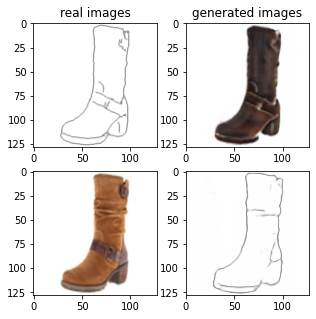

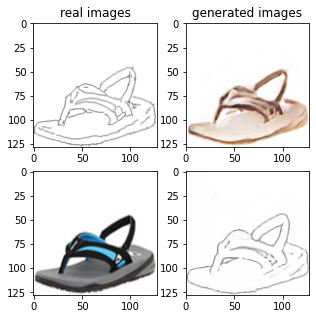

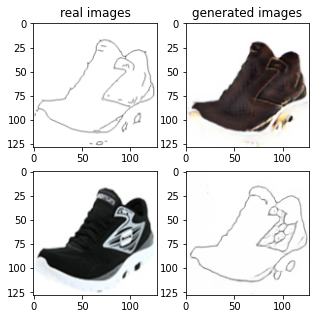

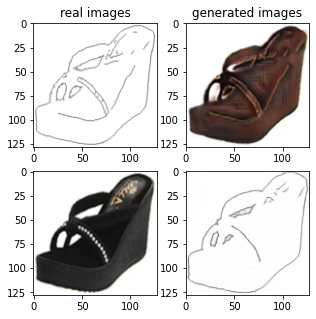

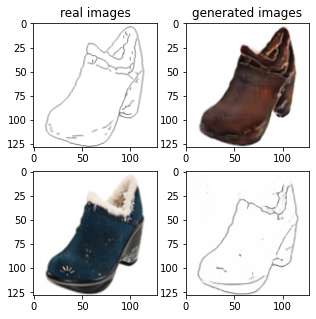

In [17]:
G_AB.eval()
G_BA.eval()

################################
# Please visualize real_edge, fake_shoe, real_shoe, fake_edge in 2-by-2 grids:

################################        
with torch.no_grad():
  for idx, data in enumerate(train_loader):
    edge_tensor, rgb_tensor = data
    edge_tensor, rgb_tensor = norm(edge_tensor).to(device), norm(rgb_tensor).to(device)
    real_A = edge_tensor; real_B = rgb_tensor;
    fake_B = G_AB(real_A)
    fake_A = G_BA(real_B)
    vis_fake_A = denorm(fake_A[0]).cpu().data.numpy().astype(np.uint8)
    vis_fake_B = denorm(fake_B[0]).cpu().data.numpy().astype(np.uint8)
    vis_real_B = denorm(real_B[0]).cpu().data.numpy().astype(np.uint8)
    vis_real_A = denorm(real_A[0]).cpu().data.numpy().astype(np.uint8)

    fig, axs = plt.subplots(2,2, figsize = (5,5))	
    axs[0,0].imshow(vis_real_A.transpose(1,2,0))
    axs[0,0].set_title('real images')
    axs[0,1].imshow(vis_fake_B.transpose(1,2,0))
    axs[0,1].set_title('generated images')
    axs[1,0].imshow(vis_real_B.transpose(1,2,0))
    axs[1,1].imshow(vis_fake_A.transpose(1,2,0))
    plt.savefig(HOMEWORK_FOLDER+'cycleGan_vis'+str(idx)+'.png')
    plt.show()
    if idx == 4:
      break


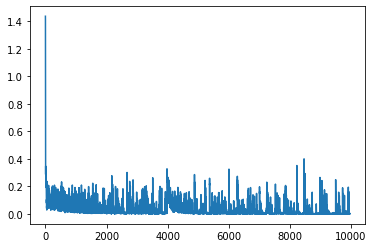

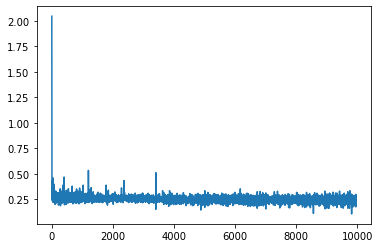

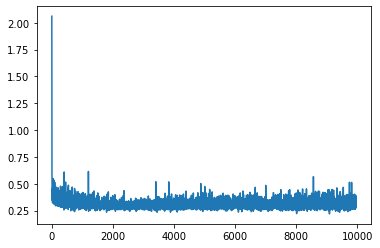

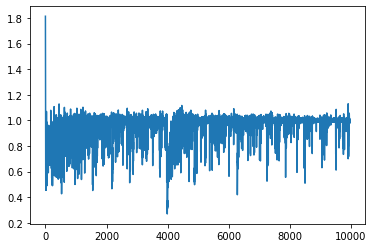

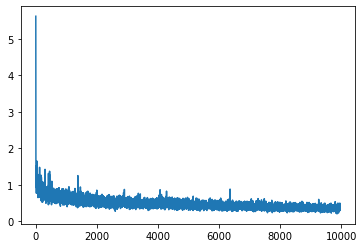

In [24]:
plt.plot(loss_D_A_list)
plt.show()
plt.plot(loss_D_B_list)
plt.show()
plt.plot(loss_GAN_AB_list)
plt.show()
plt.plot(loss_GAN_BA_list)
plt.show()
plt.plot(loss_cycle_list)
plt.show()

# Quantitative Evaluation

## FID Score computation

First, we have to create 6 datasets:
- Domain A real set 1
- Domain A real set 2
- Domain A generate set

- Domain B real set 1
- Domain B real set 2
- Domain B generate set



Create folder to save images and create dataset.

In [18]:
! mkdir real_A_1 real_A_2 gen_A
! mkdir real_B_1 real_B_2 gen_B

In [20]:
# First create test data loader
from torch.utils.data import DataLoader, TensorDataset
from torchvision.utils import save_image
test_batch_size = 1
test_img_dir = './edges2shoes/val/'
test_dataset = Edge2Shoe(test_img_dir)
test_loader = DataLoader(test_dataset, batch_size=test_batch_size)

# indicate the device we will use
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

# Load learnt Generator G_AB and G_BA
G_AB = torch.load( HOMEWORK_FOLDER + '/G_AB.pt').to(device)
G_BA = torch.load( HOMEWORK_FOLDER + '/G_BA.pt').to(device)

# the size of dataset, we want to evaluate on
evaluate_num = 100

# make the gen data set and folder
real_A_set_1 = []
real_A_set_2 = []
real_B_set_1 = []
real_B_set_2 = []

gen_set_A = []
gen_set_B = []

for idx, data in enumerate(test_loader, 0):
    real_A, real_B = data
    # plt.imshow(real_A.type(torch.uint8).squeeze(0).cpu().permute(1,2,0))
    # plt.show()
    real_A, real_B = norm(real_A).to(device), norm(real_B).to(device)
    # plt.imshow(denorm(real_A).type(torch.uint8).squeeze(0).cpu().permute(1,2,0))
    # plt.imshow(denorm(real_A).squeeze(0).cpu().permute(1,2,0))
    # plt.show()
    # print(real_A.shape)
    
    if idx < evaluate_num:
        fake_A = G_BA(real_B)
        fake_B = G_AB(real_A)
        real_A_set_1.append(denorm(real_A.detach()))
        real_B_set_1.append(denorm(real_B.detach()))
        gen_set_A.append(denorm(fake_A.detach()))
        gen_set_B.append(denorm(fake_B.detach()))
        
        # plt.imshow(data[0].type(torch.uint8).squeeze(0).permute(1,2,0))
        # plt.imshow(denorm(real_A).squeeze(0).cpu().permute(1,2,0))
        # plt.imshow(denorm(real_A).type(torch.uint8).squeeze(0).cpu().permute(1,2,0))
        # plt.show()
        plt.imsave('./real_A_1/real_A' + str(idx) + '.png', denorm(real_A).type(torch.uint8).cpu().squeeze().permute(1,2,0).numpy())
        plt.imsave('./real_B_1/real_B' + str(idx) + '.png', denorm(real_B).type(torch.uint8).cpu().squeeze().permute(1,2,0).numpy())
        plt.imsave('./gen_A/gen_A' + str(idx) + '.png', denorm(fake_A).type(torch.uint8).cpu().squeeze().permute(1,2,0).numpy())
        plt.imsave('./gen_B/gen_B' + str(idx) + '.png', denorm(fake_B).type(torch.uint8).cpu().squeeze().permute(1,2,0).numpy())
        # save_image(denorm(real_A).type(torch.uint8).squeeze(), './real_A_1/real_A' + str(idx) + '.png', normalize=False)

        # save_image(denorm(real_B).detach().squeeze(), './real_B_1/real_B' + str(idx) + '.png', normalize=False)
        # save_image(denorm(fake_A).detach().squeeze(), './gen_A/gen_A' + str(idx) + '.png', normalize=False)
        # save_image(denorm(fake_B).detach().squeeze(), './gen_B/gen_B' + str(idx) + '.png', normalize=False)
        # del real_A; del real_B; del fake_A; del fake_B

    elif evaluate_num <= idx < 2*evaluate_num:
        real_A_set_2.append(real_A.detach())
        real_B_set_2.append(real_B.detach())
        plt.imsave('./real_A_2/real_A' + str(idx) + '.png', denorm(real_A).type(torch.uint8).cpu().squeeze().permute(1,2,0).numpy())
        plt.imsave('./real_B_2/real_B' + str(idx) + '.png', denorm(real_B).type(torch.uint8).cpu().squeeze().permute(1,2,0).numpy())
        # save_image(denorm(real_A).detach().squeeze(), './real_A_2/real_A' + str(idx) + '.png', normalize=False)
        # save_image(denorm(real_B).detach().squeeze(), './real_B_2/real_B' + str(idx) + '.png', normalize=False)
    
    if idx == 2*evaluate_num-1:
        break
# make 6 pytorch dataset
real_A_dataset_1 = TensorDataset(torch.cat(real_A_set_1))
real_A_dataset_2 = TensorDataset(torch.cat(real_A_set_2))
real_B_dataset_1 = TensorDataset(torch.cat(real_B_set_1))
real_B_dataset_2 = TensorDataset(torch.cat(real_B_set_2))
gen_dataset_A = TensorDataset(torch.cat(gen_set_A))
gen_dataset_B = TensorDataset(torch.cat(gen_set_B))



## Compute FID score

In [21]:
! pip install pytorch-fid

  Created wheel for pytorch-fid: filename=pytorch_fid-0.1.1-cp36-none-any.whl size=10188 sha256=60d0b1f4b25a32211ac24c77781e6aff471a4d0219e2f58422192b7d920ed3f5
  Stored in directory: /root/.cache/pip/wheels/b8/93/92/a6a8add9047b97dcb2470d2d1642450e6b76b5988e9744e3f0
Successfully built pytorch-fid


In [22]:
print('computing FID score between real_edge_1 and real_edge_2')
! python -m pytorch_fid '/content/real_A_1' '/content/real_A_2' --gpu 0

print('computing FID score between real_edge_1 and gen_edge')
! python -m pytorch_fid '/content/real_A_1' '/content/gen_A' --gpu 0

print('computing FID score between real_shoe_1 and real_shoe_2')
! python -m pytorch_fid '/content/real_B_1' '/content/real_B_2' --gpu 0

print('computing FID score between real_shoe_1 and gen_shoe')
! python -m pytorch_fid '/content/real_B_1' '/content/gen_B' --gpu 0

computing FID score between real_edge_1 and real_edge_2
Downloading: "https://github.com/mseitzer/pytorch-fid/releases/download/fid_weights/pt_inception-2015-12-05-6726825d.pth" to /root/.cache/torch/hub/checkpoints/pt_inception-2015-12-05-6726825d.pth
100% 91.2M/91.2M [00:03<00:00, 29.6MB/s]
100% 2/2 [00:00<00:00,  8.30it/s]
100% 2/2 [00:00<00:00,  9.31it/s]
FID:  51.65125472373556
computing FID score between real_edge_1 and gen_edge
100% 2/2 [00:00<00:00,  9.26it/s]
100% 2/2 [00:00<00:00,  8.48it/s]
FID:  81.0399627894713
computing FID score between real_shoe_1 and real_shoe_2
100% 2/2 [00:00<00:00,  7.49it/s]
100% 2/2 [00:00<00:00,  7.42it/s]
FID:  58.85457114374489
computing FID score between real_shoe_1 and gen_shoe
100% 2/2 [00:00<00:00,  8.15it/s]
100% 2/2 [00:00<00:00,  7.30it/s]
FID:  105.81852520832459


## Compute IS score

In [23]:
from inception_score import inception_score
import warnings
warnings.filterwarnings("ignore")

print('IS score for real_edge_1 data set:')
print(inception_score(real_A_dataset_1, cuda=True, batch_size=64, resize=True, splits=1))
print('IS score for gen_edge data set:')
print(inception_score(gen_dataset_A, cuda=True, batch_size=64, resize=True, splits=1))


print('IS score for real_shoe_1:')
print(inception_score(real_B_dataset_1, cuda=True, batch_size=64, resize=True, splits=1))
print('IS score for gen_shoe data set:')
print(inception_score(gen_dataset_B, cuda=True, batch_size=64, resize=True, splits=1))

IS score for real_edge_1 data set:


Downloading: "https://download.pytorch.org/models/inception_v3_google-1a9a5a14.pth" to /root/.cache/torch/hub/checkpoints/inception_v3_google-1a9a5a14.pth



1.001472220463397
IS score for gen_edge data set:
1.0019077922157653
IS score for real_shoe_1:
3.342128280677282
IS score for gen_shoe data set:
3.7992882253508147
